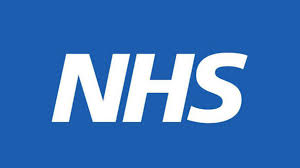

# Diagnostic Analysis using Python Assignment

## LSE Data Analytics Career Accelerator
### Course 2: LSE_DA201_Data Analytics using Python_P4_2024
#### Dhondee_Kelvin_DA201_Assignment Notebook Feb 2025

Please use the Table of Contents functionality (under View) to aid with navigating this notebook.

# 1. Introduction

## 1.1 Purpose of the analysis

This analysis attempts to address the following questions in relation to the National Health Service (NHS) in England:

1)	Has there been adequate staff and capacity in the networks?
2)	What was the utilisation of resources?

The analysis utilises Python and its powerful libraries to explore the available data, create visualisations to identify trends, and extract meaningful insights to inform decision-making. 

The analysis utilises all the files which were initially provided:

- actual.duration.csv
- appointments_duration.csv
- national_categories.csv
- tweets.csv

For more information on the above files, please refer to metadata_nhs.txt and the related technical report. 

The analysis was further enriched with the use/merge of the following:
- icb_region_names.csv (section 2.3)
- reg_list_size.csv (section 9.1)
- imd_score.csv (section 9.4 onwards)
- icb_patient_staffing.csv (section 10.1.1 onwards)

As a framework to set up the analysis, below is a fishbone diagram adapted in order to identify avenues for exploration and analysis. 

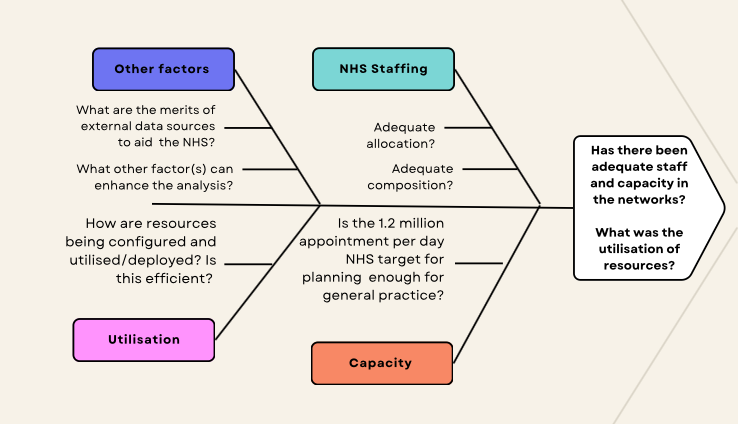

## 1.2 Limitation of the data

a) The metadata states that the count of appointments is an estimated number of total appointments as not all practices in England are included.

b) The data is drawn from an experimental statistics publication. 

Experimental statistics are series of statistics that are in the testing phase and not yet fully developed for several reasons such as:
- poor coverage
- poor data quality
- data undergoing evaluation

Data in the appointments in general practice collection is known to contain a number of data quality issues. This is due to variation in working methods and recording between different practices and PCNs. Practices and PCNs manage their appointment systems in the way they best feel allows them to manage the health and care of their patients and not for the purpose of data analysis and there is a widespread variation in approach to appointment management between practices.

https://digital.nhs.uk/data-and-information/publications/statistical/appointments-in-general-practice/appointments-in-general-practice-supporting-information#data-quality


## 1.3 What are Integrated Care Boards (ICBs)

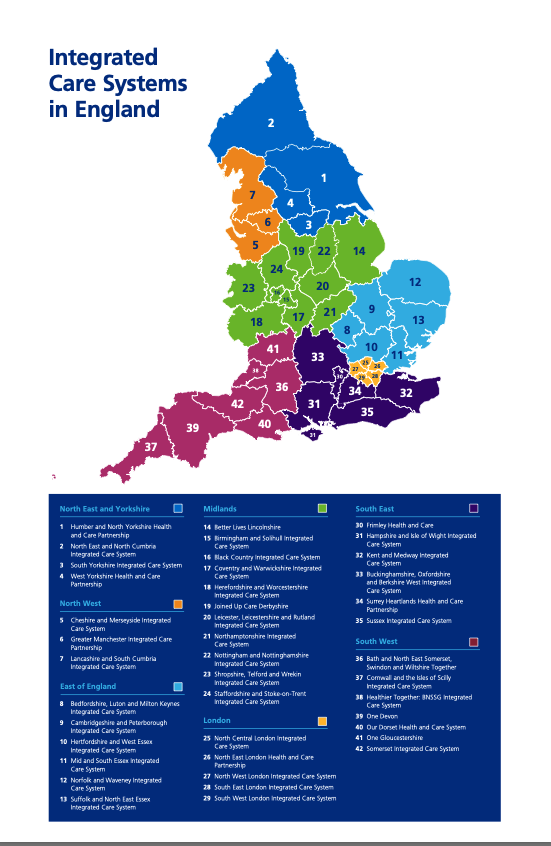

The NHS organisations and upper-tier local authorities in each ICS run a joint committee called an integrated care partnership (ICP). This is a broad alliance of partners who all have a role in improving local health, care and wellbeing. They may also include social care providers, the voluntary, community and social enterprise sector and others with a role in improving health and wellbeing for local people such as education, housing, employment or police and fire services.

Each ICP must develop a long-term strategy to improve health and social care services and people’s health and wellbeing in the area. They may also take on additional responsibilities, as agreed locally between the members.

Integrated care boards (ICBs) are NHS organisations responsible for planning health services for their local population. There is one ICB in each ICS area. They manage the NHS budget and work with local providers of NHS services, such as hospitals and GP practices, to agree a joint five-year plan which says how the NHS will contribute to the ICP’s integrated care strategy.

https://www.england.nhs.uk/integratedcare/what-is-integrated-care/#:~:text=There%20is%20one%20ICB%20in,the%20ICP's%20integrated%20care%20strategy.

# 2. Pre-analysis configuration and importing the data

## 2.1 Standard library imports

In [1]:
# Being the import of necessary libraries.

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk #!pip install nltk if required.
nltk.download('vader_lexicon')
from nltk.sentiment import SentimentIntensityAnalyzer
import matplotlib.dates as mdates
from matplotlib.ticker import FuncFormatter
from datetime import date, time, datetime
from statsmodels.tsa.seasonal import seasonal_decompose
import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /Users/kelvin/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


## 2.2 Setting up common functions

In [2]:
# Function to validate data.

def validate_data(df):
    # view DataFrame.
    print("\nFirst 5 rows of DataFrame:")
    display(df.head())

    print("\nLast 5 rows of Dataframe:")
    display(df.tail())
    
    shape = df.shape
    print("\nShape of DataFrame:")
    print(shape)
    
    # review metadata.
    print("\nDataFrame Info:")
    info = df.info()

    # check for missing values.
    missing_values = df.isnull().sum()
    print("\nNumber of nulls per column:")
    print(missing_values)
          
    # check for unique values.
    unique_counts = df.nunique()
    print("\nUnique values per column:")
    print(unique_counts)

    # check for duplicates.
    duplicate_counts = df.duplicated().sum()
    print("\nNumber of duplicate rows:")
    print(duplicate_counts)

    # summary statistics.
    summary_stats = df.describe().round(2)
    print("\nSummary statistics:")
    print(summary_stats)

In [3]:
# Function for standard bar chart.

def standard_bar_chart(df, x, y, title="Bar Chart", color='blue'):
    plt.figure(figsize=(10, 6))
    plt.ticklabel_format(style='plain', axis='y')
    sns.barplot(data=df, x=x, y=y, color=color)
    plt.title(title)
    plt.xlabel(x)
    plt.ylabel(y)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [4]:
# Function to clean labels.

def clean_label(label):
    return label.replace('_', ' ').title()


# Function to generate time series plot with trendline. 

def generate_time_series_plot_with_trendline(df, time_col, value_col, title="Time Series Plot with Trendline"):
    
    # Ensure time column is in datetime format.
    df[time_col] = pd.to_datetime(df[time_col])
    
    # Sort DataFrame by the time column.
    df.sort_values(by=time_col, inplace=True)
    
    # Calculate trendline.
    x = np.arange(len(df))
    y = df[value_col].values
    z = np.polyfit(x, y, 1)
    p = np.poly1d(z)
    
    plt.figure(figsize=(12, 6))
    
    # Plot the time series.
    sns.lineplot(data=df, x=time_col, y=value_col, label='Observed')
    
    # Plot the trendline.
    plt.plot(df[time_col], p(x), linestyle='--', color='red', label='Trendline')

    # Format y-axis to show millions.
    plt.gca().yaxis.set_major_formatter(plt.FuncFormatter(lambda x, p: f'{x/1e6:.1f}M'))

    # Customize the plot.
    plt.title(title)
    plt.xlabel(clean_label(time_col))
    plt.ylabel(clean_label(value_col))
    plt.legend()
    plt.tight_layout()
    plt.show()

## 2.3 Importing the data

In [5]:
ad_raw = pd.read_csv('actual_duration.csv')
ar_raw = pd.read_csv('appointments_regional.csv')
nc_raw = pd.read_excel('national_categories.xlsx')
icb_region_names = pd.read_csv('icb_region_names.csv')

In [6]:
# The import and subsequent merge  of icb_region_names is to access the region names of ICB locations.

display(icb_region_names.head())

,icb_ons_code,icb_name,region_name
0,E54000040,"Bath and North East Somerset, Swindon and Wilt...",South West
1,E54000024,"Bedfordshire, Luton and Milton Keynes ICB",East of England
2,E54000055,Birmingham and Solihull ICB,Midlands
3,E54000062,Black Country ICB,Midlands
4,E54000039,"Bristol, North Somerset and South Gloucestersh...",South West


In [7]:
ad_merged = pd.merge(ad_raw, icb_region_names, \
                     how='left', \
                     on='icb_ons_code')

In [8]:
ar_merged = pd.merge(ar_raw, icb_region_names, \
                     how='left', \
                     on='icb_ons_code')

In [9]:
nc_merged = pd.merge(nc_raw, icb_region_names, \
                     how='left', \
                     on='icb_ons_code')

# 3. Data validation and cleaning

This section prepares the three datasets for further analysis.

The function validata_data() is used to check for descriptive statistics, nulls, unique, values and duplicate rows.

These issues are addressed if needed.

Where required a subset of a DataFrame or the order of columns in a DataFrame were rearranged to aid analysis.

## 3.1 actual_duration

In [10]:
# View ad_merged info.

ad_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137793 entries, 0 to 137792
Data columns (total 10 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   sub_icb_location_code      137793 non-null  object
 1   sub_icb_location_ons_code  137793 non-null  object
 2   sub_icb_location_name      137793 non-null  object
 3   icb_ons_code               137793 non-null  object
 4   region_ons_code            137793 non-null  object
 5   appointment_date           137793 non-null  object
 6   actual_duration            137793 non-null  object
 7   count_of_appointments      137793 non-null  int64 
 8   icb_name                   137793 non-null  object
 9   region_name                137793 non-null  object
dtypes: int64(1), object(9)
memory usage: 10.5+ MB


In [11]:
# subset ad_merged.

""" 
Having perused the metadata and conducted initial research, 
the ons codes and the sub_icb_location_code were not deemed necessary for the analysis.
"""

ad = ad_merged[['icb_ons_code', 'sub_icb_location_name', 'icb_name', 'region_name',
    'appointment_date', 'actual_duration', 'count_of_appointments']]

In [12]:
validate_data(ad)


First 5 rows of DataFrame:


,icb_ons_code,sub_icb_location_name,icb_name,region_name,appointment_date,actual_duration,count_of_appointments
0,E54000050,NHS North East and North Cumbria ICB - 00L,North East and North Cumbria ICB,North East and Yorkshire,01-Dec-21,31-60 Minutes,364
1,E54000050,NHS North East and North Cumbria ICB - 00L,North East and North Cumbria ICB,North East and Yorkshire,01-Dec-21,21-30 Minutes,619
2,E54000050,NHS North East and North Cumbria ICB - 00L,North East and North Cumbria ICB,North East and Yorkshire,01-Dec-21,6-10 Minutes,1698
3,E54000050,NHS North East and North Cumbria ICB - 00L,North East and North Cumbria ICB,North East and Yorkshire,01-Dec-21,Unknown / Data Quality,1277
4,E54000050,NHS North East and North Cumbria ICB - 00L,North East and North Cumbria ICB,North East and Yorkshire,01-Dec-21,16-20 Minutes,730



Last 5 rows of Dataframe:


,icb_ons_code,sub_icb_location_name,icb_name,region_name,appointment_date,actual_duration,count_of_appointments
137788,E54000054,NHS West Yorkshire ICB - X2C4Y,West Yorkshire ICB,North East and Yorkshire,30-Jun-22,31-60 Minutes,430
137789,E54000054,NHS West Yorkshire ICB - X2C4Y,West Yorkshire ICB,North East and Yorkshire,30-Jun-22,21-30 Minutes,751
137790,E54000054,NHS West Yorkshire ICB - X2C4Y,West Yorkshire ICB,North East and Yorkshire,30-Jun-22,16-20 Minutes,921
137791,E54000054,NHS West Yorkshire ICB - X2C4Y,West Yorkshire ICB,North East and Yorkshire,30-Jun-22,11-15 Minutes,1439
137792,E54000054,NHS West Yorkshire ICB - X2C4Y,West Yorkshire ICB,North East and Yorkshire,30-Jun-22,1-5 Minutes,1739



Shape of DataFrame:
(137793, 7)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 137793 entries, 0 to 137792
Data columns (total 7 columns):
 #   Column                 Non-Null Count   Dtype 
---  ------                 --------------   ----- 
 0   icb_ons_code           137793 non-null  object
 1   sub_icb_location_name  137793 non-null  object
 2   icb_name               137793 non-null  object
 3   region_name            137793 non-null  object
 4   appointment_date       137793 non-null  object
 5   actual_duration        137793 non-null  object
 6   count_of_appointments  137793 non-null  int64 
dtypes: int64(1), object(6)
memory usage: 7.4+ MB

Number of nulls per column:
icb_ons_code             0
sub_icb_location_name    0
icb_name                 0
region_name              0
appointment_date         0
actual_duration          0
count_of_appointments    0
dtype: int64

Unique values per column:
icb_ons_code               42
sub_icb_location_name     106
icb_

## 3.2 appointments_regional

In [13]:
# View ar_merged info.

ar_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 596821 entries, 0 to 596820
Data columns (total 9 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   icb_ons_code                       596821 non-null  object
 1   appointment_month                  596821 non-null  object
 2   appointment_status                 596821 non-null  object
 3   hcp_type                           596821 non-null  object
 4   appointment_mode                   596821 non-null  object
 5   time_between_book_and_appointment  596821 non-null  object
 6   count_of_appointments              596821 non-null  int64 
 7   icb_name                           596821 non-null  object
 8   region_name                        596821 non-null  object
dtypes: int64(1), object(8)
memory usage: 41.0+ MB


In [14]:
# Re-arranging the order the columns for ar_merged.

new_ar_order = ['icb_ons_code', 'icb_name', 'region_name', \
                'appointment_month', 'appointment_status', \
                'hcp_type', 'appointment_mode', \
                'time_between_book_and_appointment', 'count_of_appointments']

ar_merged = ar_merged[new_ar_order]

In [15]:
validate_data(ar_merged)


First 5 rows of DataFrame:


,icb_ons_code,icb_name,region_name,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments
0,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,1 Day,8107
1,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,15 to 21 Days,6791
2,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,2 to 7 Days,20686
3,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,22 to 28 Days,4268
4,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,8 to 14 Days,11971



Last 5 rows of Dataframe:


,icb_ons_code,icb_name,region_name,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments
596816,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,2 to 7 Days,21
596817,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,22 to 28 Days,8
596818,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,8 to 14 Days,28
596819,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,More than 28 Days,17
596820,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,Same Day,10



Shape of DataFrame:
(596821, 9)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 596821 entries, 0 to 596820
Data columns (total 9 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   icb_ons_code                       596821 non-null  object
 1   icb_name                           596821 non-null  object
 2   region_name                        596821 non-null  object
 3   appointment_month                  596821 non-null  object
 4   appointment_status                 596821 non-null  object
 5   hcp_type                           596821 non-null  object
 6   appointment_mode                   596821 non-null  object
 7   time_between_book_and_appointment  596821 non-null  object
 8   count_of_appointments              596821 non-null  int64 
dtypes: int64(1), object(8)
memory usage: 41.0+ MB

Number of nulls per column:
icb_ons_code                         0
icb_name         

### 3.2.1 Removal of duplicates identified in ar dataset

In [16]:
# % of duplicates in ar_merged DataFrame.

ar_duplicates = round(21604/596821*100, 2)
print(f"% of duplicate rows: {ar_duplicates}", f"%")

% of duplicate rows: 3.62 %


The ar dataset does not feature the related sub-icb columns. It is unusual for an aggregated datset to have duplicates and a possible explanation for why this has happened is the removal of the related sub-icb columns after aggregation at ICB/regional level.

It is not possible to ascertain whether these are actual duplicates. However, given that it only represents 3.62% of the data, these will be removed.

In [17]:
# Dropping duplicates from ar_merged and assigning to ar.
# View ar info and checking whether duplicates were removed.

ar = ar_merged.drop_duplicates()
ar.info()
print(f"Number of duplicate rows in ar: {ar.duplicated().sum()}")

<class 'pandas.core.frame.DataFrame'>
Index: 575217 entries, 0 to 596819
Data columns (total 9 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   icb_ons_code                       575217 non-null  object
 1   icb_name                           575217 non-null  object
 2   region_name                        575217 non-null  object
 3   appointment_month                  575217 non-null  object
 4   appointment_status                 575217 non-null  object
 5   hcp_type                           575217 non-null  object
 6   appointment_mode                   575217 non-null  object
 7   time_between_book_and_appointment  575217 non-null  object
 8   count_of_appointments              575217 non-null  int64 
dtypes: int64(1), object(8)
memory usage: 43.9+ MB
Number of duplicate rows in ar: 0


In [18]:
validate_data(ar)


First 5 rows of DataFrame:


,icb_ons_code,icb_name,region_name,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments
0,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,1 Day,8107
1,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,15 to 21 Days,6791
2,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,2 to 7 Days,20686
3,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,22 to 28 Days,4268
4,E54000034,Frimley ICB,South East,2020-01,Attended,GP,Face-to-Face,8 to 14 Days,11971



Last 5 rows of Dataframe:


,icb_ons_code,icb_name,region_name,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments
596813,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Telephone,Same Day,10
596815,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,15 to 21 Days,13
596816,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,2 to 7 Days,21
596818,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,8 to 14 Days,28
596819,E54000050,North East and North Cumbria ICB,North East and Yorkshire,2022-06,Unknown,Unknown,Unknown,More than 28 Days,17



Shape of DataFrame:
(575217, 9)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
Index: 575217 entries, 0 to 596819
Data columns (total 9 columns):
 #   Column                             Non-Null Count   Dtype 
---  ------                             --------------   ----- 
 0   icb_ons_code                       575217 non-null  object
 1   icb_name                           575217 non-null  object
 2   region_name                        575217 non-null  object
 3   appointment_month                  575217 non-null  object
 4   appointment_status                 575217 non-null  object
 5   hcp_type                           575217 non-null  object
 6   appointment_mode                   575217 non-null  object
 7   time_between_book_and_appointment  575217 non-null  object
 8   count_of_appointments              575217 non-null  int64 
dtypes: int64(1), object(8)
memory usage: 43.9+ MB

Number of nulls per column:
icb_ons_code                         0
icb_name              

## 3.3 national_categories

In [19]:
# View nc_merged info.

nc_merged.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817394 entries, 0 to 817393
Data columns (total 10 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   appointment_date       817394 non-null  datetime64[ns]
 1   icb_ons_code           817394 non-null  object        
 2   sub_icb_location_name  817394 non-null  object        
 3   service_setting        817394 non-null  object        
 4   context_type           817394 non-null  object        
 5   national_category      817394 non-null  object        
 6   count_of_appointments  817394 non-null  int64         
 7   appointment_month      817394 non-null  object        
 8   icb_name               817394 non-null  object        
 9   region_name            817394 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(8)
memory usage: 62.4+ MB


In [20]:
# Re-arranging the order the columns and assigning to nc.

nc = nc_merged[['icb_ons_code', 'icb_name', 'region_name', \
                'sub_icb_location_name', 'appointment_month', \
                'appointment_date', 'service_setting', \
                'context_type', 'national_category', \
                'count_of_appointments']]

In [21]:
validate_data(nc)


First 5 rows of DataFrame:


,icb_ons_code,icb_name,region_name,sub_icb_location_name,appointment_month,appointment_date,service_setting,context_type,national_category,count_of_appointments
0,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,Primary Care Network,Care Related Encounter,Patient contact during Care Home Round,3
1,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,Other,Care Related Encounter,Planned Clinics,7
2,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,Home Visit,79
3,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,General Consultation Acute,725
4,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,Structured Medication Review,2



Last 5 rows of Dataframe:


,icb_ons_code,icb_name,region_name,sub_icb_location_name,appointment_month,appointment_date,service_setting,context_type,national_category,count_of_appointments
817389,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,Unplanned Clinical Activity,12
817390,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,Planned Clinics,4
817391,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,Planned Clinical Procedure,92
817392,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,General Consultation Routine,4
817393,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,General Consultation Acute,19



Shape of DataFrame:
(817394, 10)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 817394 entries, 0 to 817393
Data columns (total 10 columns):
 #   Column                 Non-Null Count   Dtype         
---  ------                 --------------   -----         
 0   icb_ons_code           817394 non-null  object        
 1   icb_name               817394 non-null  object        
 2   region_name            817394 non-null  object        
 3   sub_icb_location_name  817394 non-null  object        
 4   appointment_month      817394 non-null  object        
 5   appointment_date       817394 non-null  datetime64[ns]
 6   service_setting        817394 non-null  object        
 7   context_type           817394 non-null  object        
 8   national_category      817394 non-null  object        
 9   count_of_appointments  817394 non-null  int64         
dtypes: datetime64[ns](1), int64(1), object(8)
memory usage: 62.4+ MB

Number of nulls per column:
icb_ons_code       

# 4. Outlier Analysis

The common numerical variable in all three datasets is count_of_appointments. This section examines this variable for all three datasets using box plots in order to identify any outliers.

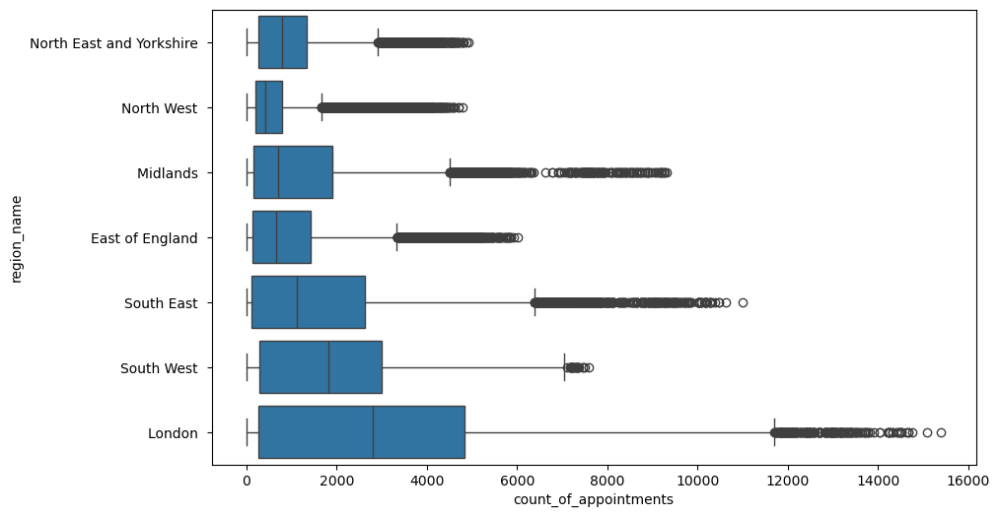

In [22]:
# Generate box plot to check for outliers in ar dataset.

plt.figure(figsize=(10, 6))
sns.boxplot(data=ad, x='count_of_appointments', y='region_name')
plt.show()

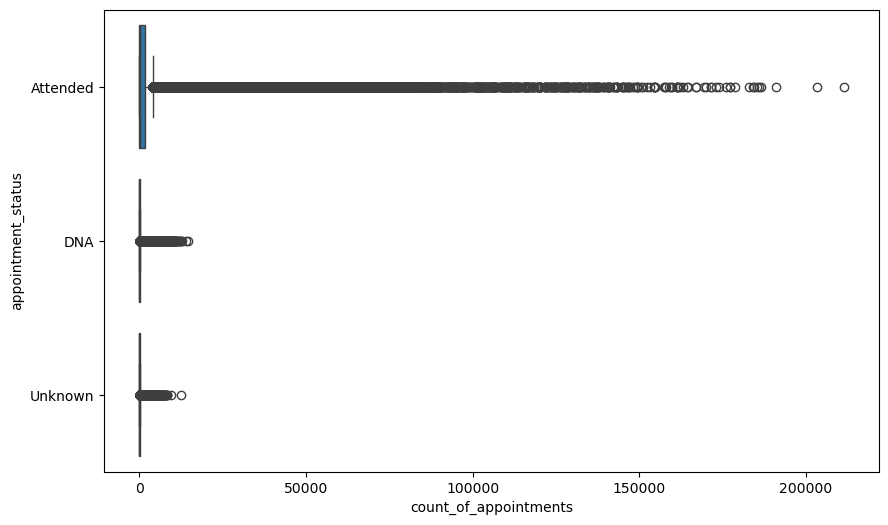

In [23]:
# Generate boc plot to check for outlier in ar dataset.

plt.figure(figsize=(10, 6))
sns.boxplot(data=ar, x='count_of_appointments', y='appointment_status')
plt.show()

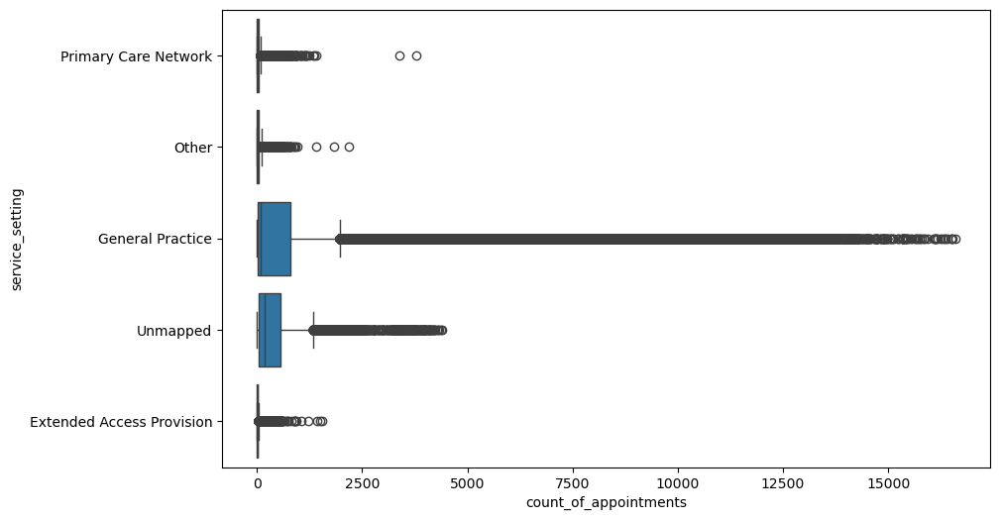

In [24]:
# Generate box plot to check for outliers in nc dataset.

plt.figure(figsize=(10, 6))
sns.boxplot(data=nc, x='count_of_appointments', y='service_setting')
plt.show()

The visualisations in this section are exploratory in nature.

The above box plots show that the data has the characteristic of a high number of outliers, with a high count of lower number of appointment entries. 

Possible explanations: 
1. The difference between the high number of appointments of weekdays compared to weekends, seasonal variations, pandemic considerations etc.
2. Regional variations: urban v rural considerations.

As such, no further action will be taken. Options could have included the removal of outlier values, min-max scaling or z-score normalisation.

# 5. Exploratory Data Analysis

Having performed data validation and cleaning in the previous section, the purpose of this EDA section is to further explore the data and understand its structure, characteristics, relationships, and anomalies.

## 5.1 How many locations are there in the data set?

In [25]:
# To determine the number of regions, ICB locations and sub-ICB locations.
# nc dataset set used in this instance. 
# ad and ar datasets showed the same. See validate_data() results above.

count_region = nc['region_name'].nunique()
count_icb = nc['icb_name'].nunique()
count_sub_icb = nc['sub_icb_location_name'].nunique()

print(f"Number of regions: {count_region}")
print(f"Number of ICB locations: {count_icb}")
print(f"Number of sub-ICB locations: {count_sub_icb}")

Number of regions: 7
Number of ICB locations: 42
Number of sub-ICB locations: 106


As per the nc DataFrame, there are 7 NHS Regions, within which there are 42 ICBs, which in turn are comprised of 106 sub-ICB locations.

## 5.2 What are the five locations with the highest number of appointments?



In [26]:
# Determine the top five locations based on record count in nc dataset.

top_5_locations = nc['sub_icb_location_name'].value_counts().head(5)

print(f"The top five locations based on record count are:")

print(f"{top_5_locations}")

The top five locations based on record count are:
sub_icb_location_name
NHS North West London ICB - W2U3Z              13007
NHS Kent and Medway ICB - 91Q                  12637
NHS Devon ICB - 15N                            12526
NHS Hampshire and Isle Of Wight ICB - D9Y0V    12171
NHS North East London ICB - A3A8R              11837
Name: count, dtype: int64


A count provides the number of times a particular sub-ICB location appears in the data. This does not tell us much. 
A more relevant metric would be to look at number of appointments per location.

Total appointments in nc dataset: 296046770

Top 5 Sub-ICB locations by total number of appointments in nc dataset:


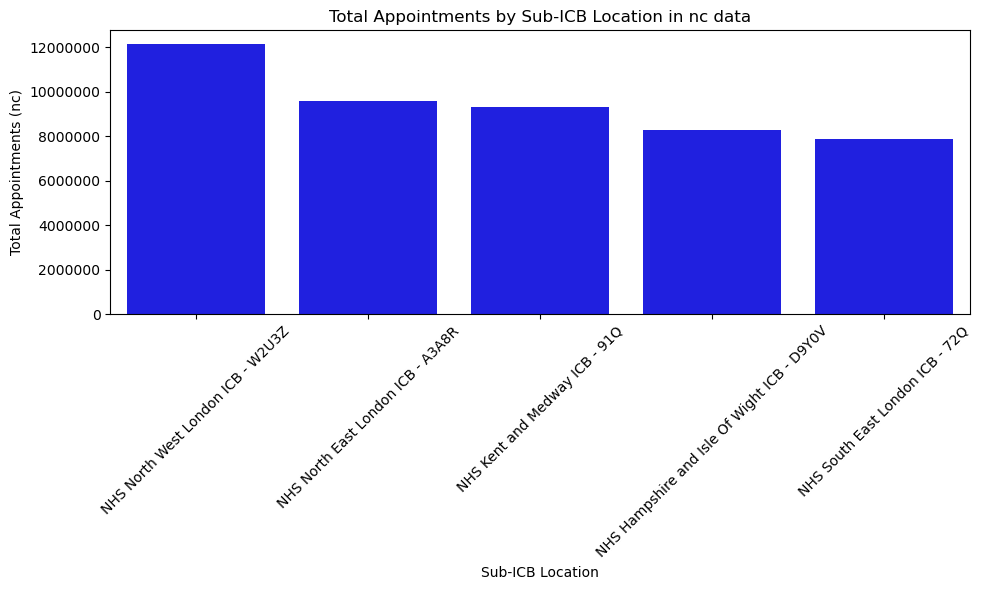

In [27]:
# Total appointments by top 5 Sub-ICB location in nc dataset.

# Pivot table creation.
top_5_nc = nc.pivot_table( \
    values='count_of_appointments', \
    index='sub_icb_location_name', \
    aggfunc='sum'
)

# Sort and reset index.
top_5_nc = top_5_nc.sort_values(by='count_of_appointments', \
                                ascending=False).reset_index()

# Rename columns.
top_5_nc = top_5_nc.rename(columns={'sub_icb_location_name': 'Sub-ICB Location', \
                                    'count_of_appointments': 'Total Appointments (nc)'})

# Calculate total sum of appointments.
total_appointments_nc = top_5_nc['Total Appointments (nc)'].sum()

# Add percentage of total column.
top_5_nc['% of Total'] = ((top_5_nc['Total Appointments (nc)'] \
                           / total_appointments_nc) * 100).round(2)


print(f"Total appointments in nc dataset: {total_appointments_nc}")
print("\nTop 5 Sub-ICB locations by total number of appointments in nc dataset:")

top_sub_icb_nc = top_5_nc.head()

standard_bar_chart(top_sub_icb_nc, x='Sub-ICB Location', y='Total Appointments (nc)', title="Total Appointments by Sub-ICB Location in nc data")

In [28]:
top_5_nc.head()

,Sub-ICB Location,Total Appointments (nc),% of Total
0,NHS North West London ICB - W2U3Z,12142390,4.10
1,NHS North East London ICB - A3A8R,9588891,3.24
2,NHS Kent and Medway ICB - 91Q,9286167,3.14
3,NHS Hampshire and Isle Of Wight ICB - D9Y0V,8288102,2.80
4,NHS South East London ICB - 72Q,7850170,2.65


It is interesting to see that 3 of the sub-ICB locations with the highest appointments as per the nc DataFrame are London-based.
Perhaps, owing to higher levels of population density.

Total appointments in ad dataset: 167980692

Top 5 Sub-ICB locations by total number of appointments in ad dataset:


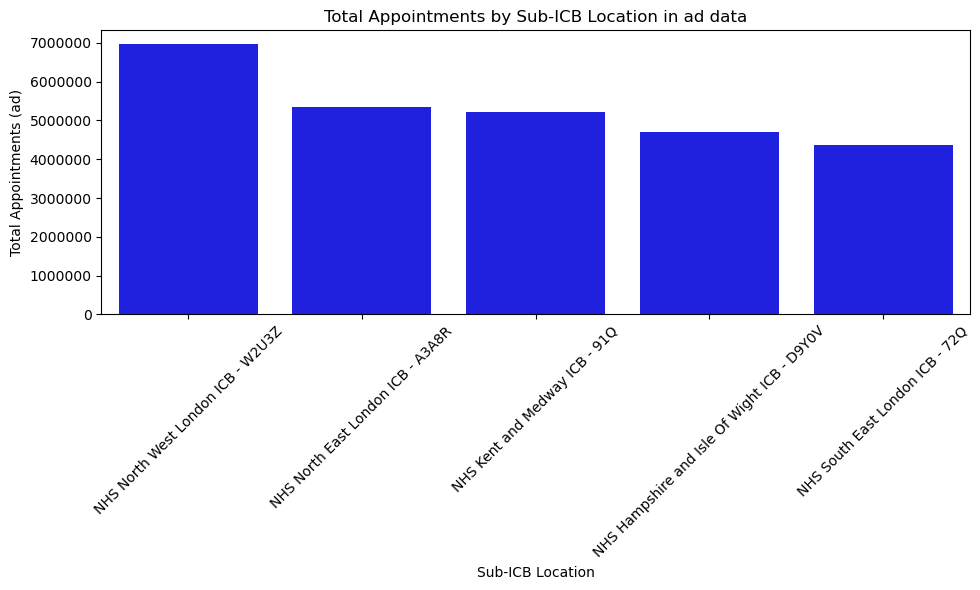

In [29]:
# Total appointments by top 5 Sub-ICB location in ad dataset.

# Pivot table creation.
top_5_ad = ad.pivot_table( \
    values='count_of_appointments', \
    index='sub_icb_location_name', \
    aggfunc='sum'
)

# Sort and reset index.
top_5_ad = top_5_ad.sort_values(by='count_of_appointments', \
                                ascending=False).reset_index()

# Rename columns.
top_5_ad = top_5_ad.rename(columns={'sub_icb_location_name': 'Sub-ICB Location', \
                                    'count_of_appointments': 'Total Appointments (ad)'})

# Calculate total sum of appointments.
total_appointments_ad = top_5_ad['Total Appointments (ad)'].sum()

# Add percentage of total column.
top_5_ad['% of Total'] = ((top_5_ad['Total Appointments (ad)'] / \
                          total_appointments_ad) * 100).round(2)


print(f"Total appointments in ad dataset: {total_appointments_ad}")
print("\nTop 5 Sub-ICB locations by total number of appointments in ad dataset:")
top_sub_icb_ad = top_5_ad.head()

standard_bar_chart(top_sub_icb_ad, y='Total Appointments (ad)', x='Sub-ICB Location', title="Total Appointments by Sub-ICB Location in ad data")

In [30]:
top_5_ad.head()

,Sub-ICB Location,Total Appointments (ad),% of Total
0,NHS North West London ICB - W2U3Z,6976986,4.15
1,NHS North East London ICB - A3A8R,5341883,3.18
2,NHS Kent and Medway ICB - 91Q,5209641,3.10
3,NHS Hampshire and Isle Of Wight ICB - D9Y0V,4712737,2.81
4,NHS South East London ICB - 72Q,4360079,2.60


The ad DataFrame shows the same sub-ICB locations, albeit with a lower number of appointments overall.
This is because it covers a smaller time period than nc does. More on that below.

Total appointments in ar dataset: 742529759

Top 5 ICB locations by total number of appointments in ar dataset:


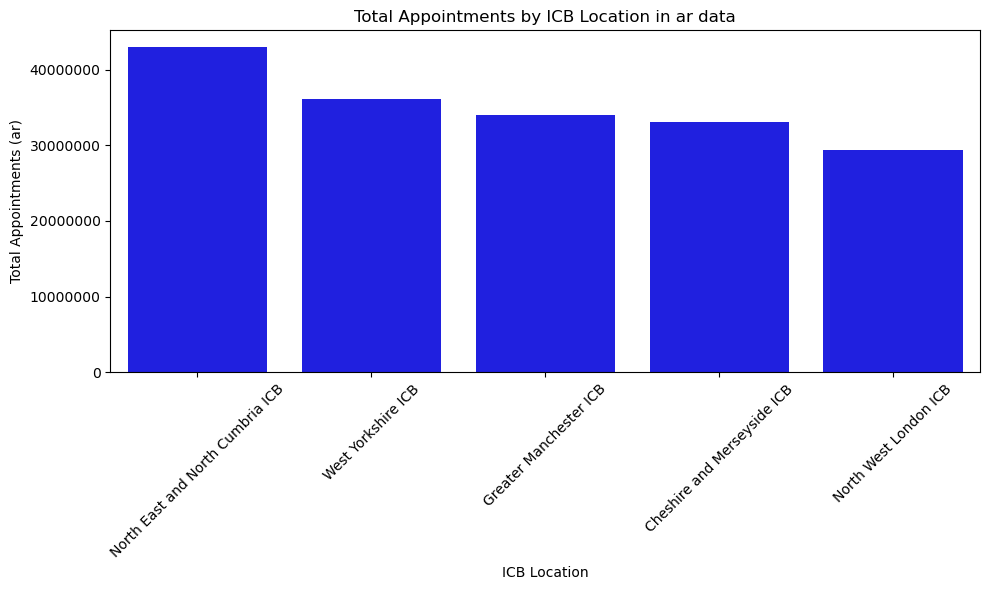

In [31]:
# Total appointments by top 5 ICB locations in ar dataset.

# Pivot table creation.
top_5_ar = ar.pivot_table( \
    values='count_of_appointments', \
    index='icb_name', \
    aggfunc='sum') \
    .sort_values(by='count_of_appointments', ascending=False) \
    .reset_index() \
    .rename(columns={'icb_name': 'ICB Location', \
                     'count_of_appointments': 'Total Appointments (ar)'})

# Calculate total sum of appointments.
total_appointments_ar = top_5_ar['Total Appointments (ar)'].sum()

# Add percentage of total column.
top_5_ar['% of Total'] = ((top_5_ar['Total Appointments (ar)'] \
                           / total_appointments_ar) * 100).round(2)

print(f"Total appointments in ar dataset: {total_appointments_ar}")
print("\nTop 5 ICB locations by total number of appointments in ar dataset:")

top_5_ar_icb = top_5_ar.head()

standard_bar_chart(top_5_ar_icb, y='Total Appointments (ar)', x='ICB Location', title="Total Appointments by ICB Location in ar data")

In [32]:
top_5_ar.head()

,ICB Location,Total Appointments (ar),% of Total
0,North East and North Cumbria ICB,43054121,5.80
1,West Yorkshire ICB,36075020,4.86
2,Greater Manchester ICB,34003953,4.58
3,Cheshire and Merseyside ICB,33064205,4.45
4,North West London ICB,29380767,3.96


The ar DataFrame covers a 30-month period and as such, the results differ to that of ad and nc. Alos, its data is aggregated at a different level of granularity (ICB as opposed to sub-ICB level).

Total appointments in ar dataset: 742529759

Total number of appointments by NHS region in ar dataset:


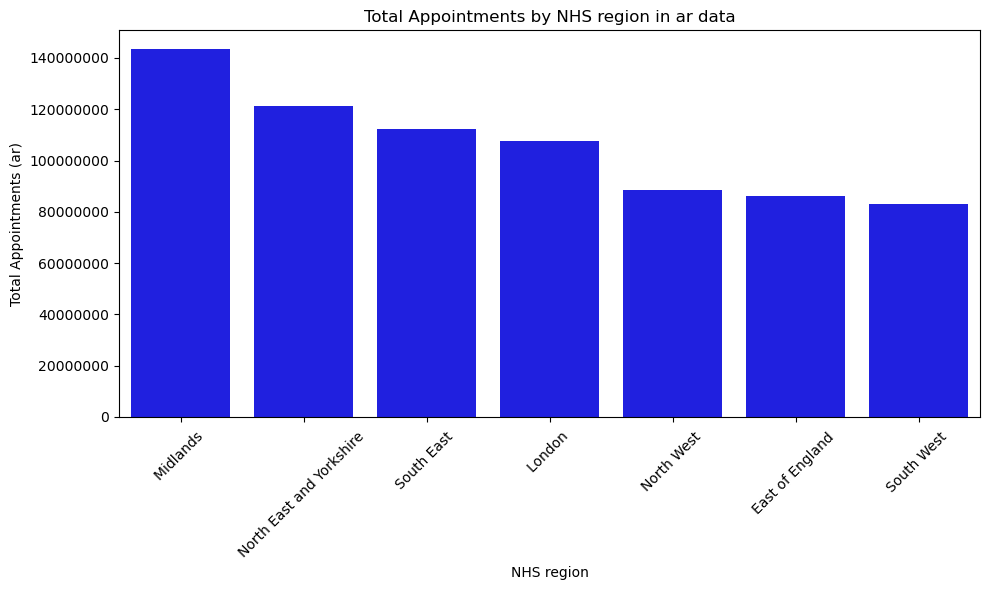

In [33]:
# Total appointments by NHS region in ar dataset.

# Pivot table creation.
top_5_ar_region = ar.pivot_table( \
    values='count_of_appointments', \
    index='region_name', \
    aggfunc='sum') \
    .sort_values(by='count_of_appointments', ascending=False) \
    .reset_index() \
    .rename(columns={'region_name': 'NHS region', \
                     'count_of_appointments': 'Total Appointments (ar)'})

# Add percentage of total column.
top_5_ar_region['% of Total'] = ((top_5_ar_region['Total Appointments (ar)'] \
                                 / total_appointments_ar) * 100).round(2)

print(f"Total appointments in ar dataset: {total_appointments_ar}")
print("\nTotal number of appointments by NHS region in ar dataset:")

standard_bar_chart(top_5_ar_region, x='NHS region', y='Total Appointments (ar)', title="Total Appointments by NHS region in ar data")

In [34]:
top_5_ar_region

,NHS region,Total Appointments (ar),% of Total
0,Midlands,143604685,19.34
1,North East and Yorkshire,121376383,16.35
2,South East,112138151,15.10
3,London,107684862,14.50
4,North West,88555435,11.93
5,East of England,86200941,11.61
6,South West,82969302,11.17


NHS regions are aggregated at a lower level of granularity. Whilst interesting  to see regional differences, it fails to capture enough of granularity required for an effective analysis. 

**At this juncture, focusing on the 42 ICB locations appear to strike the perfect balance between not being too generic (7 NHS regions) and not being too localised (106 sub-ICB locations), for the purpose of conducting an effective analysis.**

## 5.3 How many service settings, context types, national categories, appointment statuses are there?

Number of service settings: 5
Total appointments in nc dataset: 296046770

Total number of appointments by service setting:


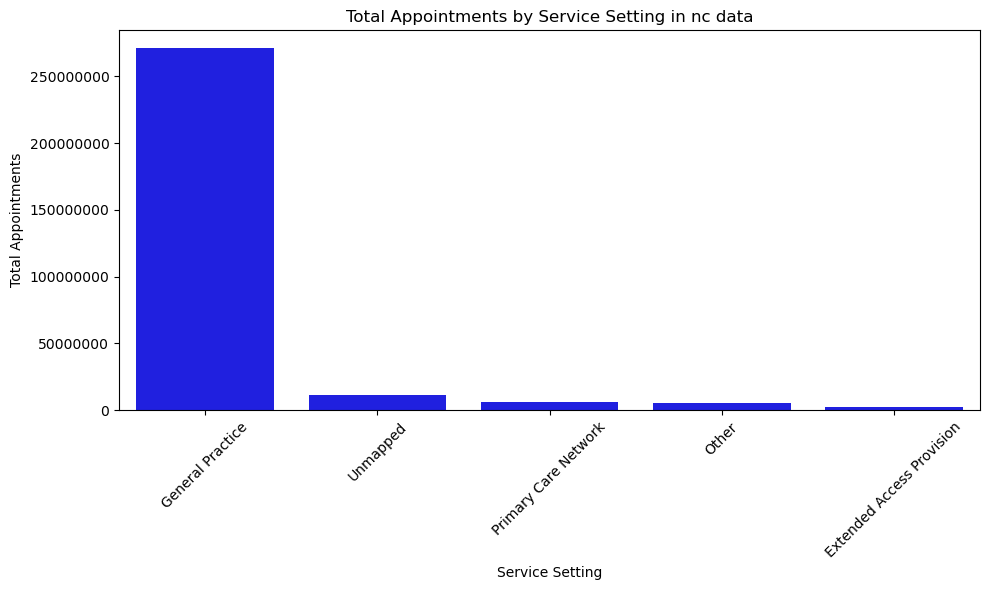

In [35]:
# Determine the number of service settings in nc dataset.

# Pivot table creation.
service_settings = nc.pivot_table( \
    values='count_of_appointments', \
    index='service_setting', \
    aggfunc='sum') \
    .sort_values(by='count_of_appointments', ascending=False) \
    .reset_index() \
    .rename(columns={'service_setting': 'Service Setting', \
                     'count_of_appointments': 'Total Appointments'})

# Calculate total sum of appointments and add percentage column.
service_settings['% of Total'] = (service_settings['Total Appointments'] \
                                  / total_appointments_nc) * 100

# Round the '% of Total' column to 2 decimal places.
service_settings['% of Total'] = service_settings['% of Total'].round(2)

print(f"Number of service settings: {nc['service_setting'].nunique()}")
print(f"Total appointments in nc dataset: {total_appointments_nc}")
print("\nTotal number of appointments by service setting:")

standard_bar_chart(service_settings, x='Service Setting', y='Total Appointments', title="Total Appointments by Service Setting in nc data")

General Practice has the higest number of total appointments. It is striking to see that Extended Access (EA) Provision is so low.

Primary Care Networks (PCNs) form a key part of the future of primary care.  First developed within the NHS Five Year Forward View published in 2014, they are part of a model of care in which commissioners and providers work together in different ways to achieve closer integration of services locally.

A PCN is a group of GP practices working closely together, aligned to other health and social care staff and organisations, providing integrated services to their local population.  A PCN covers a patient population, of 30,000 – 50,000 patients, although by approval of the commissioner, this may be lower in rural and remote areas, and higher where it is appropriate.  They provide services as per the requirements of the Network Directed Enhanced Service specification.

https://www.england.nhs.uk/long-read/primary-care-networks-pcns/

Its inception dates back to fairly recentky (Summer 2019) and as such it may still be developing the maturity required to deliver services on a scale similar to core General Practice operations.

In [36]:
service_settings

,Service Setting,Total Appointments,% of Total
0,General Practice,270811691,91.48
1,Unmapped,11080810,3.74
2,Primary Care Network,6557386,2.21
3,Other,5420076,1.83
4,Extended Access Provision,2176807,0.74


Number of context types: 3
Total appointments in nc dataset: 296046770

% share of appointments by context type:


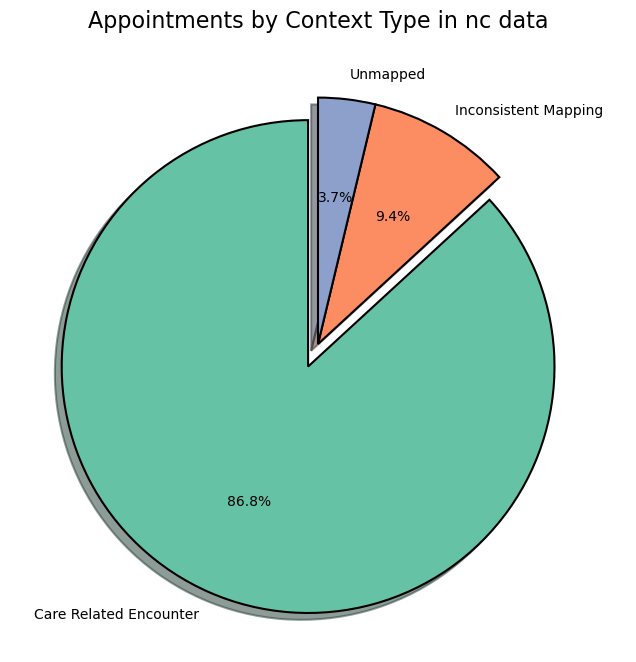

In [37]:
# Determine the number of context types in nc dataset.

context_types = nc.groupby('context_type')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'context_type':'Context Type', \
                         'count_of_appointments':'Total Appointments'})

context_types['% of Total'] = context_types['Total Appointments']/total_appointments_nc * 100

print(f"Number of context types: {nc['context_type'].nunique()}")
print(f"Total appointments in nc dataset: {total_appointments_nc}")
print("\n% share of appointments by context type:")
context_types.round(2)

# Create a pie chart.
plt.figure(figsize=(8,8)) 

# Highlight the largest slice.
explode = (0.1, 0, 0) 

labels = ['Care Related Encounter', 'Inconsistent Mapping', 'Unmapped']

# Plot the pie chart.
plt.pie(context_types['% of Total'], 
        labels=labels, 
        autopct='%1.1f%%', 
        startangle=90, 
        colors=sns.color_palette("Set2", len(context_types['% of Total'])),
        explode=explode,  
        shadow=True, 
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5} 
)

plt.title('Appointments by Context Type in nc data', fontsize=16)

plt.show()

In [38]:
context_types

,Context Type,Total Appointments,% of Total
0,Care Related Encounter,257075158,86.835995
1,Inconsistent Mapping,27890802,9.421080
2,Unmapped,11080810,3.742925


Being only three categories and given data quality considerations, context types do not tell us much.

In [39]:
# Determine the number of national categories in nc dataset.

national_categories = nc.groupby('national_category')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'national_category':'National Category', \
                         'count_of_appointments':'Total Appointments'})

national_categories['% of Total'] = national_categories['Total Appointments']/total_appointments_nc * 100



print(f"Number of national categories: {nc['national_category'].nunique()}")
print(f"Total appointments in nc dataset: {total_appointments_nc}")
print("\nTotal number of appointments by national category:")
national_categories.round(2)

Number of national categories: 18
Total appointments in nc dataset: 296046770

Total number of appointments by national category:


,National Category,Total Appointments,% of Total
0,General Consultation Routine,97271522,32.86
1,General Consultation Acute,53691150,18.14
2,Clinical Triage,41546964,14.03
3,Planned Clinics,28019748,9.46
4,Inconsistent Mapping,27890802,9.42
5,Planned Clinical Procedure,25702694,8.68
6,Unmapped,11080810,3.74
7,Unplanned Clinical Activity,3055794,1.03
8,Home Visit,2144452,0.72
9,Structured Medication Review,1858379,0.63


To have enough of an understanding of national category elements, conversations would have to take place with stakeholders possessing key clinical and operational knowledge of these elements. 

It would certainly make for a deeper analysis of whether efforts are being allocated efficiently to the correct category element. 

For the purpose of this analysis, national categories will not be examined further in any great detail. 

Number of appointment statuses: 3
Total appointments in ar dataset: 742529759

Total number of appointments by appointment status:


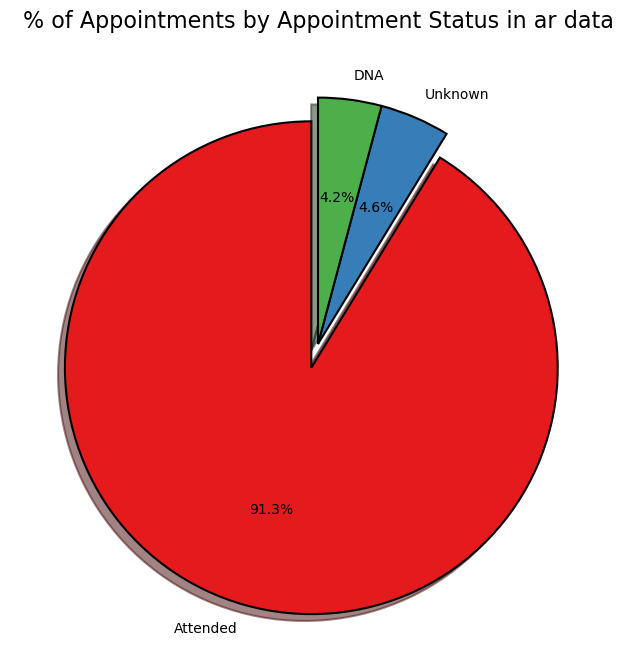

In [40]:
# Determine the number of appointment statuses in ar dataset.

appointment_statuses = ar.groupby('appointment_status')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'appointment_status':'Appointment Status', \
                         'count_of_appointments':'Total Appointments'})

appointment_statuses['% of Total'] = appointment_statuses['Total Appointments']/total_appointments_ar * 100

print(f"Number of appointment statuses: {ar['appointment_status'].nunique()}")
print(f"Total appointments in ar dataset: {total_appointments_ar}")
print("\nTotal number of appointments by appointment status:")

# Create a pie chart.
plt.figure(figsize=(8,8)) 

# Highlight the largest slice.
explode = (0.1, 0, 0)  

labels = ['Attended', 'Unknown', 'DNA']

# Plot the pie chart.
plt.pie(appointment_statuses['% of Total'], 
        labels=labels, 
        autopct='%1.1f%%', 
        startangle=90, 
        colors=sns.color_palette("Set1", len(context_types['% of Total'])),
        explode=explode,  
        shadow=True,  
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5}
)

plt.title('% of Appointments by Appointment Status in ar data', fontsize=16)

plt.show()

In [41]:
appointment_statuses.round(2)

,Appointment Status,Total Appointments,% of Total
0,Attended,677646088,91.26
1,Unknown,34050656,4.59
2,DNA,30833015,4.15


One of the objectives from the NHS is to minimise inefficiecies/wasted resources. It woudl be interesting to look further into DNA occurences. 

## 5.4 What are the appointment modes, HCP types, appointment duration and time between booking & appointment categories?

In [42]:
# Determine the number of appointment modes in ar dataset.

appointment_modes = ar.groupby('appointment_mode')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'appointment_mode':'Appointment Mode', \
                         'count_of_appointments':'Total Appointments'})

appointment_modes['% of Total'] = appointment_modes['Total Appointments']/total_appointments_ar * 100

print(f"Number of appointment modes: {ar['appointment_mode'].nunique()}")
print(f"Total appointments in ar dataset: {total_appointments_ar}")
print("\nTotal number of appointments by appointment mode:")
appointment_modes.round(2)

Number of appointment modes: 5
Total appointments in ar dataset: 742529759

Total number of appointments by appointment mode:


,Appointment Mode,Total Appointments,% of Total
0,Face-to-Face,439876928,59.24
1,Telephone,267752505,36.06
2,Unknown,26439308,3.56
3,Home Visit,4848743,0.65
4,Video/Online,3612275,0.49


As anticipated, face-to-face appointments make up 59.24% of all appointments in the ar DataFrame. 
Telephone appointments represent a significant proportion of the total as well.
Given that the ar data covers the first Covid-19 lockdown where there was need for telephone triaging prior to face-toface appointments, the prevalence of telephone appointments is unsurprising.

Number of HCP types: 3
Total appointments in ar dataset: 742529759

Total number of appointments by HCP type:


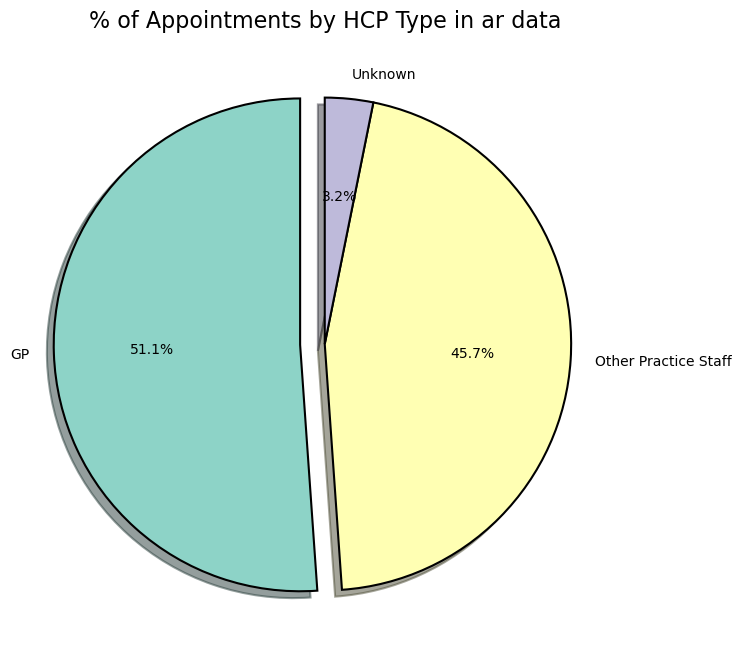

In [43]:
# Determine the number of HCP types in ar dataset.

hcp_types = ar.groupby('hcp_type')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'hcp_type':'HCP Type', \
                         'count_of_appointments':'Total Appointments'})

hcp_types['% of Total'] = hcp_types['Total Appointments']/total_appointments_ar * 100

print(f"Number of HCP types: {ar['hcp_type'].nunique()}")
print(f"Total appointments in ar dataset: {total_appointments_ar}")
print("\nTotal number of appointments by HCP type:")

# Create a pie chart.
plt.figure(figsize=(8,8))  

explode = (0.1, 0, 0)  

labels = ['GP', 'Other Practice Staff', 'Unknown']

# Plot the pie chart.
plt.pie(hcp_types['% of Total'], 
        labels=labels, 
        autopct='%1.1f%%', 
        startangle=90, 
        colors=sns.color_palette("Set3", len(context_types['% of Total'])),
        explode=explode,  
        shadow=True,  
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5}  
)


plt.title('% of Appointments by HCP Type in ar data', fontsize=16)

plt.show()

This information is limited as 45.7% of appointments were delivered by 'Other Practice Staff'. The composition of this category has not been provided. This would have enhanced this analysis and aid capacity planning, utilisation and optimsation. GPs cost a lot more than staff of other grades.

In [44]:
hcp_types.round(2)

,HCP Type,Total Appointments,% of Total
0,GP,379532056,51.11
1,Other Practice staff,339528981,45.73
2,Unknown,23468722,3.16


Number of appointment duration categories: 7
Total appointments in ad dataset: 167980692

Total number of appointments for each appointment duration category:


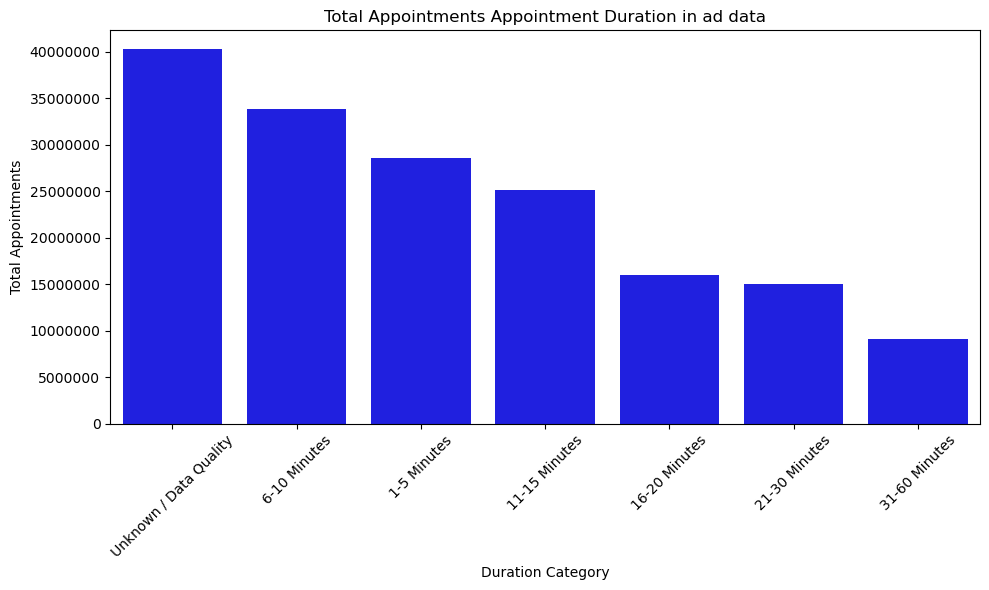

In [45]:
# Determine number of appointments for each appointment duration category in ad dataset.

appt_duration = ad.groupby('actual_duration')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'actual_duration':'Duration Category', \
                         'count_of_appointments':'Total Appointments'})

appt_duration['% of Total'] = appt_duration['Total Appointments']/total_appointments_ad * 100

print(f"Number of appointment duration categories: {ad['actual_duration'].nunique()}")
print(f"Total appointments in ad dataset: {total_appointments_ad}")
print("\nTotal number of appointments for each appointment duration category:")

standard_bar_chart(appt_duration, x='Duration Category', y='Total Appointments', title="Total Appointments Appointment Duration in ad data")

In [46]:
appt_duration.round(2)

,Duration Category,Total Appointments,% of Total
0,Unknown / Data Quality,40284086,23.98
1,6-10 Minutes,33800815,20.12
2,1-5 Minutes,28600865,17.03
3,11-15 Minutes,25160882,14.98
4,16-20 Minutes,16004247,9.53
5,21-30 Minutes,15026365,8.95
6,31-60 Minutes,9103432,5.42


Unless there is a meaningful way to merge nc and ad DataFrames in order to link duraton categories with national categories, this does not provide much insight other than the NHS has to make an attempt at improving data quality in terms of capturing appointment durations. Unknown/Data Quality represents the highest share for duration categories. 

GP practices are under considerable strain and perhaps this is not a priority especially if it is nota requirement linked to any financial incentive.

In [47]:
# Determine number of appointments for time_between_book_and_appointment (TBBA) category in ar dataset.

appt_wait = ar.groupby('time_between_book_and_appointment')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'time_between_book_and_appointment':'TBBA Category', \
                         'count_of_appointments':'Total Appointments'})

appt_wait['% of Total'] = appt_wait['Total Appointments']/total_appointments_ar * 100

print(f"Number of appointment TBBA categories: {ar['time_between_book_and_appointment'].nunique()}")
print(f"Total appointments in ar dataset: {total_appointments_ar}")
print("\nTotal number of appointments for each TBBA category:")
appt_wait.round(2)

Number of appointment TBBA categories: 8
Total appointments in ar dataset: 742529759

Total number of appointments for each TBBA category:


,TBBA Category,Total Appointments,% of Total
0,Same Day,342701908,46.15
1,2 to 7 Days,153749341,20.71
2,8 to 14 Days,86806958,11.69
3,1 Day,67673007,9.11
4,15 to 21 Days,42673981,5.75
5,22 to 28 Days,25503575,3.43
6,More than 28 Days,23024683,3.10
7,Unknown / Data Quality,396306,0.05


It is interesting to that the most recent (shortest time) TBBA categories, make up the majority of the appointments. 
1 Day being the lowest of the more recent TBBA categories at 9.11%
This suggests that in most cases, either patients are sick enough to warrant same day appointments or they are asked to wait a week or two.

## 5.5 Between what dates were appointments scheduled? 

In [48]:
# View the first five rows of appointment_date for the ad DataFrame to determine the date format.
# The date format in ad is an object/string.

ad['appointment_date'].head()

0    01-Dec-21
1    01-Dec-21
2    01-Dec-21
3    01-Dec-21
4    01-Dec-21
Name: appointment_date, dtype: object

In [49]:
# View the first five rows of appointment_month for the ar DataFrame to determine the date format.
# The date format in ad is an object/string.

ar['appointment_month'].head()

0    2020-01
1    2020-01
2    2020-01
3    2020-01
4    2020-01
Name: appointment_month, dtype: object

In [50]:
# View the first five rows of appointment_date for the nc DataFrame to determine the date format.

nc['appointment_date'].head()

0   2021-08-02
1   2021-08-02
2   2021-08-02
3   2021-08-02
4   2021-08-02
Name: appointment_date, dtype: datetime64[ns]

In [51]:
# Change the date format of ad['appointment_date'].

ad['appointment_date'] = pd.to_datetime(ad['appointment_date'])

# View the DataFrame.
ad.dtypes

icb_ons_code                     object
sub_icb_location_name            object
icb_name                         object
region_name                      object
appointment_date         datetime64[ns]
actual_duration                  object
count_of_appointments             int64
dtype: object

In [52]:
# Change the format of ar['appointment_date'] to datetime.

ar['appointment_month'] = pd.to_datetime(ar['appointment_month'])

# View the DataFrame.
ar.dtypes

icb_ons_code                                 object
icb_name                                     object
region_name                                  object
appointment_month                    datetime64[ns]
appointment_status                           object
hcp_type                                     object
appointment_mode                             object
time_between_book_and_appointment            object
count_of_appointments                         int64
dtype: object

In [53]:
# Determine the minimum and maximum dates in the ad DataFrame.
# Use appropriate docstrings.

ad_date_min = (ad['appointment_date'].dt.date.min())
ad_date_max = (ad['appointment_date'].dt.date.max())

print(f"The minimum date in the ad DataFrame is {ad_date_min}")
print(f"The maximum date in the ad DataFrame is {ad_date_max}")

The minimum date in the ad DataFrame is 2021-12-01
The maximum date in the ad DataFrame is 2022-06-30


In [54]:
# Determine the minimum and maximum dates in the nc DataFrame.
# Use appropriate docstrings.

nc_date_min  = (nc['appointment_date'].dt.date.min())
nc_date_max = (nc['appointment_date'].dt.date.max())

print(f"The minimum date in the nc DataFrame is {nc_date_min}")
print(f"The maximum date in the nc DataFrame is {nc_date_max}")

The minimum date in the nc DataFrame is 2021-08-01
The maximum date in the nc DataFrame is 2022-06-30


In [55]:
# Determine the minimum and maximum dates in the ar DataFrame.
# Use appropriate docstrings.

ar_date_min = (ar['appointment_month'].min())
ar_date_max = (ar['appointment_month'].max())

print(f"The minimum date in the ar DataFrame is {ar_date_min}")
print(f"The maximum date in the ar DataFrame is {ar_date_max}")

The minimum date in the ar DataFrame is 2020-01-01 00:00:00
The maximum date in the ar DataFrame is 2022-06-01 00:00:00


**The DataFrames cover different time periods and there are overlaps.
As such, there may also be voerlap in terms of the count of appointments featured in the datasets. 
This is a key consideration and also given that the data are aggregated at different levels, it does not make sense to merge the DataFrames at all.**

## 5.6 Which service setting reported the most appointments for NHS North West London from 1 January to 1 June 2022?

In [56]:
# Take a subset from nc DataFrame pertaining to NHS NWL for the relevant period.
nwl_subset = nc[(nc['sub_icb_location_name'] == 'NHS North West London ICB - W2U3Z') & \
              (nc['appointment_date'] >= '2022-01-01') & \
              (nc['appointment_date'] <= '2022-06-01')]

print(f"Total number of appointments in NHS North West London ICB: \
{nc[nc['sub_icb_location_name'] == 'NHS North West London ICB - W2U3Z'] \
['count_of_appointments'].sum()}")

print(f"Total number of appointments in NHS North West London \
between 1 January to 1 June 2022: {nwl_subset['count_of_appointments'].sum()}")


print("\nTotal number of appointments per service setting in NHS North West London \
between 1 January to 1 June 2022:")

NHSNWL = nwl_subset.groupby('service_setting')['count_of_appointments'] \
    .sum().sort_values(ascending=False) \
    .reset_index() \
    .rename(columns={'service_setting':'Service Setting', \
            'count_of_appointments':'Total Appointments'})

NHSNWL['% of Total'] = NHSNWL['Total Appointments']\
/ (nwl_subset['count_of_appointments'].sum()) * 100

NHSNWL.round(2)

Total number of appointments in NHS North West London ICB: 12142390
Total number of appointments in NHS North West London between 1 January to 1 June 2022: 5556241

Total number of appointments per service setting in NHS North West London between 1 January to 1 June 2022:


,Service Setting,Total Appointments,% of Total
0,General Practice,4804239,86.47
1,Unmapped,391106,7.04
2,Other,152897,2.75
3,Primary Care Network,109840,1.98
4,Extended Access Provision,98159,1.77


## 5.7 Which month had the highest number of appointments?

In [57]:
# Number of appointments per month == sum of count_of_appointments by month.
# Use the groupby() and sort_values() functions.

nc_per_month = nc.groupby('appointment_month')['count_of_appointments'] \
                        .sum().sort_values(ascending=False) \
                        .reset_index() \
                        .rename(columns={'appointment_month':'Appointment Month', \
                                         'count_of_appointments':'Total Appointments'})

nc_per_month['% of Total'] = nc_per_month['Total Appointments']/total_appointments_nc *100

nc_per_month.round(2)

,Appointment Month,Total Appointments,% of Total
0,2021-11,30405070,10.27
1,2021-10,30303834,10.24
2,2022-03,29595038,10.00
3,2021-09,28522501,9.63
4,2022-05,27495508,9.29
5,2022-06,25828078,8.72
6,2022-01,25635474,8.66
7,2022-02,25355260,8.56
8,2021-12,25140776,8.49
9,2022-04,23913060,8.08


In [58]:
# Number of appointments per month == sum of count_of_appointments by month.
# Use the groupby() and sort_values() functions.

ar_per_month = ar.groupby('appointment_month')['count_of_appointments']\
                    .sum().sort_values(ascending=False).reset_index()\
                    .rename(columns={'appointment_month':'Appointment Month', 'count_of_appointments':'Total Appointments'})

ar_per_month['% of Total'] = ar_per_month['Total Appointments']/total_appointments_ar *100

ar_per_month.round(2)

,Appointment Month,Total Appointments,% of Total
0,2021-11-01,30395923,4.09
1,2021-10-01,30296850,4.08
2,2022-03-01,29586020,3.98
3,2021-09-01,28514685,3.84
4,2020-10-01,28296051,3.81
5,2022-05-01,27478652,3.70
6,2021-03-01,27216974,3.67
7,2020-01-01,27191758,3.66
8,2021-06-01,26775653,3.61
9,2020-09-01,26706462,3.60


The top 4 months in terms of total appointments are the same in the nc and ar dataset. 

## 5.8 What was the total number of appointmens per month?

In [59]:
# Create a month-year column for each data source.
ad['month_year'] = ad['appointment_date'].dt.to_period('M').astype(str)
ar['month_year'] = ar['appointment_month'].dt.to_period('M').astype(str)
nc['month_year'] = nc['appointment_date'].dt.to_period('M').astype(str)

In [60]:
# Aggregate the data to count the number of appointments per month
ad_appointments_per_month = ad.groupby('month_year')['count_of_appointments'].sum()
ar_appointments_per_month = ar.groupby('month_year')['count_of_appointments'].sum()
nc_appointments_per_month = nc.groupby('month_year')['count_of_appointments'].sum()

In [61]:
ar_appointments_per_month

month_year
2020-01    27191758
2020-02    24097066
2020-03    24039635
2020-04    16002488
2020-05    16410591
2020-06    20678416
2020-07    22483207
2020-08    20143878
2020-09    26706462
2020-10    28296051
2020-11    25056131
2020-12    23528063
2021-01    22482990
2021-02    22389461
2021-03    27216974
2021-04    23872938
2021-05    23488728
2021-06    26775653
2021-07    25728662
2021-08    23843177
2021-09    28514685
2021-10    30296850
2021-11    30395923
2021-12    25132174
2022-01    25623928
2022-02    25344812
2022-03    29586020
2022-04    23904960
2022-05    27478652
2022-06    25819426
Name: count_of_appointments, dtype: int64

In [62]:
nc_appointments_per_month

month_year
2021-08    23852171
2021-09    28522501
2021-10    30303834
2021-11    30405070
2021-12    25140776
2022-01    25635474
2022-02    25355260
2022-03    29595038
2022-04    23913060
2022-05    27495508
2022-06    25828078
Name: count_of_appointments, dtype: int64

In [63]:
ad_appointments_per_month

month_year
2021-12    22853483
2022-01    23597196
2022-02    23351939
2022-03    27170002
2022-04    21948814
2022-05    25343941
2022-06    23715317
Name: count_of_appointments, dtype: int64

# 6. Data Visualisation

This section continues the exploratory analysis with more specific questions around the data.

Visualisations generated in this section are generally exploratory in nature. However, some may be explanatory visualisations and this will be identified accordingly.

In [64]:
# Initial sns settings.
# These are customised further below as needed.

# Set figure size.
sns.set(rc={'figure.figsize':(15, 12)})

# Set the plot style as white.
sns.set_style('whitegrid')
sns.set_context('talk')
sns.set_palette('colorblind')

## 6.1 Three visualisations indicating the number of appointments per month for service settings, context types, and national categories.

In [65]:
# Change the data type of the appointment month to string to allow for easier plotting.

nc['appointment_month'] = nc['appointment_month'].astype(str)

In [66]:
# Aggregate on a monthly level and determine the sum of appointments per month.

nc_ss = nc.groupby(['appointment_month', 'service_setting'])[['count_of_appointments']].sum().reset_index()

print("\nTotal number of appointments per month for each service setting:")

nc_ss.head()


Total number of appointments per month for each service setting:


,appointment_month,service_setting,count_of_appointments
0,2021-08,Extended Access Provision,160927
1,2021-08,General Practice,21575852
2,2021-08,Other,449101
3,2021-08,Primary Care Network,432448
4,2021-08,Unmapped,1233843


**Service settings:**

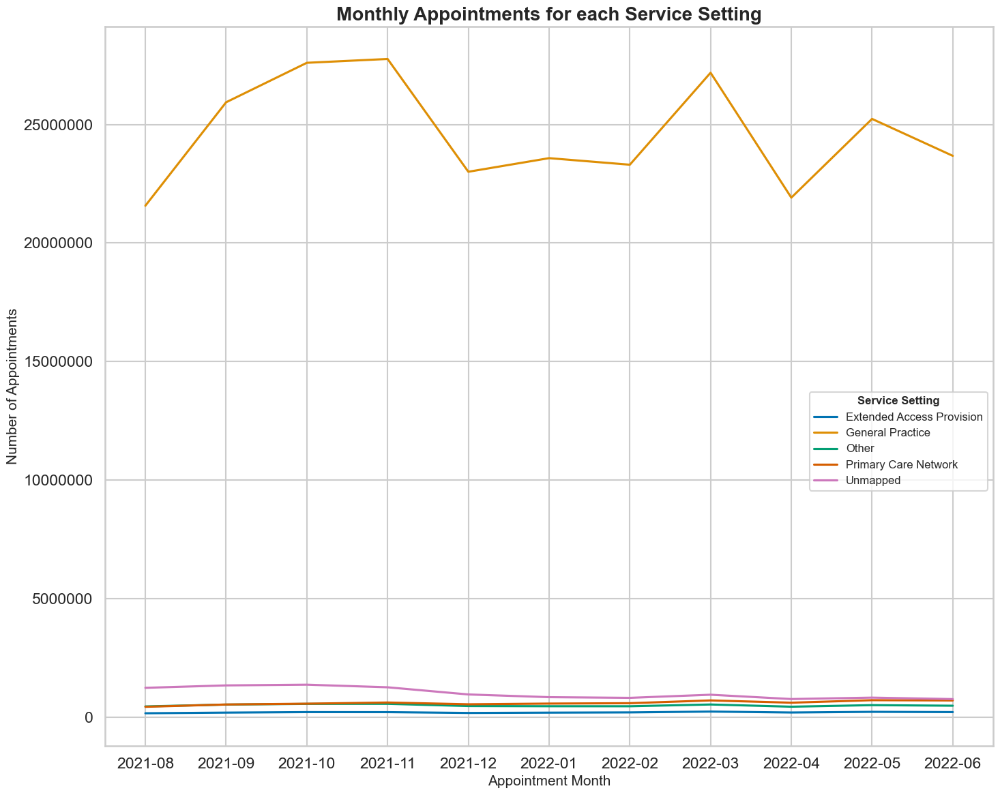

In [67]:
# Plot the appointments over the available date range, and review the service settings for months.

# Create a lineplot.
sns.lineplot(x='appointment_month', y='count_of_appointments', 
             data=nc_ss, hue='service_setting', errorbar=None,)

# Set the title.
plt.title('Monthly Appointments for each Service Setting', fontsize=20, fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')

plt.xlabel('Appointment Month', fontsize=15)
plt.ylabel('Number of Appointments', fontsize=15)

# Set the legend title and place it center right of image.
legend_font = {'size':12}
legend = plt.legend(title='Service Setting', title_fontsize=12, loc='best', bbox_to_anchor=(1, 0.5), prop=legend_font)

# Bold the legend title.
legend.get_title().set_fontweight('bold')

plt.tight_layout()

#plt.savefig('Monthly Appointments for each Service Setting', dpi=300, bbox_inches='tight')

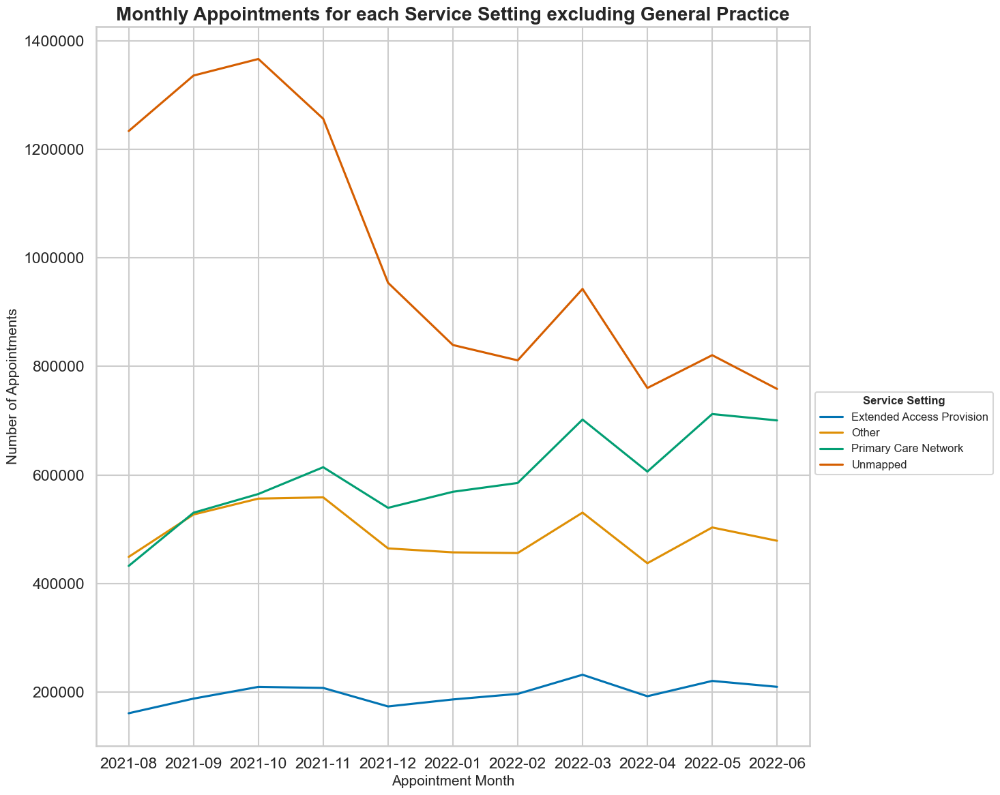

In [68]:
nc_ss_nogp = nc_ss[nc_ss['service_setting'] != 'General Practice']

# Create a lineplot.
sns.lineplot(x='appointment_month', y='count_of_appointments',
             data=nc_ss_nogp, hue='service_setting', errorbar=None,)

# Set the title.
plt.title('Monthly Appointments for each Service Setting excluding General Practice', fontsize=20, fontweight='bold')

plt.xlabel('Appointment Month', fontsize=15)
plt.ylabel('Number of Appointments', fontsize=15)
plt.ticklabel_format(style='plain', axis='y')

# Set the legend title and place it center right of image.
legend_font = {'size': 12}
legend = plt.legend(title='Service Setting', title_fontsize=12, loc='best', bbox_to_anchor=(1, 0.5), prop=legend_font)

# Bold the legend title.
legend.get_title().set_fontweight('bold')

plt.tight_layout()

#plt.savefig('Monthly Appointments for each Service Setting excluding General Practice', dpi=300, bbox_inches='tight')

**Context types:**

In [69]:
# Create a separate data set that can be used in future weeks. 
nc_ct = nc.groupby(['appointment_month', 'context_type'])[['count_of_appointments']].sum().reset_index()

print("\nTotal number of appointments per month for each context_type:")

nc_ct.head()


Total number of appointments per month for each context_type:


,appointment_month,context_type,count_of_appointments
0,2021-08,Care Related Encounter,20255235
1,2021-08,Inconsistent Mapping,2363093
2,2021-08,Unmapped,1233843
3,2021-09,Care Related Encounter,24404251
4,2021-09,Inconsistent Mapping,2782135


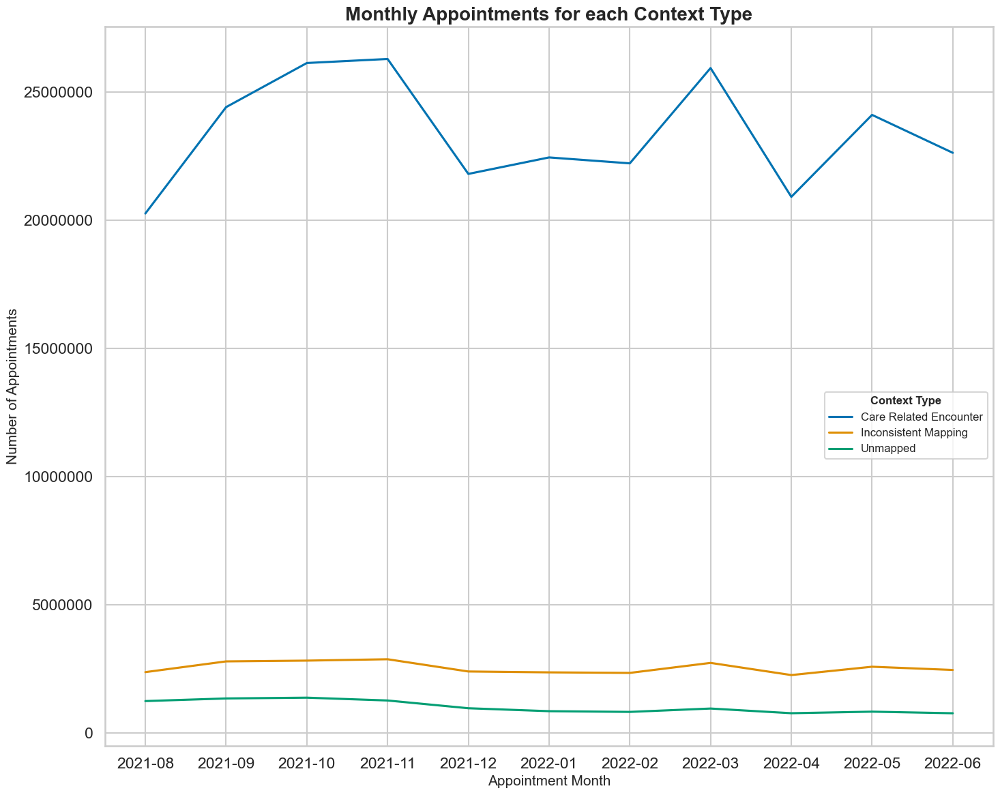

In [70]:
# Plot the appointments over the available date range, and review the context types for months.

# Create a lineplot.
sns.lineplot(x='appointment_month', y='count_of_appointments', 
             data=nc_ct, hue='context_type', errorbar=None,)

# Set the title.
plt.title('Monthly Appointments for each Context Type', fontsize=20, fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')

plt.xlabel('Appointment Month', fontsize=15)
plt.ylabel('Number of Appointments', fontsize=15)

# Set the legend title and place it center right of image.
legend_font = {'size': 12}
legend = plt.legend(title='Context Type', title_fontsize=12, loc='best', bbox_to_anchor=(1, 0.5), prop=legend_font)

# Bold the legend title.
legend.get_title().set_fontweight('bold')

plt.tight_layout()
#plt.savefig('Monthly Appointments for each Context Type', dpi=300, bbox_inches='tight')

**National categories:**

In [71]:
# Create a separate data set that can be used in future weeks. 
nc_nc = nc.groupby(['appointment_month', 'national_category'])[['count_of_appointments']]\
        .sum() \
        .reset_index()

print("\nTotal number of appointments per month per national category:")

nc_nc.head()


Total number of appointments per month per national category:


,appointment_month,national_category,count_of_appointments
0,2021-08,Care Home Needs Assessment & Personalised Care...,29676
1,2021-08,Care Home Visit,47583
2,2021-08,Clinical Triage,3704207
3,2021-08,General Consultation Acute,4280920
4,2021-08,General Consultation Routine,7756045


,National Category,Total Appointments,% of Total
0,General Consultation Routine,97271522,32.856809
1,General Consultation Acute,53691150,18.136036
2,Clinical Triage,41546964,14.033919
3,Planned Clinics,28019748,9.464636
4,Inconsistent Mapping,27890802,9.421080


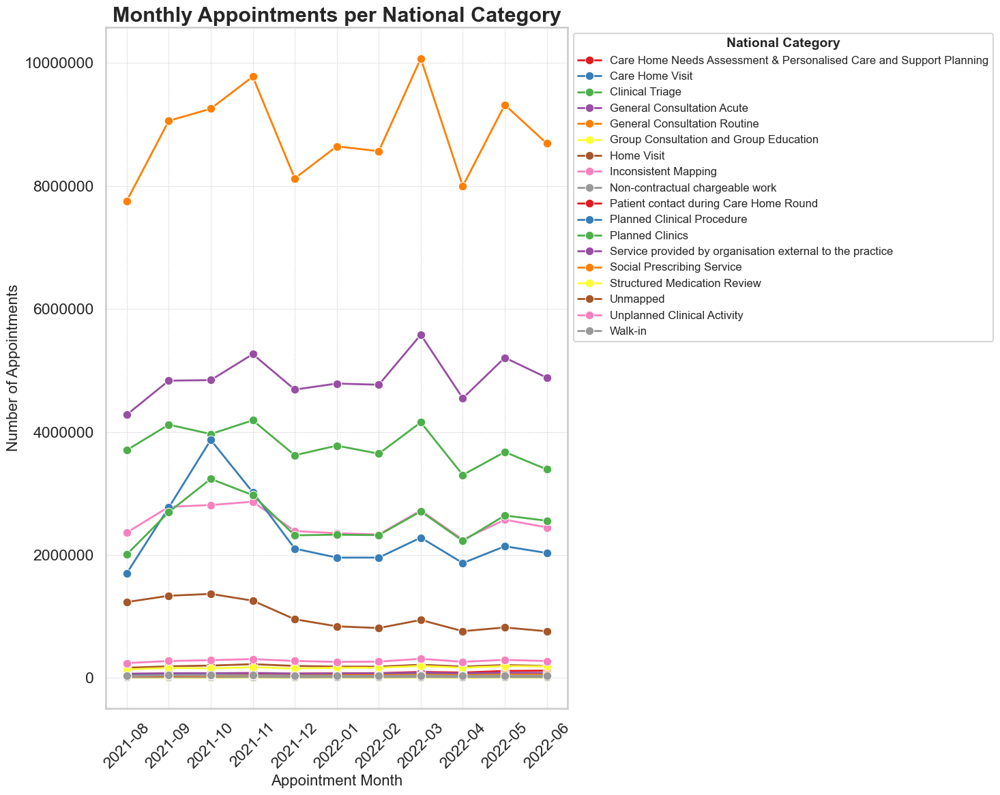

In [72]:
# Plot the appointments over the available date range, and review the national categories for months.

# Create a line plot.
sns.lineplot(x='appointment_month', 
             y='count_of_appointments', 
             data=nc_nc, 
             hue='national_category',
             marker='o',  
             linewidth=2,  
             palette='Set1', 
             errorbar=None)

plt.title('Monthly Appointments per National Category', 
          fontsize=22, 
          fontweight='bold')

# Set the y-axis to display in plain number format.
plt.ticklabel_format(style='plain', axis='y')

plt.xlabel('Appointment Month', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='National Category', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)
legend.get_title().set_fontweight('bold')

plt.tight_layout()

#plt.savefig('Monthly Appointments per National Category', dpi=300, bbox_inches='tight')

display(national_categories.head())

## 6.2 Visualisations indicating the number of appointments for service setting per season.

The seasons are summer (June to August 2021), autumn (September to November 2021), winter (December to February 2022), and spring (March to May 2022).

In [73]:
nc_ss_day = nc.groupby(['appointment_date', 'service_setting'])['count_of_appointments'].sum().reset_index()

nc_ss_day.head()

,appointment_date,service_setting,count_of_appointments
0,2021-08-01,Extended Access Provision,438
1,2021-08-01,General Practice,3411
2,2021-08-01,Other,401
3,2021-08-01,Primary Care Network,323
4,2021-08-01,Unmapped,1054


In [74]:
# Filter nc_ss_day for the seasons and assign to new DataFrame.

nc_ss_day_aug21 = nc_ss_day[(nc_ss_day['appointment_date'] >= '2021-06-01') & (nc_ss_day['appointment_date'] <= '2021-08-31')]
nc_ss_day_autumn = nc_ss_day[(nc_ss_day['appointment_date'] >= '2021-09-01') & (nc_ss_day['appointment_date'] <= '2021-11-30')]
nc_ss_day_winter = nc_ss_day[(nc_ss_day['appointment_date'] >= '2021-12-01') & (nc_ss_day['appointment_date'] <= '2022-02-28')]
nc_ss_day_spring = nc_ss_day[(nc_ss_day['appointment_date'] >= '2022-03-01') & (nc_ss_day['appointment_date'] <= '2022-05-31')]
nc_ss_day_june22 = nc_ss_day[(nc_ss_day['appointment_date'] >= '2022-06-01') & (nc_ss_day['appointment_date'] <= '2022-06-30')]

**Summer 2021**

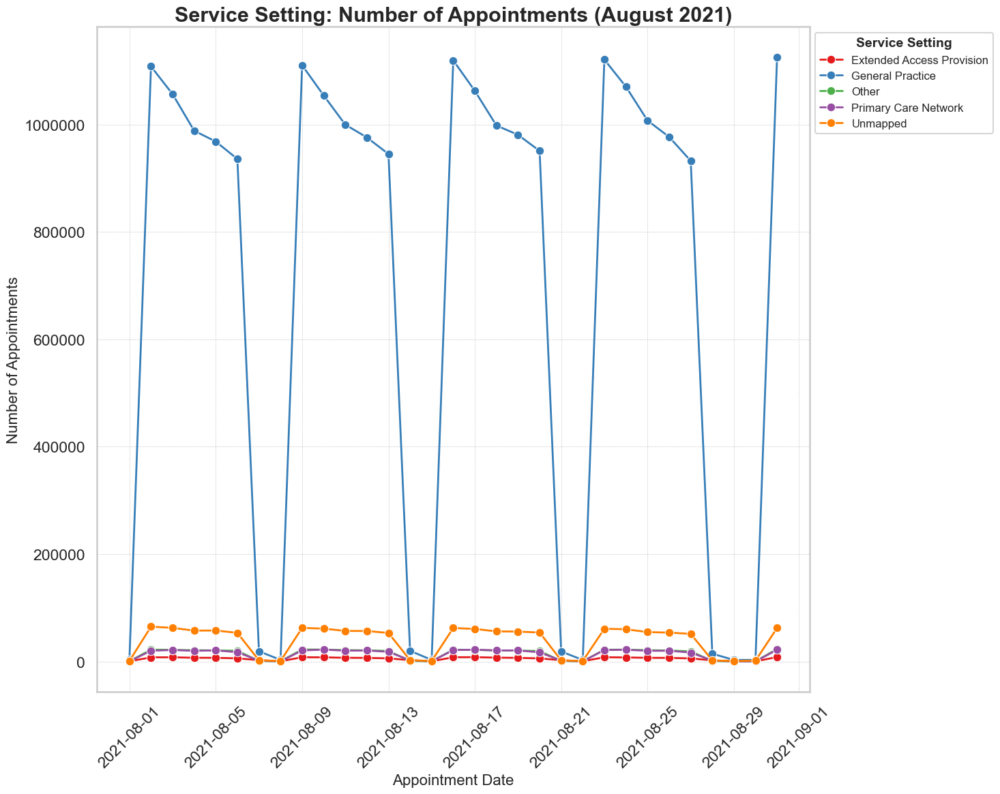

In [75]:
# Visualise the subset using a lineplot.

sns.lineplot(x='appointment_date', 
             y='count_of_appointments', 
             data=nc_ss_day_aug21, 
             hue='service_setting',
             marker='o',  
             linewidth=2,  
             palette='Set1',  
             errorbar=None)


plt.title('Service Setting: Number of Appointments (August 2021)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Date', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='Service Setting', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)

legend.get_title().set_fontweight('bold')


plt.tight_layout()
#plt.savefig('Service Setting: Number of Appointments (August 2021)', dpi=300, bbox_inches='tight')

**Autumn:**

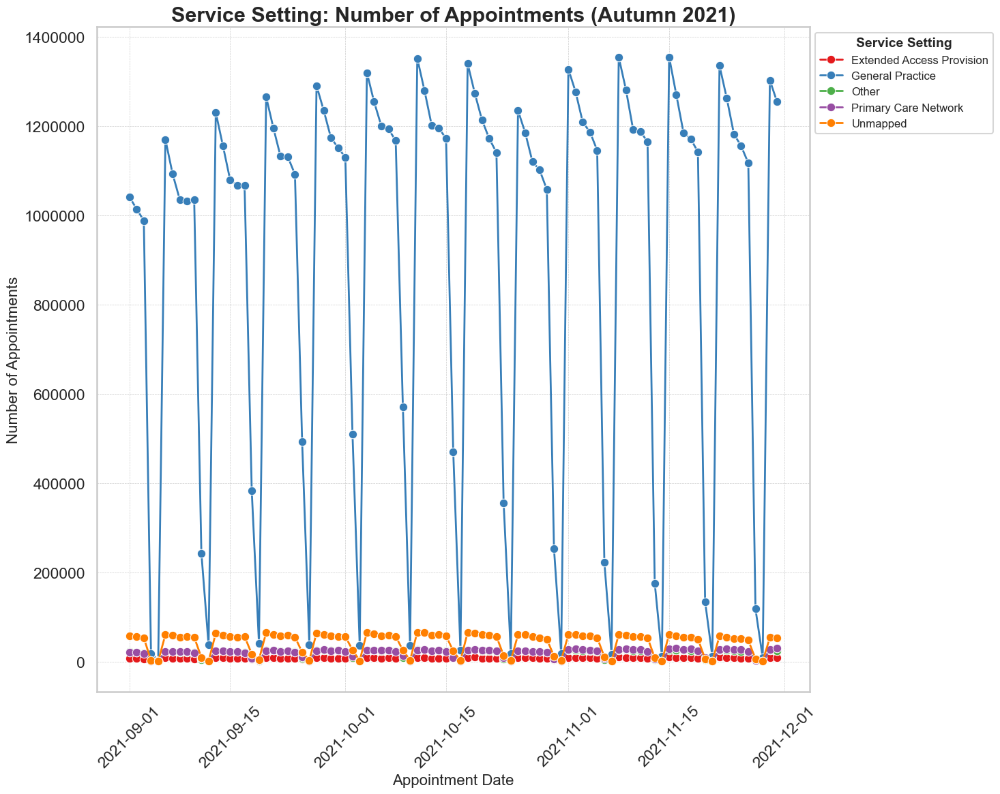

In [76]:
# Visualise the subset using a lineplot.

sns.lineplot(x='appointment_date', 
             y='count_of_appointments', 
             data=nc_ss_day_autumn, 
             hue='service_setting',
             marker='o',  
             linewidth=2, 
             palette='Set1',  
             errorbar=None)

plt.title('Service Setting: Number of Appointments (Autumn 2021)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Date', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='Service Setting', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)

legend.get_title().set_fontweight('bold')

plt.tight_layout()

#plt.savefig('Service Setting: Number of Appointments (Autumn 2021)', dpi=300, bbox_inches='tight')

A higher number of appointments being delivered in Autumn 2021 v August 2021.

**Winter:**

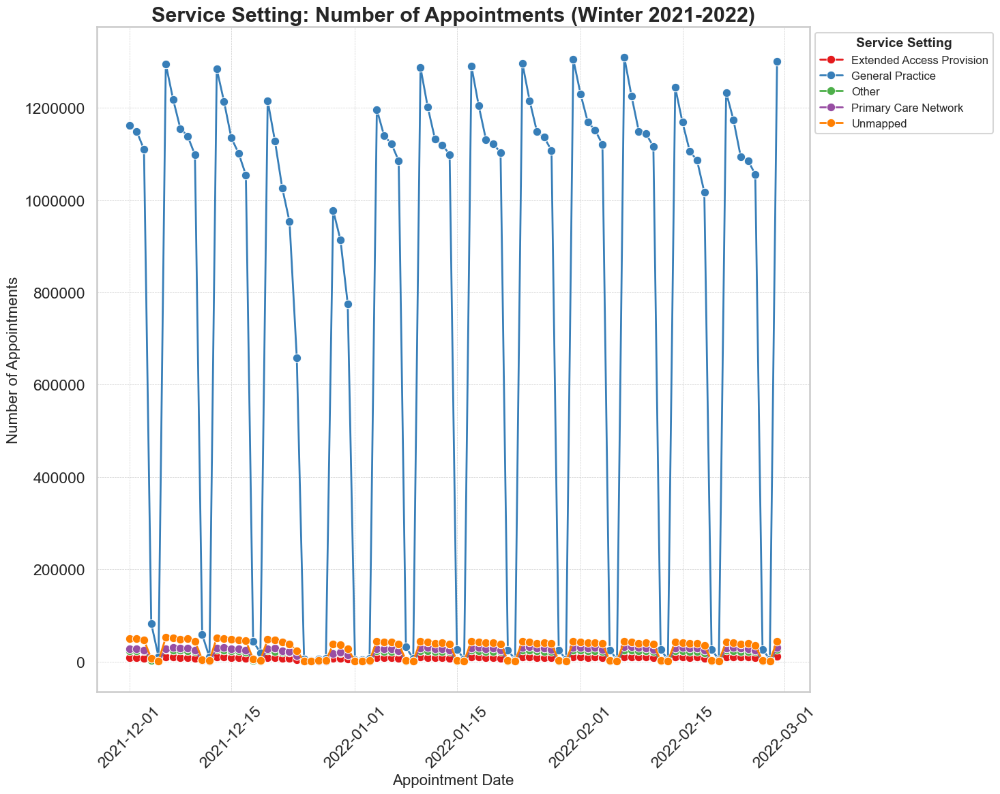

In [77]:
# Visualise the subset using a lineplot.

sns.lineplot(x='appointment_date', 
             y='count_of_appointments', 
             data=nc_ss_day_winter, 
             hue='service_setting',
             marker='o',  
             linewidth=2,  
             palette='Set1', 
             errorbar=None)

plt.title('Service Setting: Number of Appointments (Winter 2021-2022)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Date', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='Service Setting', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)

legend.get_title().set_fontweight('bold')

plt.tight_layout()

#plt.savefig('Service Setting: Number of Appointments (Winter 2021-2022)', dpi=300, bbox_inches='tight')

There appears to be a significant  dip in the number of appointments provided in the latter half of December 2021. 

A possible explanation could be because of the festive season.

**Spring:**

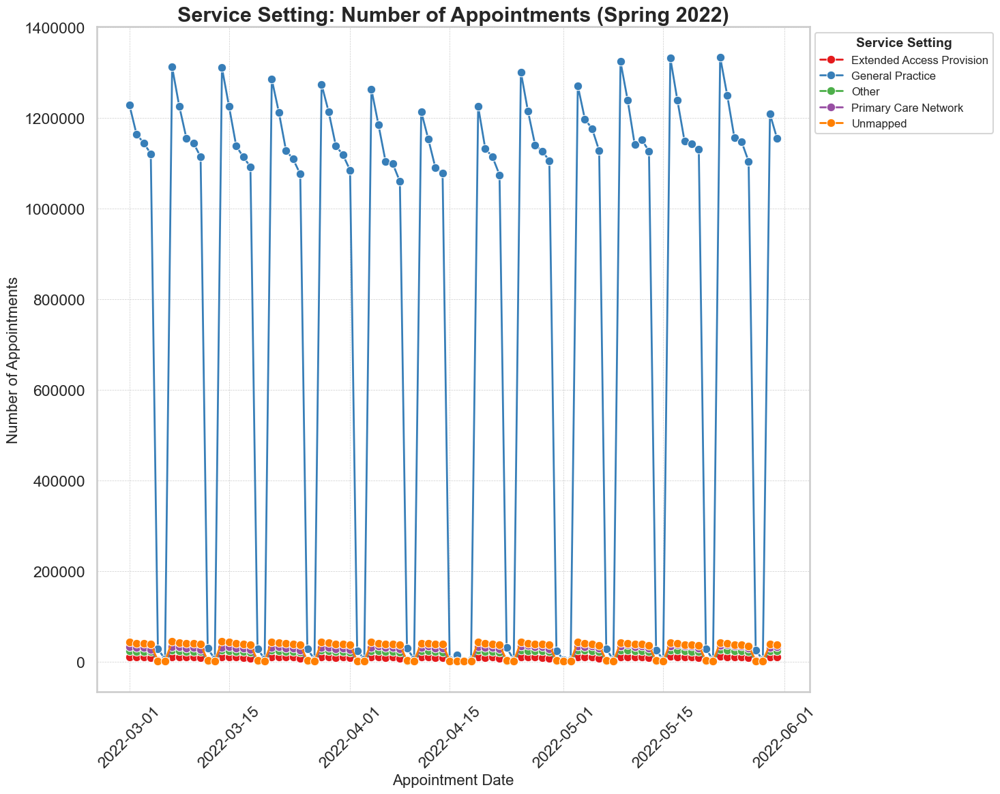

In [78]:
# Visualise the subset using a lineplot.

sns.lineplot(x='appointment_date', 
             y='count_of_appointments', 
             data=nc_ss_day_spring, 
             hue='service_setting',
             marker='o',  
             linewidth=2,  
             palette='Set1',
             errorbar=None)

plt.title('Service Setting: Number of Appointments (Spring 2022)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Date', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='Service Setting', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)

legend.get_title().set_fontweight('bold')

plt.tight_layout()

#plt.savefig('Service Setting: Number of Appointments (Spring 2022)', dpi=300, bbox_inches='tight')

**Summer 2022:**

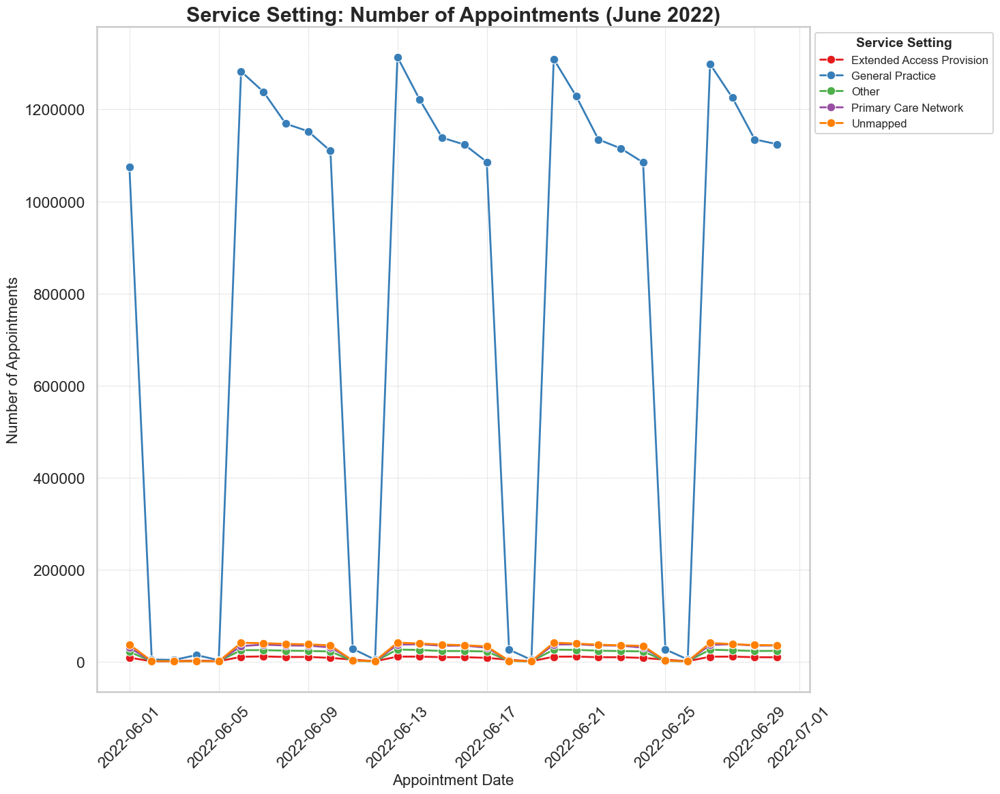

In [79]:
# Visualise the subset using a lineplot.

sns.lineplot(x='appointment_date', 
             y='count_of_appointments', 
             data=nc_ss_day_june22, 
             hue='service_setting',
             marker='o',  
             linewidth=2, 
             palette='Set1',  
             errorbar=None)

plt.title('Service Setting: Number of Appointments (June 2022)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Date', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='Service Setting', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)

legend.get_title().set_fontweight('bold')

plt.tight_layout()

#plt.savefig('Service Setting: Number of Appointments (June 2022)', dpi=300, bbox_inches='tight')

**August 2021 - June 2022**

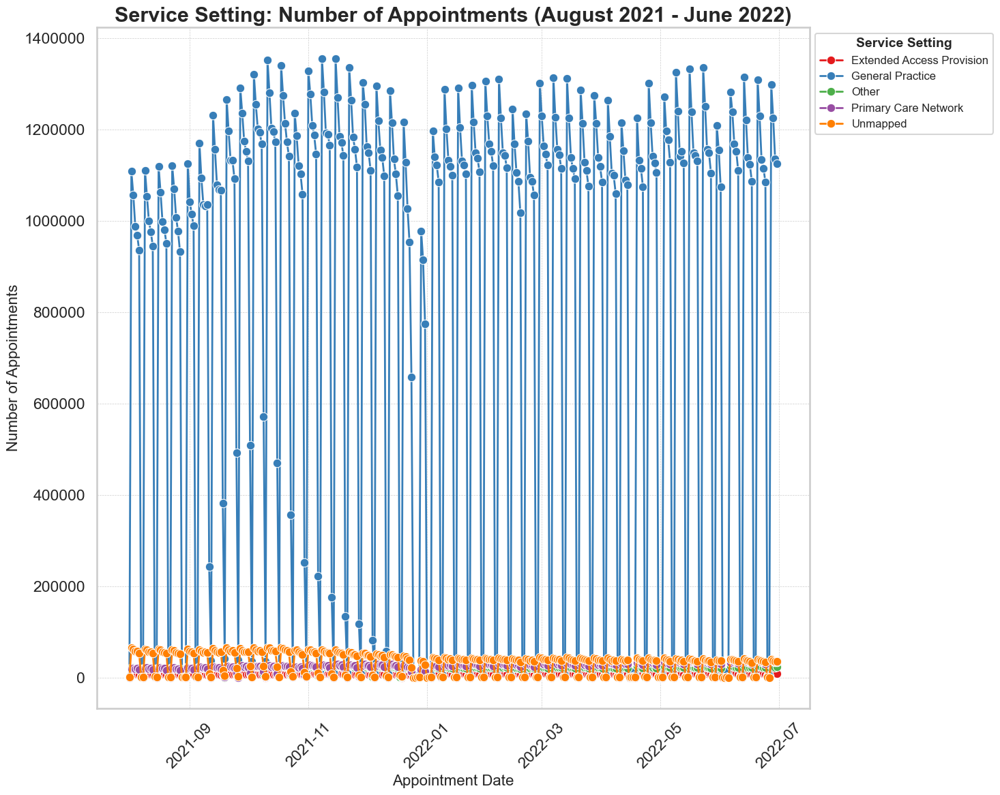

In [80]:
# Create a lineplot for the whole period of the nc DataFrame.

sns.lineplot(x='appointment_date', 
             y='count_of_appointments', 
             data=nc_ss_day, 
             hue='service_setting',
             marker='o',  
             linewidth=2, 
             palette='Set1',  
             errorbar=None)

plt.title('Service Setting: Number of Appointments (August 2021 - June 2022)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Date', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='Service Setting', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)

legend.get_title().set_fontweight('bold')

plt.tight_layout()
#plt.savefig('Service Setting: Number of Appointments (August 2021 - June 2022)', dpi=300, bbox_inches='tight')

General Pratice provides the majority of appointments in the primary care setting. 
Busiest months appear to be Oct till mid-Dec, another spike in January and appointment numbers stabilise until the summer months.

## 6.3 Seasonal trends using nc DataFrame

In [81]:
nc.head()

,icb_ons_code,icb_name,region_name,sub_icb_location_name,appointment_month,appointment_date,service_setting,context_type,national_category,count_of_appointments,month_year
0,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,Primary Care Network,Care Related Encounter,Patient contact during Care Home Round,3,2021-08
1,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,Other,Care Related Encounter,Planned Clinics,7,2021-08
2,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,Home Visit,79,2021-08
3,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,General Consultation Acute,725,2021-08
4,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,Structured Medication Review,2,2021-08


### 6.3.1 Daily Appointments (August 2021 - June 2022)

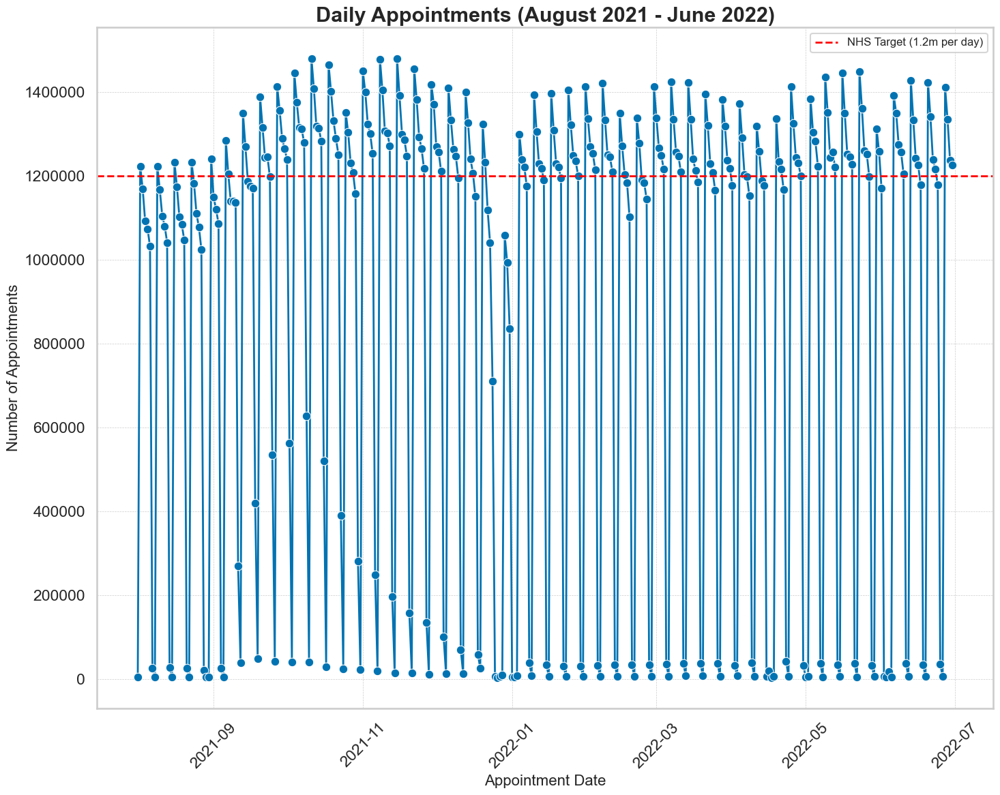

In [82]:
nc['day_of_week'] = nc['appointment_date'].dt.day_name()

nc_daily_appt = nc.groupby(['appointment_date'])[['count_of_appointments']]\
                .sum().reset_index()

# Create the lineplot.
sns.lineplot(x='appointment_date', 
             y='count_of_appointments', 
             data=nc_daily_appt,
             marker='o',  
             linewidth=2,  
             palette='Set1',  
             errorbar=None)

plt.title('Daily Appointments (August 2021 - June 2022)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Date', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)

# Dashed red line at 100% (the NHS target of 1,200,000 appointments per day)
plt.axhline(y=1200000, color='red', linestyle='--', linewidth=2, label='NHS Target (1.2m per day)')

plt.legend(title='', title_fontsize='13', fontsize='12', loc='upper right', frameon=True)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

plt.tight_layout()
#plt.savefig('Daily Appointments (August 2021 - June 2022)', dpi=300, bbox_inches='tight')

This explanatory visualisation shows that the NHS has been operating over-capacity for most of August 2021 - June 2022.

Ties back to the capacity and utilisation elements of the business problem.

This is when compared to the figure which the NHS uses for planning purposes (Capacity of 1.2 million appointments per day).

Utilisation (appointments being provided on the ground) is a lot more and it can be argued that primary care is under significant strain. 

### 6.3.2 Daily Appointments Breakdown by Day of the Week

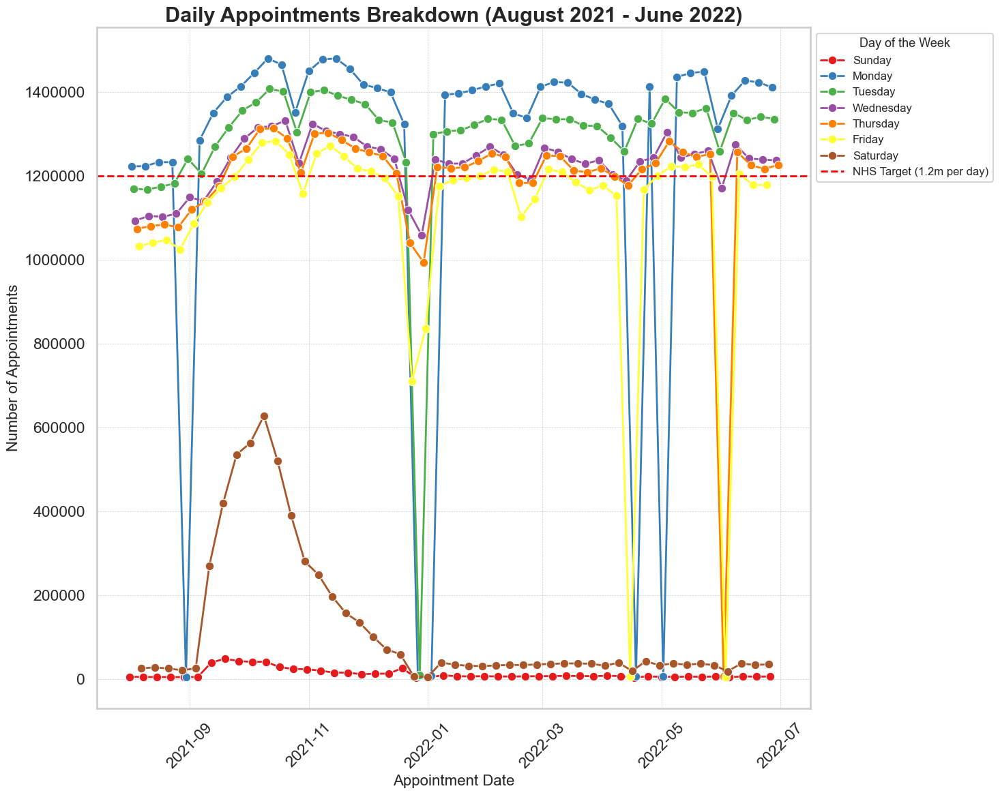

In [83]:
nc_daily_2 = nc.groupby(['appointment_date', 'day_of_week'])[['count_of_appointments']].sum().reset_index()

# Create the line plot.
sns.lineplot(x='appointment_date', 
             y='count_of_appointments',
             hue='day_of_week',
             data=nc_daily_2,
             marker='o',  
             linewidth=2,  
             palette='Set1', 
             errorbar=None)


plt.title('Daily Appointments Breakdown (August 2021 - June 2022)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Date', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)

# Dashed red line at 100% (the NHS target of 1,200,000 appointments per day)
ax = plt.gca()  # Get current axes
ax.axhline(y=1200000, color='red', linestyle='--', linewidth=2, label='NHS Target (1.2m per day)')

plt.grid(True, which='both', linestyle='--', linewidth=0.5)
plt.legend(title='Day of the Week', title_fontsize='13', fontsize='12', 
           loc='upper left', bbox_to_anchor=(1, 1), frameon=True)

plt.tight_layout()
#plt.savefig('Daily Appointments Breakdown (August 2021 - June 2022)', dpi=300, bbox_inches='tight')
plt.show()

This explanatory visualisation is an examination of the previous one by day of the week. 

Ties back to the capacity and utilisation elements of the business problem.

As expected, earlier days of a Mon-Sun week, are the busiest. 

Accounting for Sat and Sun, there are 3 dips in terms utilisation (appointments provided) where weekday appointment offerings failed to hit the NHS target.

The festive period and staff shortages owing to the summer school holidays may be possible explanations.

However, the NHS primary care setting is operating well over capacity over this time period.

# 7. Analysis of Twitter data set

In this section, the tweets.csv data will be examined in order to gauge its usefulness towards the analysis.

In ties back to 'Other Factors' tranche of the business problem.

In general, this section will articulate the merits of external data sources such as Twitter (X) to the NHS.

## 7.1 Data Validation and Cleaning

In [84]:
## Set the figure size.
sns.set(rc={'figure.figsize':(15, 12)})

# Set the plot style as white.
sns.set_style('white')

# Maximum column width to display.
pd.options.display.max_colwidth = 200

In [85]:
# Load the data set.

tweets = pd.read_csv('tweets.csv')

In [86]:
# Explore the metadata and data set.

validate_data(tweets)


First 5 rows of DataFrame:


,tweet_id,tweet_full_text,tweet_entities,tweet_entities_hashtags,tweet_metadata,tweet_retweet_count,tweet_favorite_count,tweet_favorited,tweet_retweeted,tweet_lang
0,1567629223795527681,"As Arkansas’ first Comprehensive Stroke Certified Center, UAMS provides Arkansans with access to the most advanced stoke care. Join us in our mission to make a difference in the health and well-be...","{'hashtags': [{'text': 'Healthcare', 'indices': [253, 264]}], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/yw0cstfmSI', 'expanded_url': 'https://bit.ly/3BiSKbs', 'display_url...",#Healthcare,"{'iso_language_code': 'en', 'result_type': 'recent'}",0,0,False,False,en
1,1567582846612553728,RT @AndreaGrammer: Work-life balance is at the foundation of how decisions are made and where #PremiseHealth is headed. We're #hiring for…,"{'hashtags': [{'text': 'PremiseHealth', 'indices': [94, 108]}, {'text': 'hiring', 'indices': [127, 134]}], 'symbols': [], 'user_mentions': [{'screen_name': 'AndreaGrammer', 'name': 'Andrea Grammer...","#PremiseHealth, #hiring","{'iso_language_code': 'en', 'result_type': 'recent'}",2,0,False,False,en
2,1567582787070304256,RT @OntarioGreens: $10 billion can go a long way to fixing our broken #Healthcare system.\n\nYet Doug Ford would rather spend it ALL on a hig…,"{'hashtags': [{'text': 'Healthcare', 'indices': [70, 81]}], 'symbols': [], 'user_mentions': [{'screen_name': 'OntarioGreens', 'name': 'Green Party of Ontario', 'id': 37115912, 'id_str': '37115912'...",#Healthcare,"{'iso_language_code': 'en', 'result_type': 'recent'}",39,0,False,False,en
3,1567582767625428992,RT @modrnhealthcr: 🚨#NEW:🚨 Insurance companies are figuring out the best ways to collect information about members’ race and ethnicity data…,"{'hashtags': [{'text': 'NEW', 'indices': [20, 24]}], 'symbols': [], 'user_mentions': [{'screen_name': 'modrnhealthcr', 'name': 'Modern Healthcare', 'id': 18935711, 'id_str': '18935711', 'indices':...",#NEW,"{'iso_language_code': 'en', 'result_type': 'recent'}",5,0,False,False,en
4,1567582720460570625,"ICYMI: Our recent blogs on Cybersecurity in Accounting https://t.co/4nnK0FiVVL and Digital Transformation in Healthcare Finance https://t.co/jIqn52lHD3 are a great read, take a look!\n\n#blogs #di...","{'hashtags': [{'text': 'blogs', 'indices': [184, 190]}, {'text': 'digitaltransformation', 'indices': [191, 213]}, {'text': 'cybersecurity', 'indices': [214, 228]}, {'text': 'accounting', 'indices'...","#blogs, #digitaltransformation, #cybersecurity, #accounting, #finance, #healthcare","{'iso_language_code': 'en', 'result_type': 'recent'}",0,0,False,False,en



Last 5 rows of Dataframe:


,tweet_id,tweet_full_text,tweet_entities,tweet_entities_hashtags,tweet_metadata,tweet_retweet_count,tweet_favorite_count,tweet_favorited,tweet_retweeted,tweet_lang
1169,1567583004209332227,RT @PotomacPhotonic: Potomac #Innovation Report: #precisionFabrication techniques Optimize #Microfluidic Mixing of Viscous Fluids \n\n#manuf…,"{'hashtags': [{'text': 'Innovation', 'indices': [29, 40]}, {'text': 'precisionFabrication', 'indices': [50, 71]}, {'text': 'Microfluidic', 'indices': [92, 105]}], 'symbols': [], 'user_mentions': [...","#Innovation, #precisionFabrication, #Microfluidic","{'iso_language_code': 'en', 'result_type': 'recent'}",1,0,False,False,en
1170,1567582945342267393,"Not a cent towards workers who would like to advance their training, especially those already employed by SHA or who for various reasons cannot obtain a student loan. Half of our department applie...","{'hashtags': [{'text': 'SKPoli', 'indices': [232, 239]}, {'text': 'healthcare', 'indices': [240, 251]}], 'symbols': [], 'user_mentions': [], 'urls': [{'url': 'https://t.co/33f7Dz5FrU', 'expanded_u...","#SKPoli, #healthcare","{'iso_language_code': 'en', 'result_type': 'recent'}",0,1,False,False,en
1171,1567582936014241792,"The @hfmaorg Region 9 presents ""The Value of ESG to the Healthcare Industry"" and our own Kris Russell and Ron Present will be the key speakers. This #webinar will be taking place 9/13 and will exp...","{'hashtags': [{'text': 'webinar', 'indices': [149, 157]}, {'text': 'ESG', 'indices': [209, 213]}, {'text': 'healthcare', 'indices': [235, 246]}], 'symbols': [], 'user_mentions': [{'screen_name': '...","#webinar, #ESG, #healthcare","{'iso_language_code': 'en', 'result_type': 'recent'}",0,0,False,False,en
1172,1567582892892782592,Happy physiotherapy 🩺 day 🎉..\n#bpt #physiotherapy \n#HealthyNation #healthcare \n#medicalcare \n#csjmu .\n@WHO \n@MoHFW_INDIA \n@nitish_0210 https://t.co/NQHdIoYymC,"{'hashtags': [{'text': 'bpt', 'indices': [30, 34]}, {'text': 'physiotherapy', 'indices': [35, 49]}, {'text': 'HealthyNation', 'indices': [51, 65]}, {'text': 'healthcare', 'indices': [66, 77]}, {'t...","#bpt, #physiotherapy, #HealthyNation, #healthcare, #medicalcare, #csjmu","{'iso_language_code': 'en', 'result_type': 'recent'}",0,5,False,False,en
1173,1567582846847533058,RT @KimcoStaffing: Apply now to work for #MediQuestStaffing as EVS - #Hospital - 1st #shift - Interviewing Now!! (#NewportBeach) #job http…,"{'hashtags': [{'text': 'MediQuestStaffing', 'indices': [41, 59]}, {'text': 'Hospital', 'indices': [69, 78]}, {'text': 'shift', 'indices': [85, 91]}, {'text': 'NewportBeach', 'indices': [115, 128]}...","#MediQuestStaffing, #Hospital, #shift, #NewportBeach, #job","{'iso_language_code': 'en', 'result_type': 'recent'}",2,0,False,False,en



Shape of DataFrame:
(1174, 10)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1174 entries, 0 to 1173
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   tweet_id                 1174 non-null   int64 
 1   tweet_full_text          1174 non-null   object
 2   tweet_entities           1174 non-null   object
 3   tweet_entities_hashtags  1007 non-null   object
 4   tweet_metadata           1174 non-null   object
 5   tweet_retweet_count      1174 non-null   int64 
 6   tweet_favorite_count     1174 non-null   int64 
 7   tweet_favorited          1174 non-null   bool  
 8   tweet_retweeted          1174 non-null   bool  
 9   tweet_lang               1174 non-null   object
dtypes: bool(2), int64(3), object(5)
memory usage: 75.8+ KB

Number of nulls per column:
tweet_id                     0
tweet_full_text              0
tweet_entities               0
tweet_entities_hashtags   

In [87]:
# Would it be useful to only look at retweeted and favourite tweet messages?
# Explore the tweet_retweet_count and tweet_favorite_count columns with the value_counts()
# Explain your answer.

#Retweet Count:

retweet_count = tweets[['tweet_retweet_count']].value_counts().sort_index()

retweet_count

tweet_retweet_count
0                      526
1                      215
2                      114
3                       70
4                       27
5                       35
6                       12
7                       18
8                       15
9                       13
10                       5
11                       6
12                      16
13                       1
14                       1
15                       1
16                       2
19                       1
20                       1
23                       2
24                       2
35                      10
37                       6
39                       1
40                       1
41                       3
44                       4
48                       1
49                       1
53                       5
54                       1
57                       1
62                       3
63                       4
68                       3
72                       2
73      

In [88]:
#Favourite count
favourite_count = tweets[['tweet_favorite_count']].value_counts().sort_index()

favourite_count

tweet_favorite_count
0                       1027
1                         91
2                         16
3                         13
4                          7
5                          5
6                          2
7                          1
8                          1
9                          1
10                         1
11                         1
12                         1
13                         1
14                         1
17                         1
18                         1
20                         1
28                         1
42                         1
Name: count, dtype: int64

**Would it be useful to only look at retweeted and favourite tweet messages?**

By looking at retweeted and favourited tweet messages, it would be possible to gauge which tweets have had more interaction and reached a wider audience. An anomaly in the data is that tweets with retweet count & favourite count greater than or equal to 1, have a 'False' boolean value in the tweet_favorited and tweet_retweeted columns. 

In [89]:
# Create a new DataFrame containing only the text.
tweets_text = tweets[['tweet_full_text']].copy()

display(tweets_text)

,tweet_full_text
0,"As Arkansas’ first Comprehensive Stroke Certified Center, UAMS provides Arkansans with access to the most advanced stoke care. Join us in our mission to make a difference in the health and well-be..."
1,RT @AndreaGrammer: Work-life balance is at the foundation of how decisions are made and where #PremiseHealth is headed. We're #hiring for…
2,RT @OntarioGreens: $10 billion can go a long way to fixing our broken #Healthcare system.\n\nYet Doug Ford would rather spend it ALL on a hig…
3,RT @modrnhealthcr: 🚨#NEW:🚨 Insurance companies are figuring out the best ways to collect information about members’ race and ethnicity data…
4,"ICYMI: Our recent blogs on Cybersecurity in Accounting https://t.co/4nnK0FiVVL and Digital Transformation in Healthcare Finance https://t.co/jIqn52lHD3 are a great read, take a look!\n\n#blogs #di..."
...,...
1169,RT @PotomacPhotonic: Potomac #Innovation Report: #precisionFabrication techniques Optimize #Microfluidic Mixing of Viscous Fluids \n\n#manuf…
1170,"Not a cent towards workers who would like to advance their training, especially those already employed by SHA or who for various reasons cannot obtain a student loan. Half of our department applie..."
1171,"The @hfmaorg Region 9 presents ""The Value of ESG to the Healthcare Industry"" and our own Kris Russell and Ron Present will be the key speakers. This #webinar will be taking place 9/13 and will exp..."
1172,Happy physiotherapy 🩺 day 🎉..\n#bpt #physiotherapy \n#HealthyNation #healthcare \n#medicalcare \n#csjmu .\n@WHO \n@MoHFW_INDIA \n@nitish_0210 https://t.co/NQHdIoYymC


In [90]:
# Loop through the messages, and create a list of values containing the # symbol.

tags = []

for y in [x.split(' ') for x in tweets['tweet_full_text'].values]:
    for z in y:
        if '#' in z:
            # Change to lowercase.
            tags.append(z.lower())

# Create a Pandas Series to count the values in the 'tags' list 

tags = pd.Series(tags)

# Use value_counts() to get the count of occurrences for each unique value

value_counts_tags = tags.value_counts()


In [91]:
# Display the first 30 records.

value_counts_tags.head(30)

#healthcare                    716
#health                         80
#medicine                       41
#ai                             40
#job                            38
#medical                        35
#strategy                       30
#pharmaceutical                 28
#digitalhealth                  25
#pharma                         25
#marketing                      25
#medtwitter                     24
#biotech                        24
#competitiveintelligence        24
#meded                          23
#vaccine                        18
#hiring                         18
#news                           17
#machinelearning                17
#technology                     17
#coronavirus                    16
#womeninmedicine                16
#covid                          16
#competitivemarketing           16
#wellness                       15
#healthtech                     15
#doctorofveterinarymedicine     14
#science                        14
#medicare           

In [92]:
# Convert the series to a DataFrame in preparation for visualisation.

tags_df = pd.DataFrame(value_counts_tags).reset_index()

# Rename the columns.
tags_df.rename(columns={tags_df.columns[0]: "hashtag",
                          tags_df.columns[1]: "count"}, inplace=True)
tags_df

,hashtag,count
0,#healthcare,716
1,#health,80
2,#medicine,41
3,#ai,40
4,#job,38
...,...,...
1749,#evestudy,1
1750,#patientdata…,1
1751,#secure,1
1752,#sms,1


In [93]:
# Fix the count datatype.
tags_df['count'].astype(int)

tags_df.dtypes

hashtag    object
count       int64
dtype: object

In [94]:
# Display records where the count is larger than 12.
tags_df_12plus = tags_df[tags_df['count'] > 12]

tags_df_12plus

,hashtag,count
0,#healthcare,716
1,#health,80
2,#medicine,41
3,#ai,40
4,#job,38
5,#medical,35
6,#strategy,30
7,#pharmaceutical,28
8,#digitalhealth,25
9,#pharma,25


## 7.2 Top Trending Hashtags Visualisation

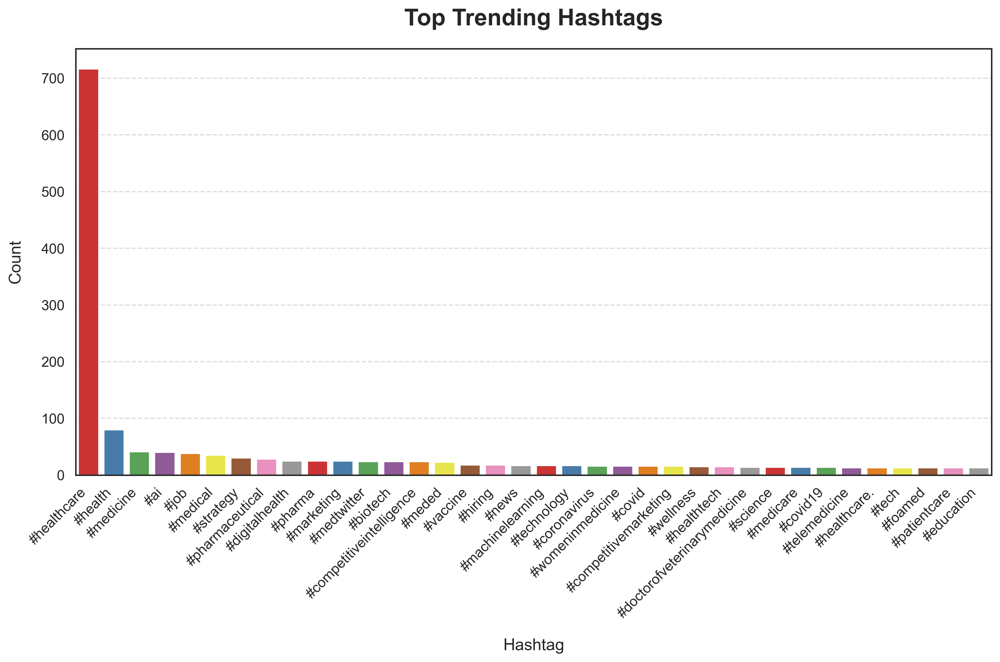

In [95]:
# Create a barplot to display top trending hashtags.

plt.figure(figsize=(12, 8), dpi=300)
sns.barplot(x='hashtag', y='count', data=tags_df_12plus, palette='Set1')
plt.title('Top Trending Hashtags', fontsize=20, fontweight='bold', pad=20)
plt.xlabel('Hashtag', fontsize=14, labelpad=15)
plt.ylabel('Count', fontsize=14, labelpad=15)
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
#plt.savefig('Top Trending Hashtags', dpi=300, bbox_inches='tight')

A more focused analysis would have been possible with a datset containing more relevant hashtags linked to specific ICB or sub-ICB initiatives. 

**Hashtag tracking** would then have been possible which would have helped with capturing patient feedback. 

This would in turn have helped with more effectively monitoring capacity levels and patient satisfaction - providing actionable data for improving services and patient care. 

E.g. marketing material may feature relevant Twitter(X) handles and hashtags for patients to engage with NHS bodies.

Tools which could be utilised are:

* Sentiment Analysis: To assess overall sentiment in tweets (positive, neutral, or negative) towards specific NHS services or facilities.

* Natural Language Processing: To analyze and categorize patient feedback for identifying trends, recurring issues, and specific patient concerns.

* Social Listening Tools: To track mentions of NHS-related keywords and hashtags for proactive engagement and real-time feedback.

With the limited nature of the data provided, a sentiment analysis may be conducted.

## 7.3 Sentiment Analysis of Twitter data

In [96]:
# Create function to calculate a sentiment score for each tweet.

def get_sentiment_score(tweet):
    sia = SentimentIntensityAnalyzer()
    return sia.polarity_scores(tweet)['compound']

# Apply the sentiment analysis function to each tweet in the dataframe.
tweets_text['sentiment_score'] = tweets_text['tweet_full_text'].apply(get_sentiment_score)

tweets_text

,tweet_full_text,sentiment_score
0,"As Arkansas’ first Comprehensive Stroke Certified Center, UAMS provides Arkansans with access to the most advanced stoke care. Join us in our mission to make a difference in the health and well-be...",0.8384
1,RT @AndreaGrammer: Work-life balance is at the foundation of how decisions are made and where #PremiseHealth is headed. We're #hiring for…,0.0000
2,RT @OntarioGreens: $10 billion can go a long way to fixing our broken #Healthcare system.\n\nYet Doug Ford would rather spend it ALL on a hig…,-0.4767
3,RT @modrnhealthcr: 🚨#NEW:🚨 Insurance companies are figuring out the best ways to collect information about members’ race and ethnicity data…,0.6369
4,"ICYMI: Our recent blogs on Cybersecurity in Accounting https://t.co/4nnK0FiVVL and Digital Transformation in Healthcare Finance https://t.co/jIqn52lHD3 are a great read, take a look!\n\n#blogs #di...",0.6588
...,...,...
1169,RT @PotomacPhotonic: Potomac #Innovation Report: #precisionFabrication techniques Optimize #Microfluidic Mixing of Viscous Fluids \n\n#manuf…,0.4939
1170,"Not a cent towards workers who would like to advance their training, especially those already employed by SHA or who for various reasons cannot obtain a student loan. Half of our department applie...",0.3612
1171,"The @hfmaorg Region 9 presents ""The Value of ESG to the Healthcare Industry"" and our own Kris Russell and Ron Present will be the key speakers. This #webinar will be taking place 9/13 and will exp...",0.4939
1172,Happy physiotherapy 🩺 day 🎉..\n#bpt #physiotherapy \n#HealthyNation #healthcare \n#medicalcare \n#csjmu .\n@WHO \n@MoHFW_INDIA \n@nitish_0210 https://t.co/NQHdIoYymC,0.5719


Text(0, 0.5, 'Frequency')

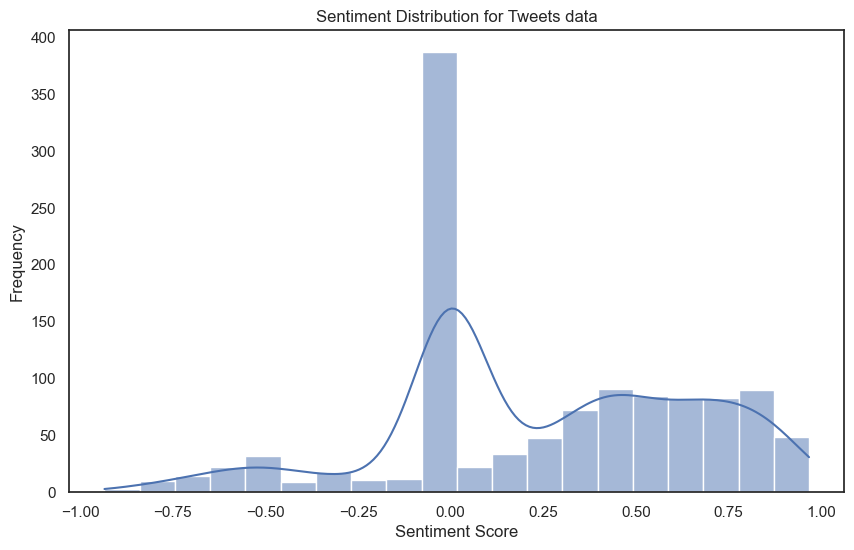

In [97]:
# Visualize the sentiment distribution.

plt.figure(figsize=(10, 6))
sns.histplot(tweets_text['sentiment_score'], bins=20, kde=True)
plt.title('Sentiment Distribution for Tweets data')
plt.xlabel('Sentiment Score')
plt.ylabel('Frequency')
#plt.savefig('Sentiment Distribution for Tweets data', dpi=300, bbox_inches='tight')

The NLTK Sentiment Analysis provides a sentiment score between -1 (Negative) and 1 (Positive) for each tweet. 

The above histogram shows a slight overall positive sentiment, but still relatively close to neutral. 

It is important to the note that the tweets.csv includes tweets from around the world and a more relevant analysis would have to be conducted on a dataset with keywords and hashtags of more relevance to the NHS.

https://www.datacamp.com/tutorial/text-analytics-beginners-nltk

## 7.4 Using lambda function to locate mentions of NHS

In [98]:
# Using lambda function to locate mentions of NHS in tweets_text.

nhs_tweets = tweets_text[tweets_text['tweet_full_text'].apply(lambda x: 'nhs' in x.lower())]

In [99]:
print(f"Tweets mentioning the NHS: {nhs_tweets.shape[0]}")
nhs_tweets

Tweets mentioning the NHS: 3


,tweet_full_text,sentiment_score
200,RT @LaunchpadDevon: @RDCareersNHS Recruitment Event Exeter – Saturday 17 September\n\nThis event is for anyone interested in roles availabl…,0.4019
231,RT @SkillsLaunchpad: Recruitment Event Exeter – Saturday 17 September with @RDCareersNHS \n\nFor anyone interested in #administration #heal…,0.4019
450,HLA Scholar Thessa Rebecca Frieble from our Amsterdam cohort tells us what leadership means to her.\n\nhttps://t.co/Wt4ZmQ3H3z\n\n#HLAScholars #Leadership #HLA #Healthcare #NHS #doctor #Medical #S...,0.0000


With the provided tweets.csv, there appears to only be 3 mentions of the NHS.

# 8. Investigating of the main concerns posed by the NHS. 

This section a continuation of section 6.

Areas explored previously will be re-examined with a focus will be on generating visualisations in terms of gauging capacity and utilisation.

Explanatory visualisations will be identified and these along with the ones generated previously, will form the basis of further analysis.

## 8.1 Should the NHS start looking at increasing staff levels? Using ar DataFrame.

In [100]:
# Determine the total number of appointments per month.
ar_df = ar.groupby('appointment_month')['count_of_appointments'].sum().reset_index()

# Add a new column to indicate the average utilisation of services.
# Monthly aggregate / 22 to get to a daily value.
# 22 days used to reflect a 5 day per week service.

ar_df['daily_capacity'] = (ar_df['count_of_appointments'] / 22)
ar_df['daily_capacity'] = ar_df['daily_capacity'].round(1)

ar_df['capacity_%'] = ((ar_df['count_of_appointments'] / 22) / 1200000 * 100)
ar_df['capacity_%'] = ar_df['capacity_%'].round(1)

ar_df.head()

,appointment_month,count_of_appointments,daily_capacity,capacity_%
0,2020-01-01,27191758,1235989.0,103.0
1,2020-02-01,24097066,1095321.2,91.3
2,2020-03-01,24039635,1092710.7,91.1
3,2020-04-01,16002488,727385.8,60.6
4,2020-05-01,16410591,745936.0,62.2


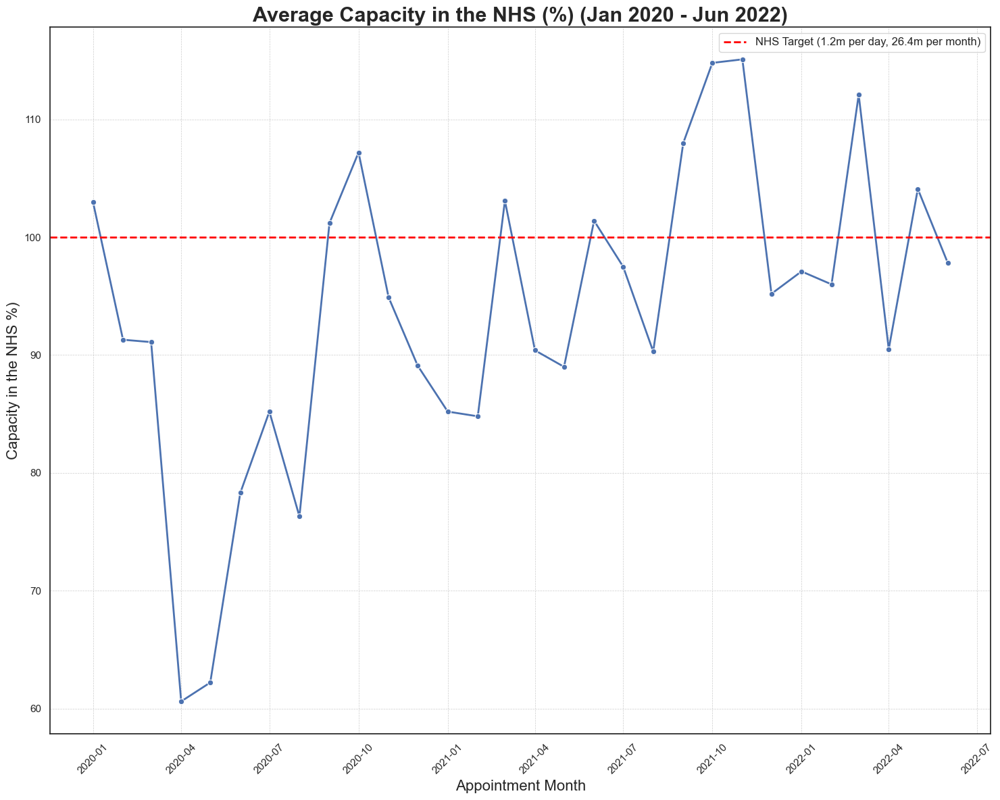

In [101]:
# Average capacity as a % of NHS target of 1,200,000 average appointments per day.

# Create a lineplot.
sns.lineplot(x='appointment_month', 
             y='capacity_%', 
             data=ar_df, 
             marker='o',  
             linewidth=2,  
             palette='Set1',  
             errorbar=None)

plt.title('Average Capacity in the NHS (%) (Jan 2020 - Jun 2022)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Month', fontsize=16)
plt.ylabel('Capacity in the NHS %)', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)
legend.get_title().set_fontweight('bold')

# Dashed red line at 100% (the NHS target of 1,200,000 appointments per day)
plt.axhline(y=100, color='red', linestyle='--', linewidth=2, label='NHS Target (1.2m per day, 26.4m per month)')
plt.legend(title='', title_fontsize='13', fontsize='12', loc='upper right', frameon=True)
#plt.savefig('Average Capacity in the NHS (%) (Jan 2020 - Jun 2022)', dpi=300, bbox_inches='tight')
plt.tight_layout()

This is a key explanatory visualisation.

A similar visualisation  was generated previously using the nc DataFrame. The ar DataFrame covers a longer timeframe (Jan 2020 - June 2020) and it can be ssen that, other than during the Covid-19 lockdown period, the NHS has been operating well over capacity.

Covid-19 is an outlier and it is not unreasonable to suggest that subsequent periods depict the true operational strain of primary care.

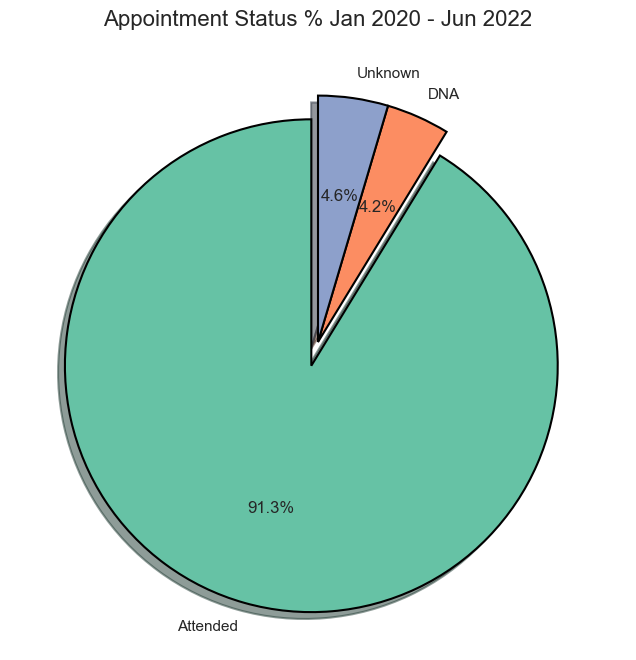

In [102]:
# Group by 'appointment_status' and sum 'count_of_appointments'.
ar_utilisation = ar.groupby(['appointment_status'])['count_of_appointments'].sum().reset_index()

# Calculate the total sum of 'count_of_appointments'.
total_ar_appointments = ar_utilisation['count_of_appointments'].sum()

# Add a new column for the percentage.
ar_utilisation['% of total'] = (ar_utilisation['count_of_appointments'] / total_ar_appointments) * 100

# Create a pie chart.
plt.figure(figsize=(8,8))  

# Use explode to highlight the largest slice.
explode = (0.1, 0, 0) 

labels = ['Attended', 'DNA', 'Unknown']

plt.pie(ar_utilisation['% of total'], 
        labels=labels, 
        autopct='%1.1f%%', 
        startangle=90, 
        colors=sns.color_palette("Set2", len(ar_utilisation['% of total'])),
        explode=explode,  #
        shadow=True,  
        wedgeprops={'edgecolor': 'black', 'linewidth': 1.5}  
)

plt.title('Appointment Status % Jan 2020 - Jun 2022', fontsize=16)

#plt.savefig('Appointment Status % Jan 2020 - Jun 2022', dpi=300, bbox_inches='tight')

plt.show()

A repeat of a visualisation generated previously.

## 8.2 How do the healthcare professional types differ over time?

In [103]:
ar_hcp = ar.groupby(['appointment_month', 'hcp_type'])['count_of_appointments'].sum().reset_index()

ar_hcp.head()

,appointment_month,hcp_type,count_of_appointments
0,2020-01-01,GP,14166016
1,2020-01-01,Other Practice staff,12323161
2,2020-01-01,Unknown,702581
3,2020-02-01,GP,12465443
4,2020-02-01,Other Practice staff,10999127


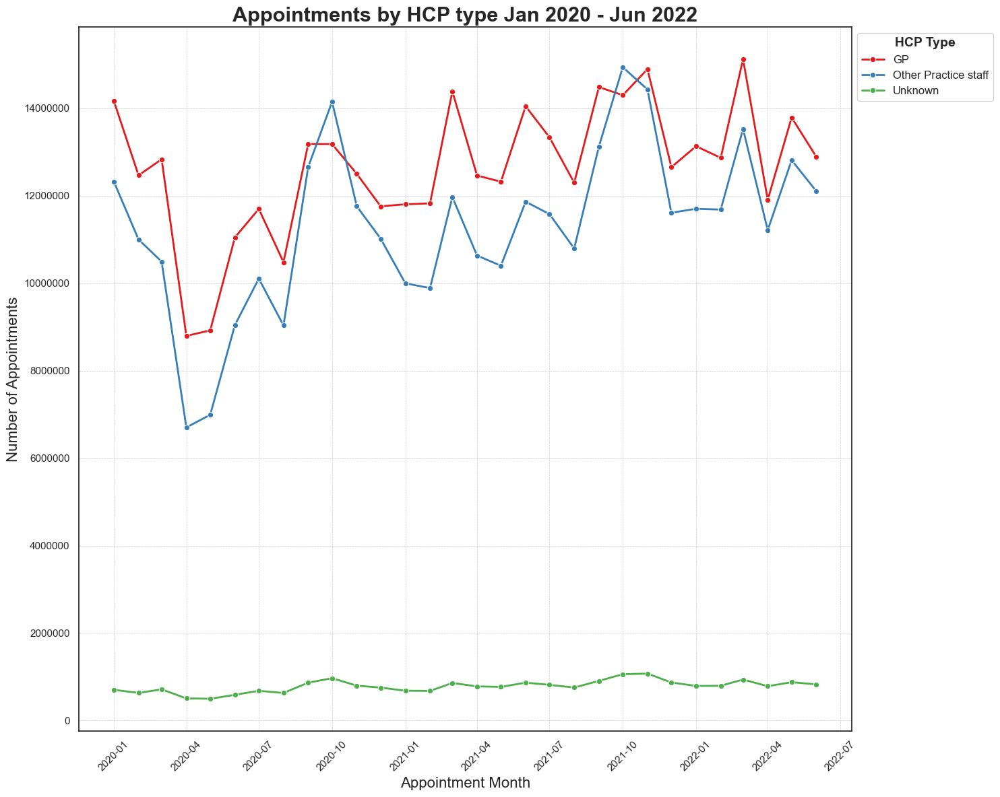

In [104]:
# Create a lineplot to answer the question - how do HCP types differ over time?

sns.lineplot(x='appointment_month', 
             y='count_of_appointments', 
             data=ar_hcp, 
             hue='hcp_type',
             marker='o',  
             linewidth=2,  
             palette='Set1',  
             errorbar=None)


plt.title('Appointments by HCP type Jan 2020 - Jun 2022', 
          fontsize=22, 
          fontweight='bold')


plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Month', fontsize=16)
plt.ylabel('Number of Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='HCP Type', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)


legend.get_title().set_fontweight('bold')

#plt.savefig('Appointments by HCP type Jan 2020 - Jun 2022', dpi=300, bbox_inches='tight')

plt.tight_layout()

## 8.3 Are there significant changes in whether or not visits are attended?

In [105]:
# Group by 'appointment_month' and 'appointment_status' and sum 'count_of_appointments'.
ar_appt_status = ar.groupby(['appointment_month', 'appointment_status'])['count_of_appointments'].sum().reset_index()

# Calculate total appointments per month.
ar_appt_status['total_monthly'] = ar_appt_status.groupby('appointment_month')['count_of_appointments'].transform('sum')

# Calculate percentage of total appointments for each status.
ar_appt_status['% of total'] = (ar_appt_status['count_of_appointments'] / ar_appt_status['total_monthly']) * 100

ar_appt_status.head()

,appointment_month,appointment_status,count_of_appointments,total_monthly,% of total
0,2020-01-01,Attended,24535581,27191758,90.231683
1,2020-01-01,DNA,1296082,27191758,4.766452
2,2020-01-01,Unknown,1360095,27191758,5.001865
3,2020-02-01,Attended,21637928,24097066,89.794865
4,2020-02-01,DNA,1213091,24097066,5.034185


<Figure size 1000x600 with 0 Axes>

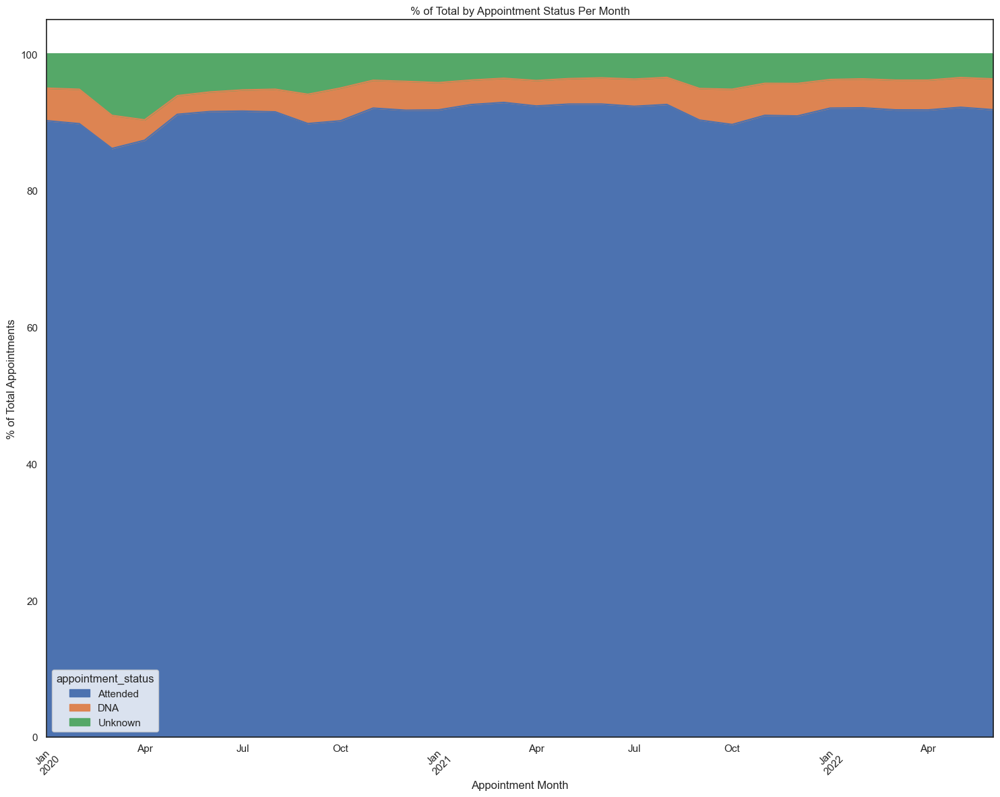

In [106]:
pivot_appt_status = ar_appt_status.pivot(index='appointment_month', columns='appointment_status', values='% of total')

# Plot a stacked area plot to answer the question - Are there significant changes whether or not visits are attended?
plt.figure(figsize=(10, 6))
pivot_appt_status.plot(kind='area', stacked=True, figsize=(15, 12))
plt.title('% of Total by Appointment Status Per Month')
plt.xlabel('Appointment Month')
plt.ylabel('% of Total Appointments')
plt.xticks(rotation=45)
#plt.savefig('% of Total by Appointment Status Per Month', dpi=300, bbox_inches='tight')

plt.tight_layout()

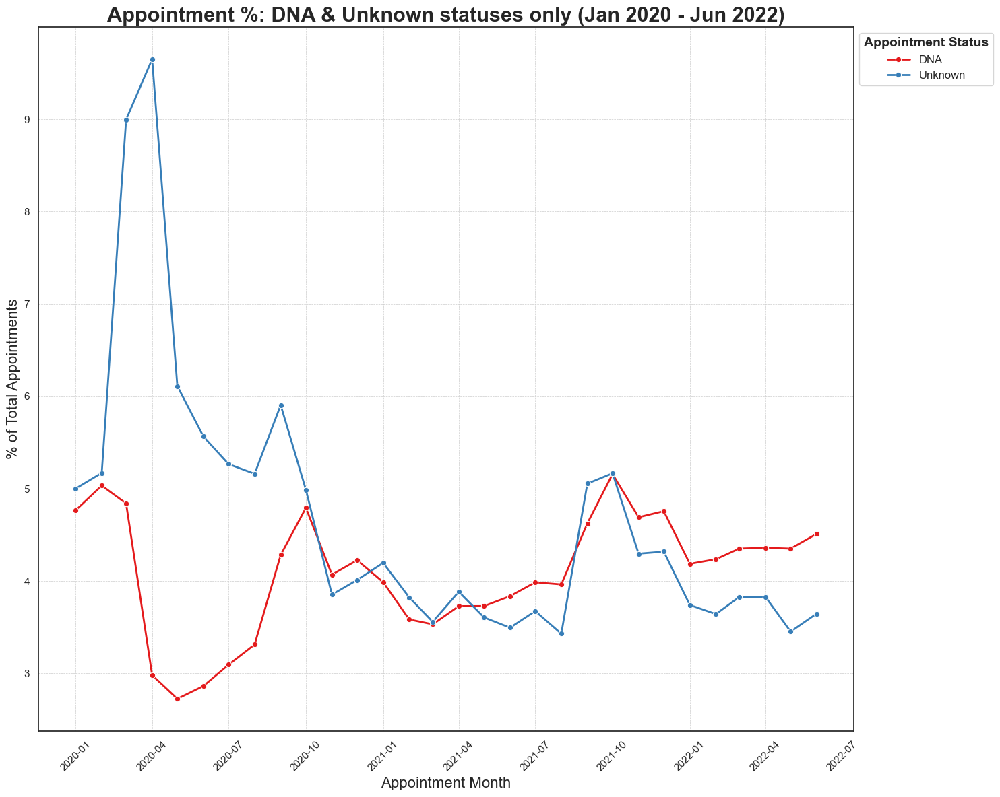

In [107]:
# Filter the data for DNA appointments
ar_appt_no_attend = ar_appt_status[ar_appt_status['appointment_status'].isin(['DNA', 'Unknown'])]

# Create lineplot to answer the question - DNA & Unknown statuses only % of Appointments (Jan 2020 - June 2022)
sns.lineplot(x='appointment_month', 
             y='% of total', 
             data=ar_appt_no_attend,
             hue='appointment_status',
             marker='o',  
             linewidth=2, 
             palette='Set1',  
             errorbar=None)


plt.title('Appointment %: DNA & Unknown statuses only (Jan 2020 - Jun 2022)', 
          fontsize=22, 
          fontweight='bold')

plt.ticklabel_format(style='plain', axis='y')
plt.xlabel('Appointment Month', fontsize=16)
plt.ylabel('% of Total Appointments', fontsize=16)
plt.xticks(rotation=45)
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Customize the legend.
legend_font = {'size': 12}
legend = plt.legend(title='Appointment Status', 
                    title_fontsize=14, 
                    loc='upper left', 
                    bbox_to_anchor=(1, 1), 
                    prop=legend_font)

legend.get_title().set_fontweight('bold')

#plt.savefig('Appointment %: DNA & Unknown statuses only (Jan 2020 - Jun 2022)', dpi=300, bbox_inches='tight')

plt.tight_layout()

In [108]:
# DNA over time

# Filter the ar dataset for DNA appointments only.
dna_appointments = ar[ar['appointment_status'] == 'DNA']

dna = dna_appointments.groupby(['appointment_month'])['count_of_appointments'].sum().reset_index()
dna_avg_per_month = dna['count_of_appointments'].sum()/30

print(f'Average DNA numbers per month Jan 2020 - Jun 22: {dna_avg_per_month}')

Average DNA numbers per month Jan 2020 - Jun 22: 1027767.1666666666


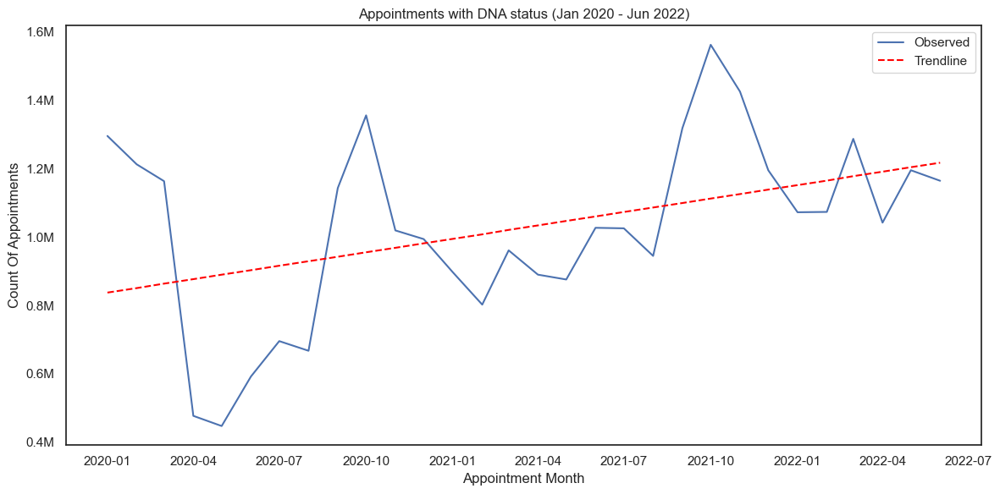

In [109]:
# Generate time series plot with trendline - Appointment with DNA status (Jan 2020 - June 2022).

generate_time_series_plot_with_trendline(dna, time_col='appointment_month', \
                                         value_col='count_of_appointments', \
                                         title="Appointments with DNA status (Jan 2020 - Jun 2022)")

This is a key explanatory visualisation and identifies an important trend worth.

DNA appointments are on the rise. Whilst they only represent 4.2% of total appointments, reasons for their occurence are worth investigating in terms of efficient utilisation of resources.

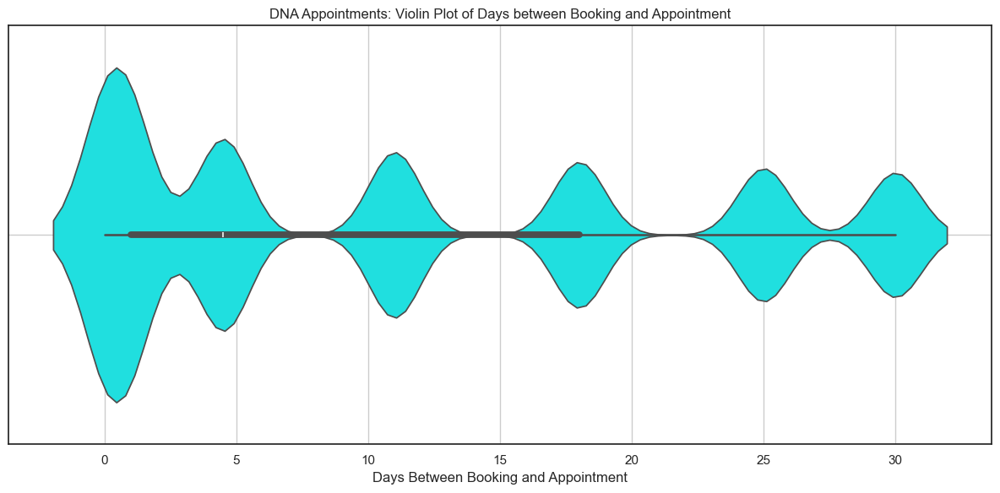

In [110]:
# Drop rows in dna_appointments where TBBA = 'Unknown/Data Quality'.
dna_tbba = dna_appointments[dna_appointments['time_between_book_and_appointment'] != 'Unknown / Data Quality']

# Define a mapping using dictionary.
# This is to map categories to integers to enable analysis.
tbba_dict = {
    'Same Day': 0,
    '1 Day': 1,
    '2 to 7 Days': 4.5,
    '8  to 14 Days': 11,
    '15  to 21 Days': 18,
    '22  to 28 Days': 25,
    'More than 28 Days': 30
}

# Create a new column with mapped integer values.
dna_tbba['time_between_book_and_appointment_numeric'] = dna_tbba['time_between_book_and_appointment'].map(tbba_dict)

# Plot a violin plot.
plt.figure(figsize=(12, 6))
sns.violinplot(x=dna_tbba['time_between_book_and_appointment_numeric'], color='cyan')
plt.title('DNA Appointments: Violin Plot of Days between Booking and Appointment')
plt.xlabel('Days Between Booking and Appointment')
plt.grid(True)
plt.tight_layout()

#plt.savefig('Violin Plot'), dpi=300, bbox_inches='tight')

plt.show()

This is an explanatory visualisation and it is puzzling! it suggests that A=as days between booking & appointment increases, the number DNA appointments decrease.
In other words, other than 1 day, lower wait times between booking and appointment, are associated with higher DNA levels.

Why? See sections 9.5 & 9.6.2 for a possible reason.

In [111]:
dna_appointments = dna_appointments.reset_index(drop=True)

In [112]:
print('\nTotal DNA appointments in ar dataset:')
dna_appointments['count_of_appointments'].sum()


Total DNA appointments in ar dataset:


30833015

In [113]:
# Which appointment mode has the highest DNA rate?

dna_appt_mode = dna_appointments.groupby('appointment_mode')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'appointment_mode':'Appointment Mode', \
                         'count_of_appointments':'Total DNA Appointments'})

dna_appt_mode

,Appointment Mode,Total DNA Appointments
0,Face-to-Face,24216573
1,Telephone,5231667
2,Unknown,1045268
3,Home Visit,182560
4,Video/Online,156947


In [114]:
# Which HCP type has the highest DNA rate?

dna_appt_hcp = dna_appointments.groupby('hcp_type')[['count_of_appointments']]\
        .sum().sort_values('count_of_appointments', ascending=False)\
        .reset_index()\
        .rename(columns={'hcp_type':'HCP Type', \
                         'count_of_appointments':'Total DNA Appointments'})

dna_appt_hcp

,HCP Type,Total DNA Appointments
0,Other Practice staff,20789185
1,GP,9397907
2,Unknown,645923


In [115]:
# ICB breakdown of DNA appointments.

dna_appt_icb = dna_appointments.groupby('icb_name')[['count_of_appointments']].sum()\
                        .sort_values('count_of_appointments', ascending=False)\
                        .reset_index()\
                        .rename(columns={'icb_name': 'Integrated Care Board', \
                                         'count_of_appointments': 'Total DNA Appointments'})
dna_appt_icb.head(10)

,Integrated Care Board,Total DNA Appointments
0,Greater Manchester ICB,1928168
1,North East and North Cumbria ICB,1668009
2,Cheshire and Merseyside ICB,1648264
3,North East London ICB,1317005
4,North West London ICB,1286262
5,West Yorkshire ICB,1154103
6,South East London ICB,1107753
7,Black Country ICB,1023176
8,Kent and Medway ICB,1015035
9,Lancashire and South Cumbria ICB,953409


In [116]:
# Regional breakdown of DNA appointments.
# Ruled out regional analysis earlier.

dna_appt_region = dna_appointments.groupby('region_name')[['count_of_appointments']].sum()\
                        .sort_values('count_of_appointments', ascending=False)\
                        .reset_index()\
                        .rename(columns={'region_name': 'NHS Region', \
                                         'count_of_appointments': 'Total DNA Appointments'})
dna_appt_region

,NHS Region,Total DNA Appointments
0,Midlands,6075157
1,London,5457490
2,South East,4563108
3,North West,4529841
4,North East and Yorkshire,4339381
5,South West,3047210
6,East of England,2820828


## 8.4 Are there changes in terms of appointment mode over time?

In [117]:
ar_appt_mode = ar.groupby(['appointment_month', 'appointment_mode'])['count_of_appointments'].sum().reset_index()

# Calculate total appointments per month.
ar_appt_mode['total_monthly'] = ar_appt_mode.groupby('appointment_month')['count_of_appointments'].transform('sum')

# Calculate percentage of total appointments for each status.
ar_appt_mode['% of total'] = (ar_appt_mode['count_of_appointments'] / ar_appt_mode['total_monthly']) * 100

ar_appt_mode['% of total'] = ar_appt_mode['% of total'].round(2)

ar_appt_mode

,appointment_month,appointment_mode,count_of_appointments,total_monthly,% of total
0,2020-01-01,Face-to-Face,21730843,27191758,79.92
1,2020-01-01,Home Visit,265092,27191758,0.97
2,2020-01-01,Telephone,3699600,27191758,13.61
3,2020-01-01,Unknown,1302527,27191758,4.79
4,2020-01-01,Video/Online,193696,27191758,0.71
...,...,...,...,...,...
145,2022-06-01,Face-to-Face,16740856,25819426,64.84
146,2022-06-01,Home Visit,186261,25819426,0.72
147,2022-06-01,Telephone,8078941,25819426,31.29
148,2022-06-01,Unknown,677392,25819426,2.62


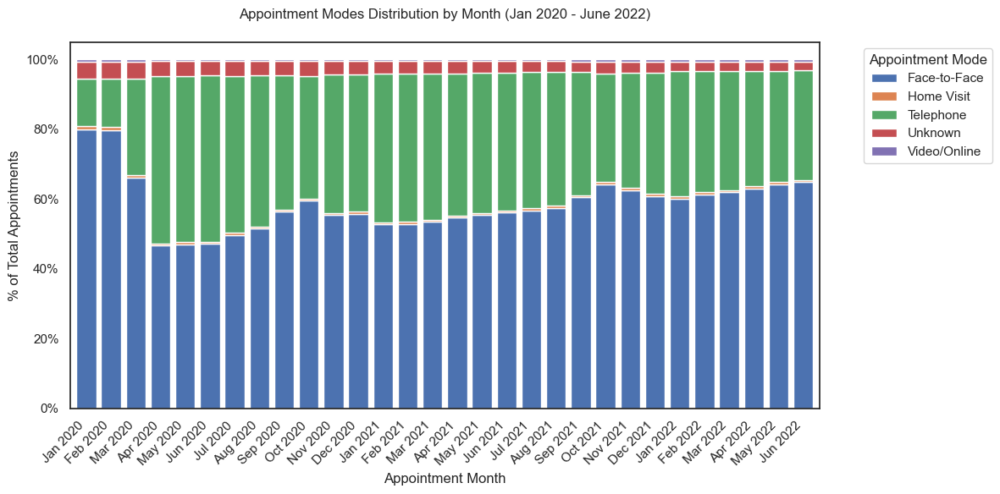

In [118]:
ar_appt_mode['appointment_month'] = pd.to_datetime(ar_appt_mode['appointment_month'])

# Pivot the data.
ar_appt_mode_pivot = ar_appt_mode.pivot_table(index='appointment_month', 
                                             columns='appointment_mode', 
                                             values='% of total', 
                                             aggfunc='sum')

# Normalize the data.
ar_appt_mode_pivot = ar_appt_mode_pivot.div(ar_appt_mode_pivot.sum(axis=1), axis=0) * 100

fig, ax = plt.subplots(figsize=(12, 6))

# Plot stacked bar chart.
ar_appt_mode_pivot.plot(kind='bar', stacked=True, ax=ax, width=0.8)
plt.title('Appointment Modes Distribution by Month (Jan 2020 - June 2022)', pad=20)
plt.xlabel('Appointment Month')
plt.ylabel('% of Total Appointments')

# Convert index to datetime.
ax.set_xticklabels([d.strftime('%b %Y') for d in ar_appt_mode_pivot.index])

plt.setp(ax.get_xticklabels(), rotation=45, ha='right')

# Add % to y-axis.
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0f}%'.format(y)))

plt.legend(title='Appointment Mode', bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()

#plt.savefig('Appointment Modes Distribution by Month (Jan 2020 - June 2022)', dpi=300, bbox_inches='tight')

plt.show()

Explanatory visualisation pertinent to further analysis below.

Around March 2020 (1st Covid-19 lockdown), there was a significant increase in telephone appointment, with an even sharper decline in face-to-face appointments from Mar 2020. Telephone appointments remained high (up until around March 2022). Face-to-face appoitments still below pre-lockdown levels as at June 2022.

A possible explanation in relation to the rise, decline and stabilisation of telephone appointments:
https://pmc.ncbi.nlm.nih.gov/articles/PMC10884712/

## 8.5 Are there any trends in time between booking an appointment?

In [119]:
ar_time = ar.groupby(['appointment_month', 'time_between_book_and_appointment']) \
                    ['count_of_appointments'].sum().reset_index()

ar_time.head()

,appointment_month,time_between_book_and_appointment,count_of_appointments
0,2020-01-01,1 Day,1943930
1,2020-01-01,15 to 21 Days,1881243
2,2020-01-01,2 to 7 Days,5603681
3,2020-01-01,22 to 28 Days,1312643
4,2020-01-01,8 to 14 Days,3444019


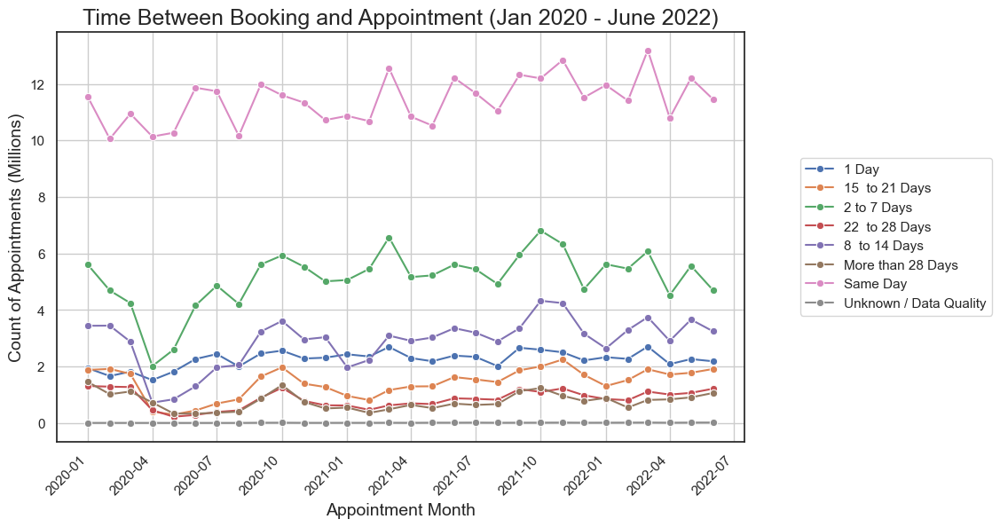

In [120]:
# Create a line plot to answer the question are there any trends in TBBA?

plt.figure(figsize=(10, 6))

# Create line plot.
sns.lineplot(data=ar_time, x='appointment_month', y='count_of_appointments', \
             hue='time_between_book_and_appointment', marker='o', errorbar=None)

plt.xlabel('Appointment Month', fontsize=14)
plt.ylabel('Count of Appointments (Millions)', fontsize=14)
plt.title('Time Between Booking and Appointment (Jan 2020 - June 2022)', fontsize=18)
plt.xticks(rotation=45, ha='right')
plt.grid(True)
plt.legend(loc='center right', bbox_to_anchor=(1.37, 0.5))

# Display values in millions on your axis.
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x / 1e6)))

#plt.savefig('TBBA and Number of Appointments)', dpi=300, bbox_inches='tight')

plt.show()

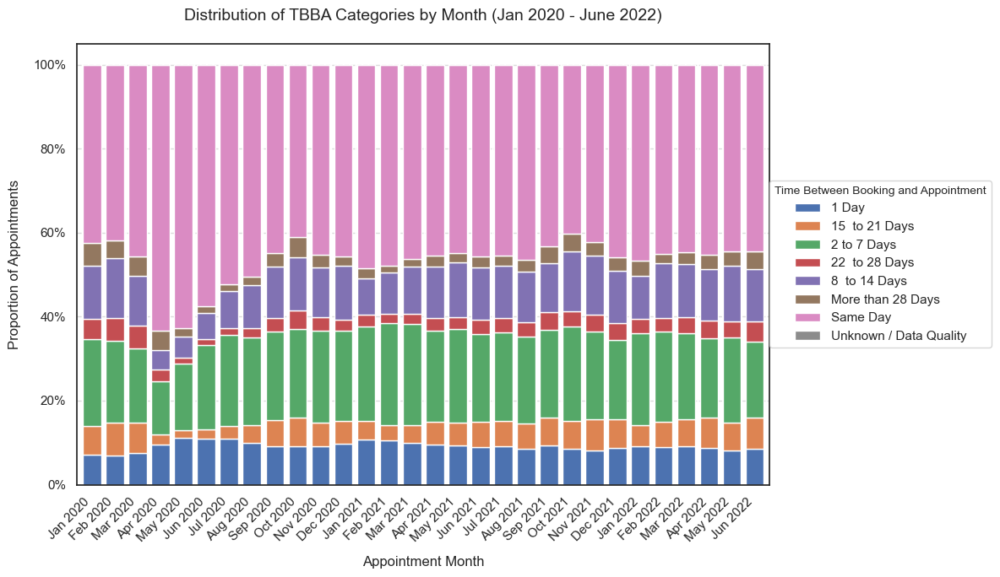

In [121]:
# Create the pivot table for stacked bar chart as alternative to lineplot.
pivot_data = ar_time.pivot_table(values='count_of_appointments', 
                                index='appointment_month', 
                                columns='time_between_book_and_appointment', 
                                aggfunc='sum')

# Normalize the data.
pivot_data = pivot_data.div(pivot_data.sum(axis=1), axis=0)

fig, ax = plt.subplots(figsize=(12, 7))
pivot_data.plot(kind='bar', stacked=True, ax=ax, width=0.8)
plt.xlabel('Appointment Month', fontsize=12, labelpad=10)
plt.ylabel('Proportion of Appointments', fontsize=12, labelpad=10)
plt.title('Distribution of TBBA Categories by Month (Jan 2020 - June 2022)', fontsize=14, pad=20)
ax.set_xticklabels([d.strftime('%b %Y') for d in pivot_data.index], rotation=45, ha='right')
ax.yaxis.set_major_formatter(FuncFormatter(lambda y, _: '{:.0%}'.format(y)))
ax.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend(title='Time Between Booking and Appointment',
          loc='center left', 
          bbox_to_anchor=(1.0, 0.5),
          borderaxespad=0,
          title_fontsize=10)

plt.tight_layout()

#plt.savefig('Distribution of TBBA Categories by Month (Jan 2020 - June 2022)', dpi=300, bbox_inches='tight')

plt.show()

Exploratory/explanatory - notice how 1 Day TBBA category is low. This was discussed above. 

## 8.6 How does the spread of service settings compare?

In [122]:
# Group by 'appointment_month' and calculate the sum of 'count_of_appointments' for each month.
# Create a new DataFrame for the visualisation.

nc_ss_appt = nc.groupby(['appointment_month', 'service_setting'])['count_of_appointments'].sum().reset_index()

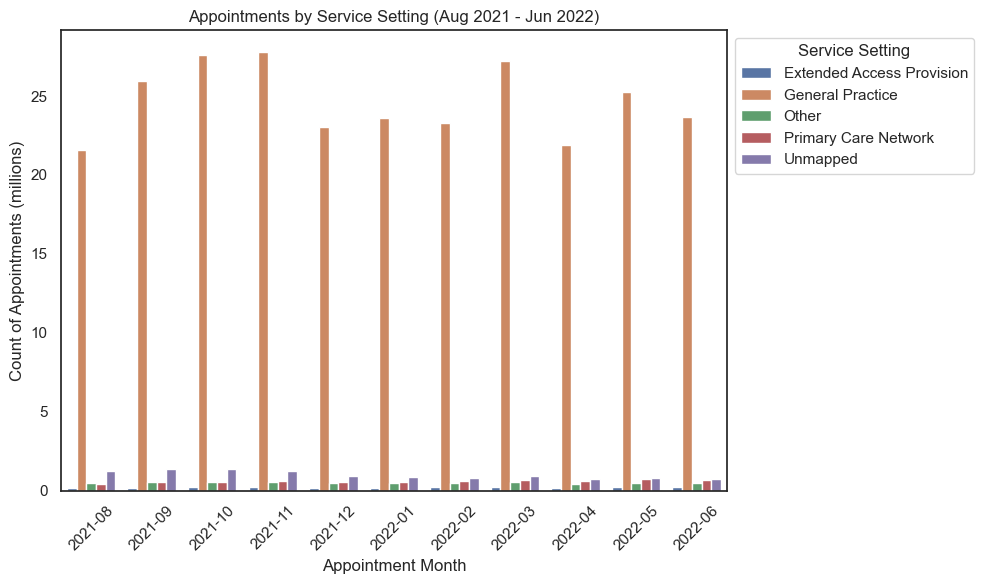

In [123]:
# Create a barplot.

plt.figure(figsize=(10, 6))
sns.barplot(data=nc_ss_appt, x='appointment_month', y='count_of_appointments', hue='service_setting')
plt.title('Appointments by Service Setting (Aug 2021 - Jun 2022)')
plt.xlabel('Appointment Month')
plt.ylabel('Count of Appointments (millions)')
plt.ticklabel_format(style='plain', axis='y')
plt.gca().yaxis.set_major_formatter(FuncFormatter(lambda x, _: '{:.0f}'.format(x / 1e6)))
plt.xticks(rotation=45)
plt.legend(title='Service Setting', loc='upper left', bbox_to_anchor=(1, 1))
plt.tight_layout()

#plt.savefig('Service Setting including General Practice)', dpi=300, bbox_inches='tight')

plt.show()

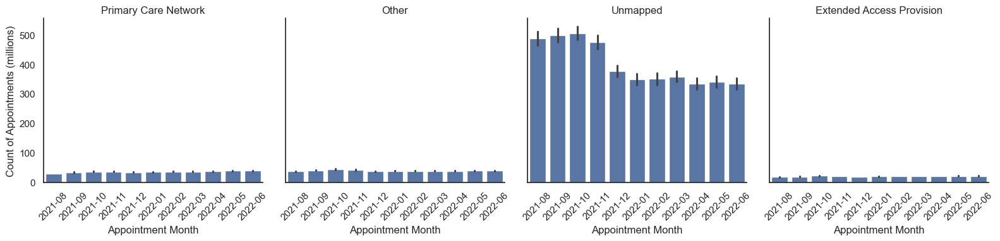

In [124]:
# Filter the DataFrame to exclude General Practice.

new_service_settings = ['Extended Access Provision', 'Primary Care Network', 'Other', 'Unmapped']
nc_ss_less_gp = nc[nc['service_setting'].isin(new_service_settings)]


# Create Facet Grid with individual plots.
g = sns.FacetGrid(nc_ss_less_gp, col='service_setting', col_wrap=4, height=4)
g.map(sns.barplot, 'appointment_month', 'count_of_appointments')
g.set_axis_labels('Appointment Month', 'Count of Appointments (millions)')
g.set_titles("{col_name}")
g.set_xticklabels(rotation=45)
plt.tight_layout()

#plt.savefig('Service Setting excluding General Practice)', dpi=300, bbox_inches='tight')

plt.show()

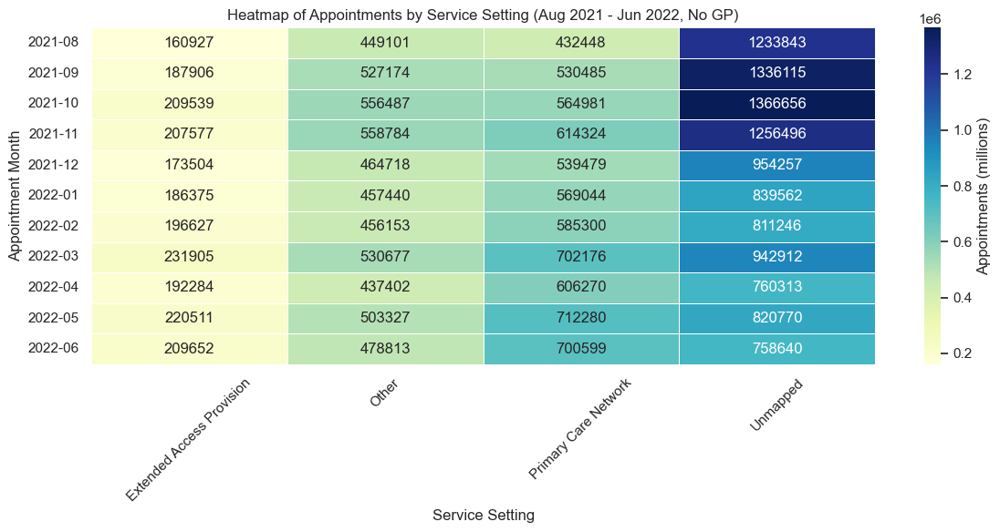

In [125]:
# Create a heatmap.
heatmap_data = nc_ss_less_gp.pivot_table(index='appointment_month', columns='service_setting', values='count_of_appointments', aggfunc='sum')

plt.figure(figsize=(12, 6))
sns.heatmap(heatmap_data, annot=True, fmt='.0f', cmap='YlGnBu', cbar_kws={'label': 'Appointments (millions)'}, linewidths=0.5)
plt.title('Heatmap of Appointments by Service Setting (Aug 2021 - Jun 2022, No GP)')
plt.xlabel('Service Setting')
plt.ylabel('Appointment Month')
plt.xticks(rotation=45)
plt.tight_layout()

#plt.savefig('Heatmap of Appointments by Service Setting (Aug 2021 - Jun 2022, No GP)', dpi=300, bbox_inches='tight')
plt.show()

This is a key explanatory visualisation and is an important part of subsequent analysis.

It is worth understanding why EA provision is and remains so low!

The whole idea behind EA provision is to improve access and capacity. 

It is alarming to see that it is and remains low. 

Note that the Extended Access Provision is now called the Enhanced Access Provision and forms part of the Network DES.
In other words, it is delivered at PCN level.

https://www.england.nhs.uk/gp/investment/gp-contract/network-contract-directed-enhanced-service-des/enhanced-access-faqs/

For the purpose of this analysis, the format and income streams for past and future iteration of the EA service are comparable.

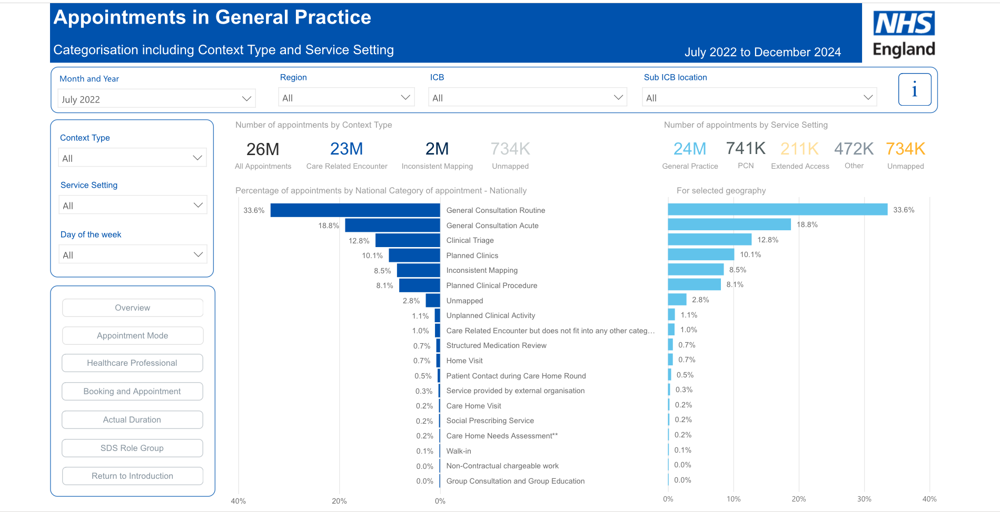

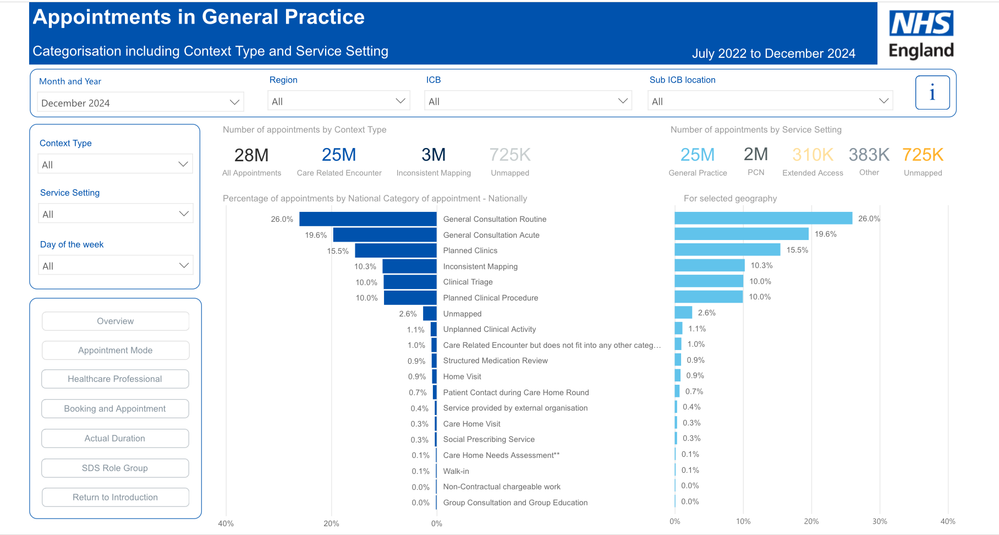

# 9. Further ICB-level Analysis 

As was discussed previously, this section will further investigate the issues around capacity, utilisation, staffing and link the merits of Twitter (X), but this will be restricted at an ICB-level only. 

All visualisations generated below are explanatory in nature.

## 9.1 Number of Registered Patients at GP Practices in England Jan 2020 - Jul 2022.

Registered Patient List Size for Jan 2020 - Jul 2022 compiled into a csv from:
https://digital.nhs.uk/data-and-information/publications/statistical/patients-registered-at-a-gp-practice

Whilst utilisation has been seen as 'demand' and capacity as 'supply', an examination trend in patient list size will provide a good benchmark for future capacity planning.

As well asg growth trend, seasonable patterns will also be identfied to enhance the analysis.

Percentage Growth over 31-month period: 2.3954%


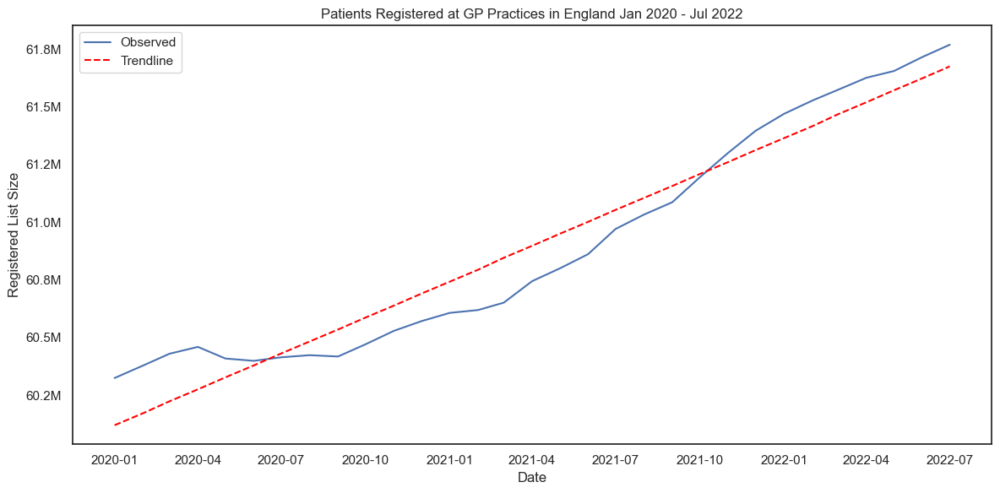

In [126]:
# Read 'reg_list_size.csv'.

reg_list_size = pd.read_csv('reg_list_size.csv')

# Ensure 'date' column is in datetime format.
reg_list_size['date'] = pd.to_datetime(reg_list_size['date'])


reg_list_size = reg_list_size.sort_values('date')

# Specify registered list sizes at start and end of period.
list_jan_2020 = 60323942
list_jul_2022 = 61768942

# Calculate percentage growth from January 2020 to July 2022.
registered_jan20_jul22 = (((list_jul_2022 - list_jan_2020) / list_jan_2020) * 100)

print(f"Percentage Growth over 31-month period: {registered_jan20_jul22:.4f}%")

generate_time_series_plot_with_trendline(reg_list_size, time_col='date', value_col='registered_list_size', \
                                         title="Patients Registered at GP Practices in England Jan 2020 - Jul 2022")

Key explanatory visualisation which is self-explanatory. Capacity will need to be increased to meet the needs of a growing population.

There was a period of time during the pandemic where patient registrations was declined and subsequent rate of increase was lower than normal (pre-pandemic) (mortality rate from Covid-19 probably contribute to this).

However, patient list size appears to be growing steadily from Oct 2021 onwards.

- Growth over 31-month period = 2.3954%
- Monthly growth rate: 0.0765% (r = (1 + 0.023954)^(1/31) - 1)
- 6-month period growth rate: 0.461% (r = (1 + 0.023954)^(6/31) - 1)

In [127]:
reg_list_size.head()

,date,registered_list_size
0,2020-01-01,60323942
1,2020-02-01,60377858
2,2020-03-01,60429301
3,2020-04-01,60458907
4,2020-05-01,60408501


In [128]:
reg_list_size.dtypes

date                    datetime64[ns]
registered_list_size             int64
dtype: object

## 9.2 Simple Moving Average Registered Patient List Size Jan 2020 - June 2022 (3 Month SMA)

In [129]:
# Set 'date' as the index.
reg_list_size.set_index('date', inplace=True)

In [130]:
# Resample reg_list to monthly frequency and sum of registered list size.
reg_list_month = reg_list_size['registered_list_size'].resample('M').sum()

In [131]:
# Calculate 3 month SMA.
sma = reg_list_month.rolling(window=3).mean()

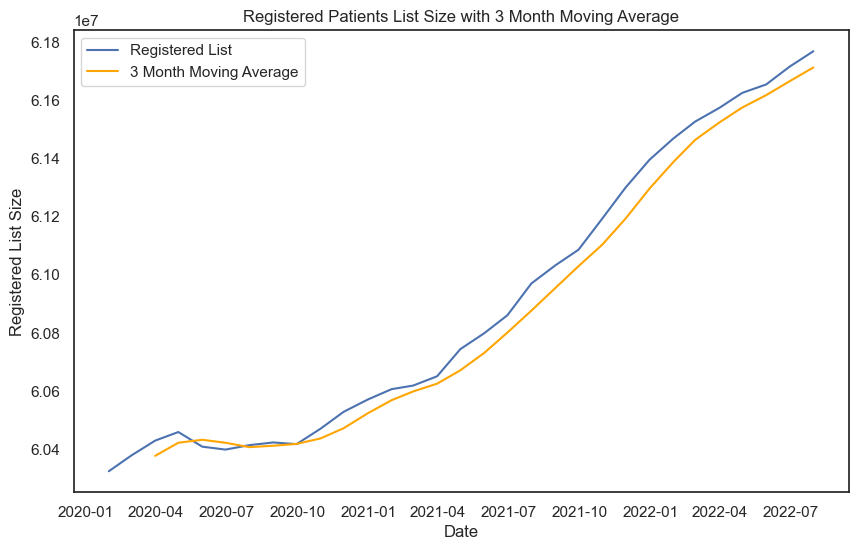

In [132]:
# Plot 3 Month SMA for Registered List Size.
plt.figure(figsize=(10,6))
plt.plot(reg_list_month, label='Registered List')
plt.plot(sma, label='3 Month Moving Average', color='orange')
plt.title('Registered Patients List Size with 3 Month Moving Average')
plt.xlabel('Date')
plt.ylabel('Registered List Size')
plt.legend()

#plt.savefig('Registered Patients List Size with 3 Month Moving Average', dpi=300, bbox_inches='tight')

plt.show()

Key explanatory visualisation, the smoothing of the line with a 3 Month SMA shows the dip during the pandemic and the initial slow and subsequent fast increase in registered list size. Trend is more discernible. 

## 9.3 Seasonal Decomposition using Additive Model

In [133]:
decomposition = seasonal_decompose(reg_list_month, model='additive', period=12)  # 12 for yearly pattern

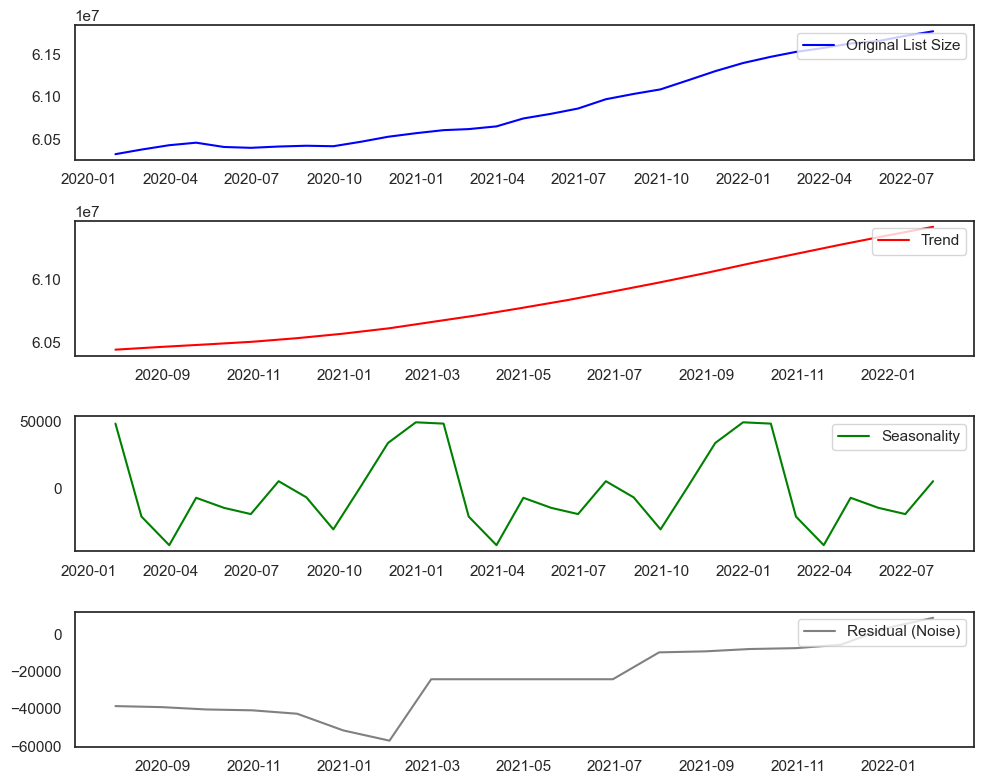

In [134]:
# Create subplots
fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(10, 8))

# Plot Original Data
ax1.plot(reg_list_month, label='Original List Size', color='blue')
ax1.legend(loc='upper right')

# Plot Trend
ax2.plot(decomposition.trend, label='Trend', color='red')
ax2.legend(loc='upper right')

# Plot Seasonality
ax3.plot(decomposition.seasonal, label='Seasonality', color='green')
ax3.legend(loc='upper right')

# Plot Residual (Noise)
ax4.plot(decomposition.resid, label='Residual (Noise)', color='gray')
ax4.legend(loc='upper right')

# Adjust layout for better spacing
plt.tight_layout()

#plt.savefig('Seasonal Decomposition of Registered List Size', dpi=300, bbox_inches='tight')

# Show the plots
plt.show()

Explanatory visualisation.

The above seasonal decomposition depics an evident seasonal pattern where there is an increase in patient list size during the winter months and post festive period. This may be driven by more people requiring care in general practice settings.

Anothe reason may be that gp practices rush to meet their Quality and Outcomes Framework (QOF targets) and PCN-level targets in terms of activity ahead of the financial year end. 

### 9.3.1 Why was ARIMA model not performed?

Stationarity: ARIMA models require the data to be stationary, meaning that statistical properties like the mean, variance, and autocorrelation are constant over time. If the patient list size exhibits trends or seasonality, this may need to first be transformed to make it stationary (e.g., through differencing or taking logs). 

## 9.4 The Index of Multiple Deprivation (IMD) Mean Score & Standard Deviation per ICB

In this section, another layer/element is added to the analysis with the inclusion of the IMD Mean Score.

In other words, how can deprivation levels at ICB level inform the analysis in terms of resource deployment and allocation e.g. how to maximise efficiency, increase patient health outcomes and experience and reduce waste (such as DNA appointments or staffing types allocation where unnecessary).

In [135]:
# Read 'imd_score.csv'.

imd_score = pd.read_csv('imd_score.csv')
validate_data(imd_score)


First 5 rows of DataFrame:


,icb_ons_code,icb_name,icb_mean_imd,icb_std_dev_imd
0,E54000040,"Bath and North East Somerset, Swindon and Wiltshire ICB",14.39,10.14
1,E54000024,"Bedfordshire, Luton and Milton Keynes ICB",17.95,11.75
2,E54000055,Birmingham and Solihull ICB,34.17,18.42
3,E54000062,Black Country ICB,29.88,15.27
4,E54000039,"Bristol, North Somerset and South Gloucestershire ICB",19.47,15.34



Last 5 rows of Dataframe:


,icb_ons_code,icb_name,icb_mean_imd,icb_std_dev_imd
37,E54000010,Staffordshire and Stoke-On-Trent ICB,20.70,14.28
38,E54000023,Suffolk and North East Essex ICB,19.24,12.62
39,E54000052,Surrey Heartlands ICB,10.29,6.81
40,E54000053,Sussex ICB,17.27,11.83
41,E54000054,West Yorkshire ICB,27.93,17.84



Shape of DataFrame:
(42, 4)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42 entries, 0 to 41
Data columns (total 4 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   icb_ons_code     42 non-null     object 
 1   icb_name         42 non-null     object 
 2   icb_mean_imd     42 non-null     float64
 3   icb_std_dev_imd  42 non-null     float64
dtypes: float64(2), object(2)
memory usage: 1.4+ KB

Number of nulls per column:
icb_ons_code       0
icb_name           0
icb_mean_imd       0
icb_std_dev_imd    0
dtype: int64

Unique values per column:
icb_ons_code       42
icb_name           42
icb_mean_imd       42
icb_std_dev_imd    41
dtype: int64

Number of duplicate rows:
0

Summary statistics:
       icb_mean_imd  icb_std_dev_imd
count         42.00            42.00
mean          20.52            13.06
std            5.32             3.28
min           10.29             6.81
25%           17.27            10.5

**The mean IMD score.**

Ministry of Housing, Communities & Local Government, English indices of deprivation 2019. (www.gov.uk/government/statistics/english-indices-of-deprivation-2019)

**To understand how much variation in deprivation there is within each ICB. A low standard deviation means that the IMD scores in an ICB are all fairly close to the mean, whereas a high standard deviation means that the IMD scores are spread out.**

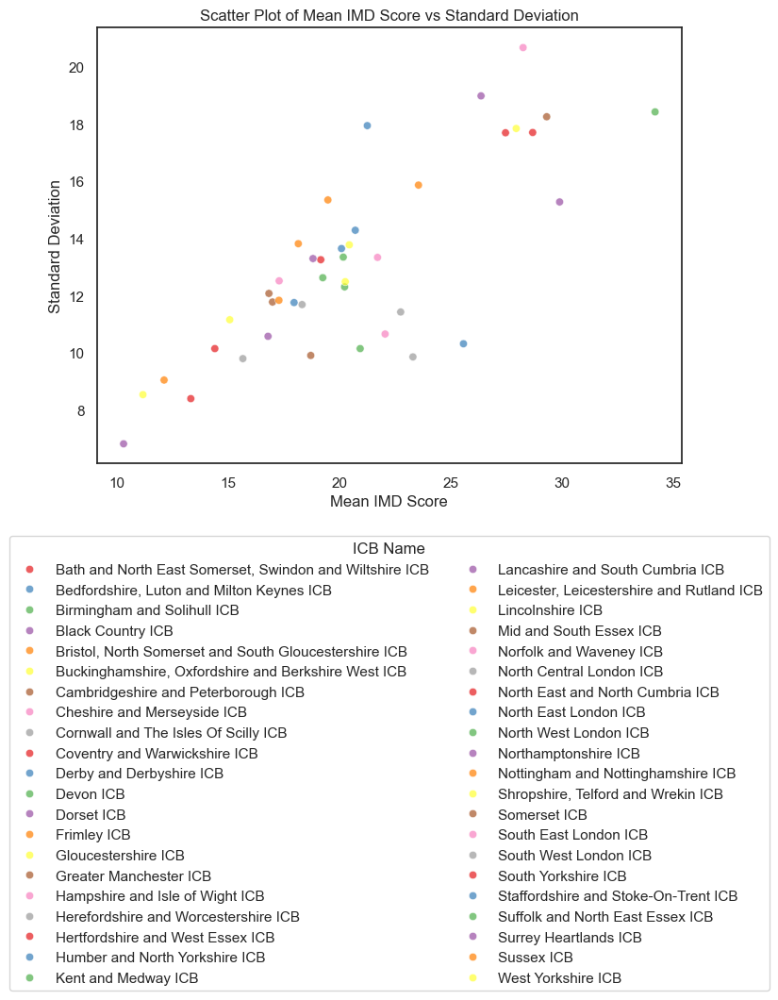

In [136]:
# Create the scatter plot to visualise mean IMD score and standard deviation.

plt.figure(figsize=(8, 6))
sns.scatterplot(x=imd_score['icb_mean_imd'], y=imd_score['icb_std_dev_imd'], hue=imd_score['icb_name'], palette='Set1', alpha=0.7)
plt.title('Scatter Plot of Mean IMD Score vs Standard Deviation')
plt.xlabel('Mean IMD Score')
plt.ylabel('Standard Deviation')
plt.legend(title='ICB Name', bbox_to_anchor=(0.5, -0.15), loc='upper center', ncol=2) 
plt.tight_layout() 

#plt.savefig('Scatter Plot of Mean IMD Score vs Standard Deviation', dpi=300, bbox_inches='tight')

plt.show()

Key explanatory visualisation. This essentially shows that ICBs with a lower mean IMD score have lower variation in deprivation levels than those with higher deprivation levels (higher IMD score). 

ICBs with high IMD score therefore have affluent areas and ICBs with low IMD score tend to generally have only affluent areas.

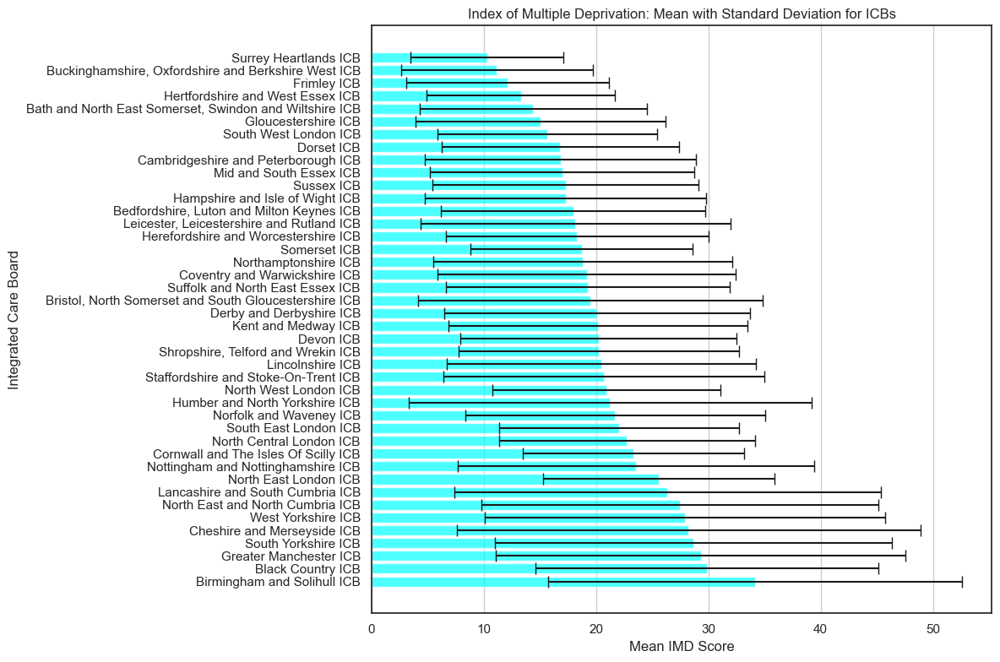

In [137]:
# Sort the DataFrame by 'icb_mean_imd' from highest to lowest.
imd_score_sorted = imd_score.sort_values(by='icb_mean_imd', ascending=False).reset_index(drop=True)    

icb_imd = imd_score_sorted['icb_name']  
mean_imd = imd_score_sorted['icb_mean_imd']  
std_imd = imd_score_sorted['icb_std_dev_imd'] 

plt.figure(figsize=(12, 8))
plt.barh(icb_imd, mean_imd, xerr=std_imd, capsize=5, color='cyan', alpha=0.7, label='Mean IMD Score')
plt.title('Index of Multiple Deprivation: Mean with Standard Deviation for ICBs')
plt.xlabel('Mean IMD Score')
plt.ylabel('Integrated Care Board')
plt.grid(True, axis='x')

plt.tight_layout()  

#plt.savefig('Index of Multiple Deprivation: Mean with Standard Deviation for ICBs', dpi=300, bbox_inches='tight')

plt.show()

A key visualisation ordered to show ICBs with higher levels of deprivation at the bottom.

The IMD is a measure of relative deprivation* in England, produced by the Ministry of Housing, Communities and Local Government (MHCLG). The index was last update in 2019, and the next release is expected to be in late 2025. It is a composite measure that takes into account 39 indicators across seven weighted domains of deprivation:

Income (22.5%)
Employment (22.5%)
Health Deprivation and Disability (13.5%)
Education, Skills, and Training (13.5%)
Crime (9.3%)
Barriers to Housing and Services (9.3%)
Living Environment (9.3%)

- https://www.heec.co.uk/resource/understanding-the-index-of-multiple-deprivation-imd-in-public-health-research/
- https://www.health.org.uk/reports-and-analysis/briefings/integrated-care-systems-what-do-they-look-like

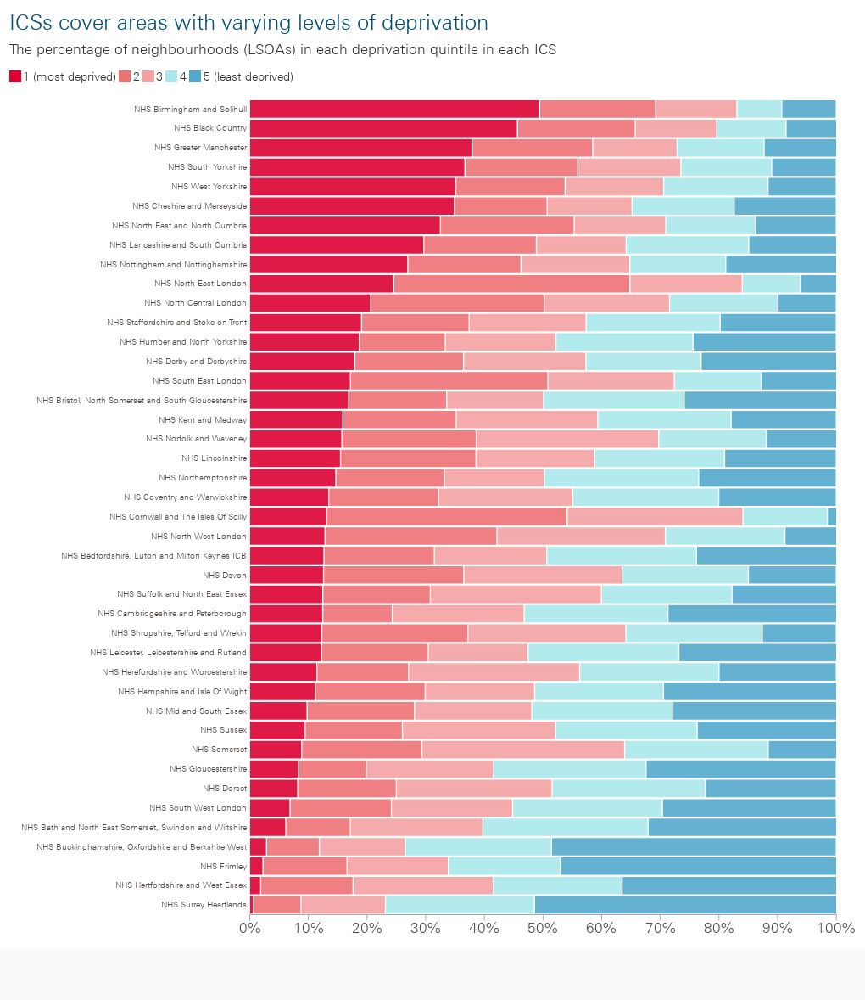

Source: Ministry of Housing, Communities & Local Government, English indices of deprivation 2019

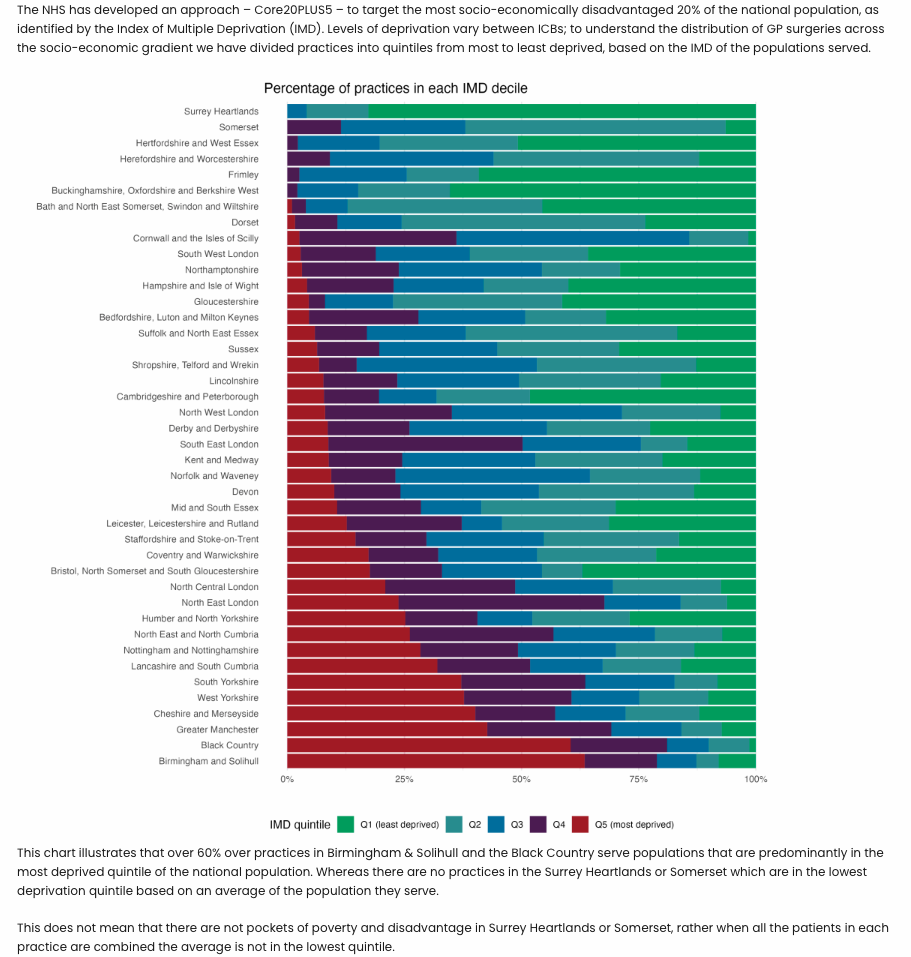

Source: https://www.heec.co.uk/component-library/data/

## 9.5 Is there a relationship between ICBs DNA level and IMD score?

This section is an attempt to tackle the increasing DNA levels along the dimension of deprivation.

In [138]:
# Create a new DataFrame with only selected columns.
icb_dna = dna_appointments[['icb_ons_code', 'icb_name', 'count_of_appointments']]  

# Group by 'icb_ons_code' and 'icb_name' and calculate the sum of 'count_of_appointments'
dna_imd_icb = icb_dna.groupby(['icb_ons_code', 'icb_name'])[['count_of_appointments']]\
                     .sum()\
                     .sort_values('count_of_appointments', ascending=False)\
                     .reset_index()\
                     .rename(columns={'icb_name': 'Integrated Care Board', 
                                      'count_of_appointments': 'Total DNA Appointments'})

dna_imd_icb.head(10)

,icb_ons_code,Integrated Care Board,Total DNA Appointments
0,E54000057,Greater Manchester ICB,1928168
1,E54000050,North East and North Cumbria ICB,1668009
2,E54000008,Cheshire and Merseyside ICB,1648264
3,E54000029,North East London ICB,1317005
4,E54000027,North West London ICB,1286262
5,E54000054,West Yorkshire ICB,1154103
6,E54000030,South East London ICB,1107753
7,E54000062,Black Country ICB,1023176
8,E54000032,Kent and Medway ICB,1015035
9,E54000048,Lancashire and South Cumbria ICB,953409


In [139]:
# left merge dna_imd_icb with imd_score.

icb_dna_imd = pd.merge(dna_imd_icb, imd_score, \
                     how='left', \
                     on='icb_ons_code')

icb_dna_imd.head()

,icb_ons_code,Integrated Care Board,Total DNA Appointments,icb_name,icb_mean_imd,icb_std_dev_imd
0,E54000057,Greater Manchester ICB,1928168,Greater Manchester ICB,29.30,18.25
1,E54000050,North East and North Cumbria ICB,1668009,North East and North Cumbria ICB,27.45,17.69
2,E54000008,Cheshire and Merseyside ICB,1648264,Cheshire and Merseyside ICB,28.24,20.67
3,E54000029,North East London ICB,1317005,North East London ICB,25.56,10.31
4,E54000027,North West London ICB,1286262,North West London ICB,20.92,10.14


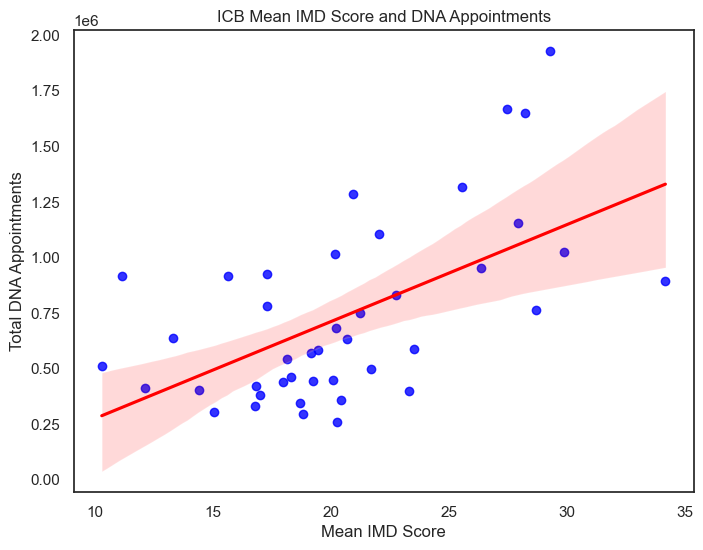

In [140]:
# Create a scatter plot with a regression line 
# to answer  Is there a relationship between ICBs DNA level and IMD score?

plt.figure(figsize=(8, 6))
sns.regplot(x='icb_mean_imd', y='Total DNA Appointments',\
            data=icb_dna_imd, scatter_kws={'color':'blue'}, line_kws={'color':'red'})

plt.title('ICB Mean IMD Score and DNA Appointments')
plt.xlabel('Mean IMD Score')
plt.ylabel('Total DNA Appointments')

#plt.savefig('ICB Mean IMD Score and DNA Appointments', dpi=300, bbox_inches='tight')

plt.show()

A key visualisation.

There is a relationship (positive correlation) between Mean IMD Score (Index of Multiple Deprivation) and Total (Did not Attend) DNA Appointments - as the deprivation score increases, the number of missed appointments tends to increase as well.

Higher Mean IMD scores indicate higher levels of deprivation.

The red line represents the trend line or line of best fit, with the pink shaded area showing the confidence interval around this trend.
There is considerable scatter in the data points (blue dots), suggesting that while there is a correlation, other factors also influence appointment attendance rates.

From an NHS policy perspective, addressing this relationship between deprivation and missed appointments requires a multi-faceted approach that considers both structural barriers and practical solutions:

**Appointment Accessibility**
- Offer extended and flexible appointment hours to accommodate working schedules
- Provide evening and weekend appointments
- Implement remote consultations where appropriate
- Allow for same-day or short-notice appointments


**Healthcare System Adaptations**
- Co-locate multiple services to reduce travel burden. sub-ICBs can instruct Primary Care Networks accordingly.
- PCNs to use Additional Roles Reimbursement Scheme to employ care coordinator roles.


**Data-Driven Approaches**
- This is where Twitter (X) comes in. See above analysis.

The key is to recognize that missed appointments are often a symptom of broader systemic issues rather than simple forgetfulness or lack of responsibility. Policy solutions should address underlying barriers while maintaining dignity and respect for patients.


## 9.6 For the five ICBs with the highest IMD Mean Scores (with highest deprivation levels):

### 9.6.1 Which appointment modes has more DNA appointments?

In [141]:
# Select rows for relevant icb_ons_codes of the five ICBs with highest IMD mean scores.
selected_highest_imd_top_5 = dna_appointments[dna_appointments['icb_ons_code']\
.isin(['E54000055', 'E54000062', 'E54000057', 'E54000061', 'E54000008'])]

validate_data(selected_highest_imd_top_5)


First 5 rows of DataFrame:


,icb_ons_code,icb_name,region_name,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments,month_year
24388,E54000062,Black Country ICB,Midlands,2020-01-01,DNA,GP,Face-to-Face,1 Day,1332,2020-01
24389,E54000062,Black Country ICB,Midlands,2020-01-01,DNA,GP,Face-to-Face,15 to 21 Days,1434,2020-01
24390,E54000062,Black Country ICB,Midlands,2020-01-01,DNA,GP,Face-to-Face,2 to 7 Days,4637,2020-01
24391,E54000062,Black Country ICB,Midlands,2020-01-01,DNA,GP,Face-to-Face,22 to 28 Days,807,2020-01
24392,E54000062,Black Country ICB,Midlands,2020-01-01,DNA,GP,Face-to-Face,8 to 14 Days,3087,2020-01



Last 5 rows of Dataframe:


,icb_ons_code,icb_name,region_name,appointment_month,appointment_status,hcp_type,appointment_mode,time_between_book_and_appointment,count_of_appointments,month_year
140112,E54000008,Cheshire and Merseyside ICB,North West,2022-06-01,DNA,Unknown,Telephone,15 to 21 Days,10,2022-06
140113,E54000008,Cheshire and Merseyside ICB,North West,2022-06-01,DNA,Unknown,Telephone,2 to 7 Days,113,2022-06
140114,E54000008,Cheshire and Merseyside ICB,North West,2022-06-01,DNA,Unknown,Telephone,22 to 28 Days,11,2022-06
140115,E54000008,Cheshire and Merseyside ICB,North West,2022-06-01,DNA,Unknown,Telephone,8 to 14 Days,44,2022-06
140116,E54000008,Cheshire and Merseyside ICB,North West,2022-06-01,DNA,Unknown,Telephone,Same Day,268,2022-06



Shape of DataFrame:
(35937, 10)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
Index: 35937 entries, 24388 to 140116
Data columns (total 10 columns):
 #   Column                             Non-Null Count  Dtype         
---  ------                             --------------  -----         
 0   icb_ons_code                       35937 non-null  object        
 1   icb_name                           35937 non-null  object        
 2   region_name                        35937 non-null  object        
 3   appointment_month                  35937 non-null  datetime64[ns]
 4   appointment_status                 35937 non-null  object        
 5   hcp_type                           35937 non-null  object        
 6   appointment_mode                   35937 non-null  object        
 7   time_between_book_and_appointment  35937 non-null  object        
 8   count_of_appointments              35937 non-null  int64         
 9   month_year                         35937 non-null  obje

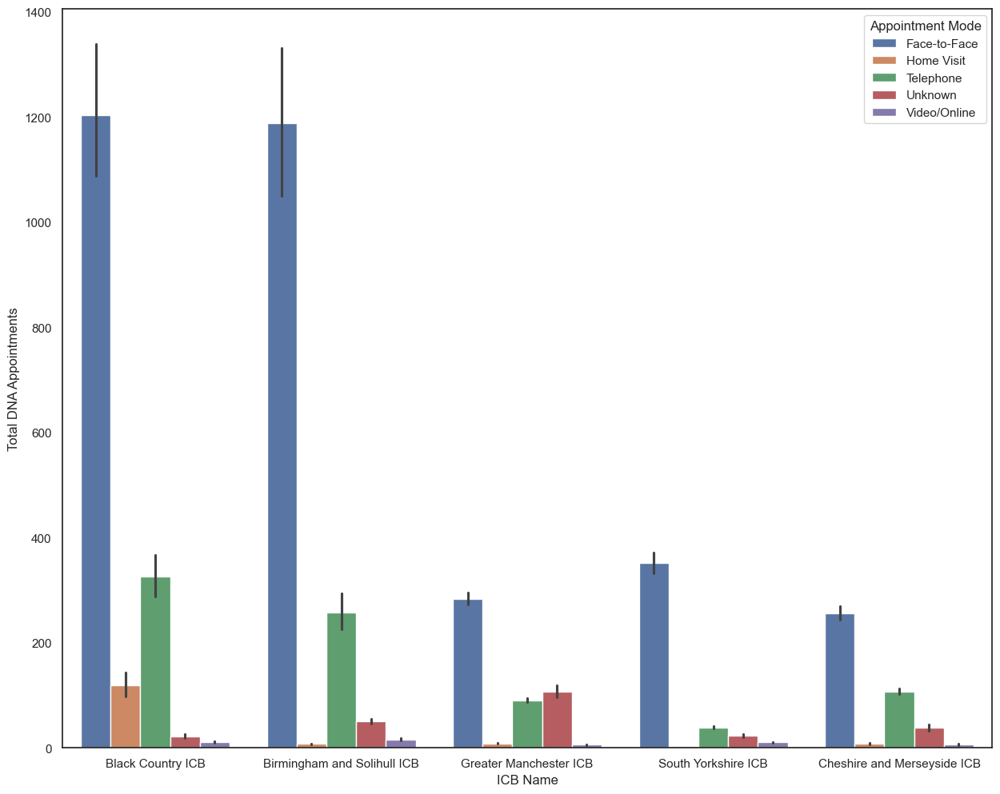

In [142]:
# Create barplot.
sns.barplot(x="icb_name", y="count_of_appointments", hue="appointment_mode", data=selected_highest_imd_top_5)
plt.xlabel('ICB Name') 
plt.ylabel('Total DNA Appointments')  
plt.legend(title='Appointment Mode')

#plt.savefig('Appointment Modes & DNA appointments - 5 ICBs Highest IMD', dpi=300, bbox_inches='tight')

plt.show()

Key explanatory visualisation.

For the ICBs with a higher IMD score, telephone appointments appeat to offer an element of convenience. 

Perhaps, childcare issues, mobility or employment inhibit patiens ability to attend in person. 

Where adequate care may be delivere over the phone, this may be a more efficient configuration/utilisation of resources.

https://pmc.ncbi.nlm.nih.gov/articles/PMC10884712/

In [143]:
imd_score_sorted.head()

,icb_ons_code,icb_name,icb_mean_imd,icb_std_dev_imd
0,E54000055,Birmingham and Solihull ICB,34.17,18.42
1,E54000062,Black Country ICB,29.88,15.27
2,E54000057,Greater Manchester ICB,29.30,18.25
3,E54000061,South Yorkshire ICB,28.67,17.70
4,E54000008,Cheshire and Merseyside ICB,28.24,20.67


### 9.6.2 Which time_between_book_and_appointment timeframes has more DNA appointments?

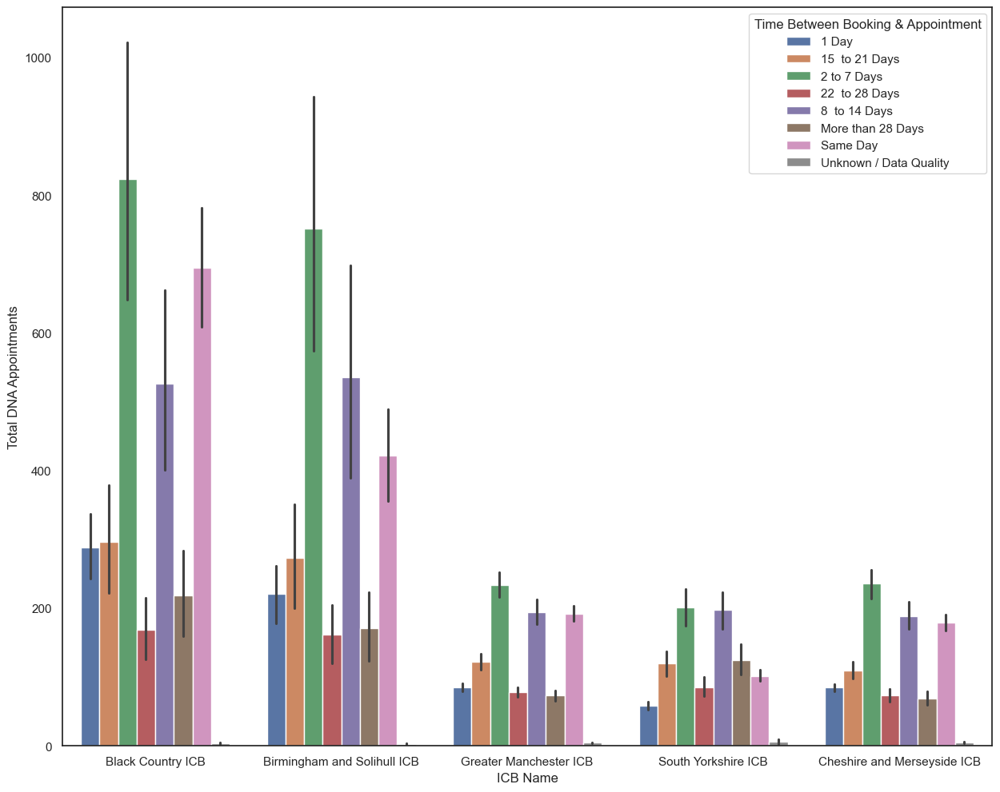

In [144]:
# Create barplot.
sns.barplot(x="icb_name", y="count_of_appointments", \
            hue="time_between_book_and_appointment", data=selected_highest_imd_top_5)

plt.xlabel('ICB Name')  
plt.ylabel('Total DNA Appointments')  
plt.legend(title='Time Between Booking & Appointment')

#plt.savefig('TBBA with more DNA appointments - 5 ICBs Highest IMD', dpi=300, bbox_inches='tight')

plt.show()

For the 5 ICBs with the highest IMD score, 1 Day TBBA allocation appears to be optimal.
Again, perhaps the short notice of same day appointments, makes it impractical for patients to attend, for the reasons discussed above. 
Reasons may be personal/individual or structural.

In [145]:
imd_score_sorted.head()

,icb_ons_code,icb_name,icb_mean_imd,icb_std_dev_imd
0,E54000055,Birmingham and Solihull ICB,34.17,18.42
1,E54000062,Black Country ICB,29.88,15.27
2,E54000057,Greater Manchester ICB,29.30,18.25
3,E54000061,South Yorkshire ICB,28.67,17.70
4,E54000008,Cheshire and Merseyside ICB,28.24,20.67


## 9.7 For the five ICBs with the lowest IMD Mean Scores (with lowest deprivation levels):

### 9.7.1 Which time_between_book_and_appointment timeframes has more DNA appointments?

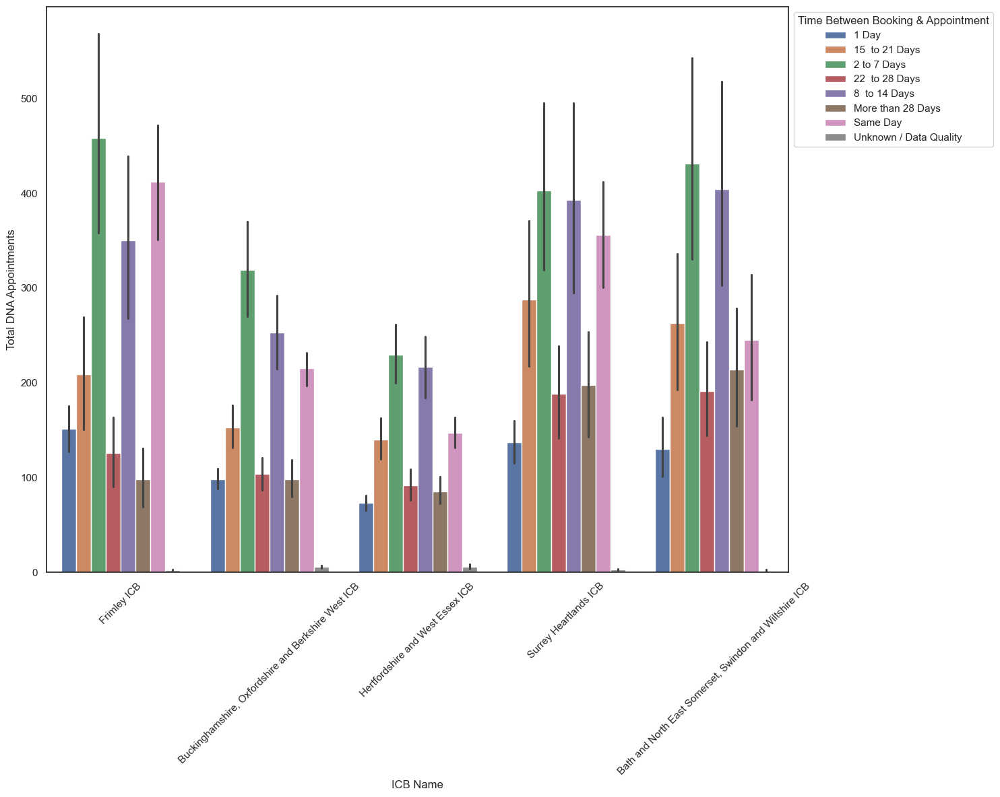

In [146]:
# Select rows for relevant icb_ons_codes of the five ICBs with lowest IMD mean scores.
selected_lowest_imd_top_5 = dna_appointments[dna_appointments['icb_ons_code']\
.isin(['E54000052', 'E54000044', 'E54000034', 'E54000025', 'E54000040'])]

# Create barplot.
sns.barplot(
    x="icb_name", 
    y="count_of_appointments", 
    hue="time_between_book_and_appointment", 
    data=selected_lowest_imd_top_5
)

plt.xlabel('ICB Name')  
plt.ylabel('Total DNA Appointments')  
plt.legend(title='Time Between Booking & Appointment', bbox_to_anchor=(1, 1), loc='upper left')
plt.xticks(rotation=45)


#plt.savefig('TBBA with more DNA appointments - 5 ICBs Lowest IMD', dpi=300, bbox_inches='tight')

plt.tight_layout() 

The pattern appears to be the same for the 5 most affluent ICBs. 

Crucially however, a comparably and significantly lower level of DNA appointments overall.

In [147]:
imd_score_sorted.tail()

,icb_ons_code,icb_name,icb_mean_imd,icb_std_dev_imd
37,E54000040,"Bath and North East Somerset, Swindon and Wiltshire ICB",14.39,10.14
38,E54000025,Hertfordshire and West Essex ICB,13.31,8.39
39,E54000034,Frimley ICB,12.11,9.04
40,E54000044,"Buckinghamshire, Oxfordshire and Berkshire West ICB",11.16,8.53
41,E54000052,Surrey Heartlands ICB,10.29,6.81


In [148]:
tbba_imd_top5 = selected_highest_imd_top_5.groupby('time_between_book_and_appointment')[['count_of_appointments']].sum()\
                        .sort_values('count_of_appointments', ascending=False)\
                        .reset_index()\

total_dna_appt_top5_imd = tbba_imd_top5['count_of_appointments'].sum()
print(f'Total DNA Appointments for ICBs with Highest Level of Deprivation= {total_dna_appt_top5_imd}')
tbba_imd_top5

Total DNA Appointments for ICBs with Highest Level of Deprivation= 6258895


,time_between_book_and_appointment,count_of_appointments
0,2 to 7 Days,1755310
1,Same Day,1352821
2,8 to 14 Days,1213962
3,15 to 21 Days,622859
4,1 Day,564906
5,More than 28 Days,375101
6,22 to 28 Days,370498
7,Unknown / Data Quality,3438


In [149]:
tbba_imd_low5 = selected_lowest_imd_top_5.groupby('time_between_book_and_appointment')[['count_of_appointments']].sum()\
                        .sort_values('count_of_appointments', ascending=False)\
                        .reset_index()

total_dna_appt_low5_imd = tbba_imd_low5['count_of_appointments'].sum()
print(f'Total DNA Appointments for ICBs with Highest Level of Deprivation= {total_dna_appt_low5_imd}')
tbba_imd_low5

Total DNA Appointments for ICBs with Highest Level of Deprivation= 2881787


,time_between_book_and_appointment,count_of_appointments
0,2 to 7 Days,787147
1,Same Day,622141
2,8 to 14 Days,560069
3,15 to 21 Days,311766
4,1 Day,232282
5,22 to 28 Days,190390
6,More than 28 Days,176336
7,Unknown / Data Quality,1656


## 9.8 Case for expanding Capacity in the NHS v Case for more efficient use of capacity - using June 2022 data from nc only

Integrated care boards (ICBs) replaced clinical commissioning groups (CCGs) in the NHS in England from 1 July 2022:

https://www.nhsbsa.nhs.uk/sicbls-icbs-and-other-providers/organisation-and-prescriber-changes/icbs#:~:text=ICB%20restructure%20July%202022,prescriptioninformation@nhsbsa.nhs.uk

A way was identified to convert CCG codes into ICB codes and in turn compile the information in relation to registered patient list sizes and workforce data for periods prior to June 2022:

https://www.sbs.nhs.uk/supplier-information/ccg-icb-list/.

However, owing to time constraints, a decision was made to only focus on June 2022 appointments as the related list size (01.07.2022) and workforce data (30.06.2022) was readily available for easy merging and speedy analysis.

This takes into account the analysis undertaken so far and attempts to validate the trends, patterns and insights identified above towards answering the business questions.

### 9.8.1 Appointment Utilisation per ICB June 2022

In [150]:
nc.head()

,icb_ons_code,icb_name,region_name,sub_icb_location_name,appointment_month,appointment_date,service_setting,context_type,national_category,count_of_appointments,month_year,day_of_week
0,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,Primary Care Network,Care Related Encounter,Patient contact during Care Home Round,3,2021-08,Monday
1,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,Other,Care Related Encounter,Planned Clinics,7,2021-08,Monday
2,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,Home Visit,79,2021-08,Monday
3,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,General Consultation Acute,725,2021-08,Monday
4,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2021-08,2021-08-02,General Practice,Care Related Encounter,Structured Medication Review,2,2021-08,Monday


In [151]:
# Filter for June 2022 only

# Define the date range.
start_date = '2022-06-01'
end_date = '2022-06-30'

nc_june22 = nc[nc['appointment_date'].between(start_date, end_date)]

validate_data(nc_june22)


First 5 rows of DataFrame:


,icb_ons_code,icb_name,region_name,sub_icb_location_name,appointment_month,appointment_date,service_setting,context_type,national_category,count_of_appointments,month_year,day_of_week
6327,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2022-06,2022-06-01,Unmapped,Unmapped,Unmapped,128,2022-06,Wednesday
6328,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2022-06,2022-06-01,Primary Care Network,Inconsistent Mapping,Inconsistent Mapping,1,2022-06,Wednesday
6329,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2022-06,2022-06-01,Primary Care Network,Care Related Encounter,Structured Medication Review,10,2022-06,Wednesday
6330,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2022-06,2022-06-01,Primary Care Network,Care Related Encounter,Planned Clinics,62,2022-06,Wednesday
6331,E54000050,North East and North Cumbria ICB,North East and Yorkshire,NHS North East and North Cumbria ICB - 00L,2022-06,2022-06-01,Primary Care Network,Care Related Encounter,Social Prescribing Service,25,2022-06,Wednesday



Last 5 rows of Dataframe:


,icb_ons_code,icb_name,region_name,sub_icb_location_name,appointment_month,appointment_date,service_setting,context_type,national_category,count_of_appointments,month_year,day_of_week
817389,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,Unplanned Clinical Activity,12,2022-06,Thursday
817390,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,Planned Clinics,4,2022-06,Thursday
817391,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,Planned Clinical Procedure,92,2022-06,Thursday
817392,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,General Consultation Routine,4,2022-06,Thursday
817393,E54000054,West Yorkshire ICB,North East and Yorkshire,NHS West Yorkshire ICB - X2C4Y,2022-06,2022-06-30,Extended Access Provision,Care Related Encounter,General Consultation Acute,19,2022-06,Thursday



Shape of DataFrame:
(74168, 12)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
Index: 74168 entries, 6327 to 817393
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   icb_ons_code           74168 non-null  object        
 1   icb_name               74168 non-null  object        
 2   region_name            74168 non-null  object        
 3   sub_icb_location_name  74168 non-null  object        
 4   appointment_month      74168 non-null  object        
 5   appointment_date       74168 non-null  datetime64[ns]
 6   service_setting        74168 non-null  object        
 7   context_type           74168 non-null  object        
 8   national_category      74168 non-null  object        
 9   count_of_appointments  74168 non-null  int64         
 10  month_year             74168 non-null  object        
 11  day_of_week            74168 non-null  object        
dtypes: datetime

In [152]:
# Drop columns not relevant to analysis.
nc_june_22_final = nc_june22.drop(columns=['region_name', 'sub_icb_location_name', 'appointment_month', \
                                    'appointment_date', 'context_type', 'national_category', \
                                    'month_year', 'day_of_week'])

nc_june_22_final = nc_june_22_final.reset_index(drop=True)

nc_june_22_final

,icb_ons_code,icb_name,service_setting,count_of_appointments
0,E54000050,North East and North Cumbria ICB,Unmapped,128
1,E54000050,North East and North Cumbria ICB,Primary Care Network,1
2,E54000050,North East and North Cumbria ICB,Primary Care Network,10
3,E54000050,North East and North Cumbria ICB,Primary Care Network,62
4,E54000050,North East and North Cumbria ICB,Primary Care Network,25
...,...,...,...,...
74163,E54000054,West Yorkshire ICB,Extended Access Provision,12
74164,E54000054,West Yorkshire ICB,Extended Access Provision,4
74165,E54000054,West Yorkshire ICB,Extended Access Provision,92
74166,E54000054,West Yorkshire ICB,Extended Access Provision,4


In [153]:
# Function to combine the appointments per ICB.

def combine_capacity(df):
    
    combined = df.groupby('icb_ons_code').agg({
        'count_of_appointments': 'sum',
        'icb_name': 'first',  # Keeps the first occurrence of ICB name.
    }).reset_index()
    
    return combined

In [154]:
icb_capacity_final = combine_capacity(nc_june_22_final)

icb_capacity_final.head()

,icb_ons_code,count_of_appointments,icb_name
0,E54000008,1128437,Cheshire and Merseyside ICB
1,E54000010,448258,Staffordshire and Stoke-On-Trent ICB
2,E54000011,221454,"Shropshire, Telford and Wrekin ICB"
3,E54000013,377275,Lincolnshire ICB
4,E54000015,547140,"Leicester, Leicestershire and Rutland ICB"


In [155]:
print('\nThe number of appointments in June 2022 per ICB (nc dataset):')
icb_capacity_final['count_of_appointments'].sum()


The number of appointments in June 2022 per ICB (nc dataset):


25828078

In [156]:
# Select rows where the service_setting is Extended Access Provision from nc_june_22_final.
icb_ea = nc_june_22_final[nc_june_22_final['service_setting'].isin(['Extended Access Provision'])]

icb_ea = icb_ea.reset_index(drop=True)

icb_ea

,icb_ons_code,icb_name,service_setting,count_of_appointments
0,E54000050,North East and North Cumbria ICB,Extended Access Provision,1
1,E54000050,North East and North Cumbria ICB,Extended Access Provision,1
2,E54000050,North East and North Cumbria ICB,Extended Access Provision,12
3,E54000050,North East and North Cumbria ICB,Extended Access Provision,15
4,E54000050,North East and North Cumbria ICB,Extended Access Provision,20
...,...,...,...,...
9959,E54000054,West Yorkshire ICB,Extended Access Provision,12
9960,E54000054,West Yorkshire ICB,Extended Access Provision,4
9961,E54000054,West Yorkshire ICB,Extended Access Provision,92
9962,E54000054,West Yorkshire ICB,Extended Access Provision,4


In [157]:
# Function to coombine the Extended Access Provision June 2022 appointments per ICB.

def combine_ea(df):
    
    combined = df.groupby('icb_ons_code').agg({
        'count_of_appointments': 'sum',
        'icb_name': 'first',  # Keep the first occurrence of ICB name
    }).reset_index()
    
    return combined

In [158]:
icb_ea_final = combine_ea(icb_ea)

icb_ea_final.head()

,icb_ons_code,count_of_appointments,icb_name
0,E54000008,7473,Cheshire and Merseyside ICB
1,E54000010,3053,Staffordshire and Stoke-On-Trent ICB
2,E54000011,1739,"Shropshire, Telford and Wrekin ICB"
3,E54000013,4598,Lincolnshire ICB
4,E54000015,3988,"Leicester, Leicestershire and Rutland ICB"


In [159]:
print('\nThe number of EA appointments in June 2022 per ICB (nc dataset):')
icb_ea_final['count_of_appointments'].sum()


The number of EA appointments in June 2022 per ICB (nc dataset):


209652

In [160]:
# Being import of of icb_patient_staffing.csv'.
# This is to access 01 Jul 2022 registered patients list size and General Practice staffing information as at 30 June 2022.
# Staffing is Full-Time Equivalent (FTE). 
# This was deemed a better representation of true capacity as opposed to actual headcount.
# E.g. 2 FTE GPs may worth more in terms of capacity as opposed to 3 GPs who work a combined 1.35 FTE.

icb_patient_staffing = pd.read_csv('icb_patient_staffing.csv')

icb_patient_staffing.head()

,icb_ons_code,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22
0,E54000040,983575,583,350,342,1289
1,E54000024,1083260,501,266,258,1141
2,E54000055,1571859,944,337,338,1782
3,E54000062,1291082,761,346,230,1587
4,E54000039,1062336,616,353,278,1350


https://digital.nhs.uk/data-and-information/publications/statistical/patients-registered-at-a-gp-practice/july-2022

https://digital.nhs.uk/data-and-information/publications/statistical/general-and-personal-medical-services/30-june-2022

In [161]:
# Merge to enable overall capacity utilisation and staffing analysis fo June 2022.

icb_capacity_merged = pd.merge(icb_capacity_final, icb_patient_staffing, \
                     how='left', \
                     on='icb_ons_code')

icb_capacity_merged = icb_capacity_merged.rename(columns={'count_of_appointments': 'total_appointments_june22'})

icb_capacity_merged

,icb_ons_code,total_appointments_june22,icb_name,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22
0,E54000008,1128437,Cheshire and Merseyside ICB,2721709,1827,770,506,3567
1,E54000010,448258,Staffordshire and Stoke-On-Trent ICB,1172941,669,335,291,1454
2,E54000011,221454,"Shropshire, Telford and Wrekin ICB",520624,307,160,151,637
3,E54000013,377275,Lincolnshire ICB,807427,431,332,441,1151
4,E54000015,547140,"Leicester, Leicestershire and Rutland ICB",1191030,682,280,321,1381
5,E54000018,430449,Coventry and Warwickshire ICB,1055677,641,233,155,1077
6,E54000019,409165,Herefordshire and Worcestershire ICB,817738,521,277,292,1105
7,E54000022,536530,Norfolk and Waveney ICB,1082501,631,439,565,1681
8,E54000023,458402,Suffolk and North East Essex ICB,1050121,553,340,419,1326
9,E54000024,425927,"Bedfordshire, Luton and Milton Keynes ICB",1083260,501,266,258,1141


In [162]:
# Check merge status and same number appointments as expected. 
# Same as icb_capacity_final.

icb_capacity_merged['total_appointments_june22'].sum()

25828078

In [163]:
# Merge to enable EA capacity utilisation and staffing analysis fo June 2022.

icb_ea_merged = pd.merge(icb_ea_final, icb_patient_staffing, \
                     how='left', \
                     on='icb_ons_code')

icb_ea_merged = icb_ea_merged.rename(columns={'count_of_appointments': 'total_ea_appointments_june22'})


icb_ea_merged

,icb_ons_code,total_ea_appointments_june22,icb_name,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22
0,E54000008,7473,Cheshire and Merseyside ICB,2721709,1827,770,506,3567
1,E54000010,3053,Staffordshire and Stoke-On-Trent ICB,1172941,669,335,291,1454
2,E54000011,1739,"Shropshire, Telford and Wrekin ICB",520624,307,160,151,637
3,E54000013,4598,Lincolnshire ICB,807427,431,332,441,1151
4,E54000015,3988,"Leicester, Leicestershire and Rutland ICB",1191030,682,280,321,1381
5,E54000018,2054,Coventry and Warwickshire ICB,1055677,641,233,155,1077
6,E54000019,3952,Herefordshire and Worcestershire ICB,817738,521,277,292,1105
7,E54000022,5180,Norfolk and Waveney ICB,1082501,631,439,565,1681
8,E54000023,1864,Suffolk and North East Essex ICB,1050121,553,340,419,1326
9,E54000024,3000,"Bedfordshire, Luton and Milton Keynes ICB",1083260,501,266,258,1141


In [164]:
# Check merge status and same number appointments as expected. 
# Same as icb_ea_final.

icb_ea_merged['total_ea_appointments_june22'].sum()

209652

In [165]:
# Standardise values to 100k population.


icb_capacity_merged['june22_appointments_100K'] = (icb_capacity_merged['total_appointments_june22'] / \
                                                    icb_capacity_merged['icb_registered_patients_01jul22'] \
                                                    * 100000).astype(int)

icb_capacity_merged['gps_june22_100K'] = (icb_capacity_merged['gps_fte_jun22'] / \
                                                    icb_capacity_merged['icb_registered_patients_01jul22'] \
                                                    * 100000).astype(int)


icb_capacity_merged['nurses_june22_100K'] = (icb_capacity_merged['nurses_fte_jun22'] / \
                                                    icb_capacity_merged['icb_registered_patients_01jul22'] \
                                                    * 100000).astype(int)


icb_capacity_merged['direct_patient_care_june22_100K'] = (icb_capacity_merged['direct_patient_care_fte_jun22'] / \
                                                    icb_capacity_merged['icb_registered_patients_01jul22'] \
                                                    * 100000).astype(int)

icb_capacity_merged['admin_june22_100K'] = (icb_capacity_merged['admin_fte_jun22'] / \
                                                    icb_capacity_merged['icb_registered_patients_01jul22'] \
                                                    * 100000).astype(int)

In [166]:
validate_data(icb_capacity_merged)


First 5 rows of DataFrame:


,icb_ons_code,total_appointments_june22,icb_name,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22,june22_appointments_100K,gps_june22_100K,nurses_june22_100K,direct_patient_care_june22_100K,admin_june22_100K
0,E54000008,1128437,Cheshire and Merseyside ICB,2721709,1827,770,506,3567,41460,67,28,18,131
1,E54000010,448258,Staffordshire and Stoke-On-Trent ICB,1172941,669,335,291,1454,38216,57,28,24,123
2,E54000011,221454,"Shropshire, Telford and Wrekin ICB",520624,307,160,151,637,42536,58,30,29,122
3,E54000013,377275,Lincolnshire ICB,807427,431,332,441,1151,46725,53,41,54,142
4,E54000015,547140,"Leicester, Leicestershire and Rutland ICB",1191030,682,280,321,1381,45938,57,23,26,115



Last 5 rows of Dataframe:


,icb_ons_code,total_appointments_june22,icb_name,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22,june22_appointments_100K,gps_june22_100K,nurses_june22_100K,direct_patient_care_june22_100K,admin_june22_100K
37,E54000058,495201,Derby and Derbyshire ICB,1112125,722,369,268,1475,44527,64,33,24,132
38,E54000059,336328,Northamptonshire ICB,815609,467,272,206,1017,41236,57,33,25,124
39,E54000060,537509,Nottingham and Nottinghamshire ICB,1243544,778,353,256,1519,43223,62,28,20,122
40,E54000061,648462,South Yorkshire ICB,1481813,857,484,360,1832,43761,57,32,24,123
41,E54000062,622301,Black Country ICB,1291082,761,346,230,1587,48199,58,26,17,122



Shape of DataFrame:
(42, 13)

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42 entries, 0 to 41
Data columns (total 13 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   icb_ons_code                     42 non-null     object
 1   total_appointments_june22        42 non-null     int64 
 2   icb_name                         42 non-null     object
 3   icb_registered_patients_01jul22  42 non-null     int64 
 4   gps_fte_jun22                    42 non-null     int64 
 5   nurses_fte_jun22                 42 non-null     int64 
 6   direct_patient_care_fte_jun22    42 non-null     int64 
 7   admin_fte_jun22                  42 non-null     int64 
 8   june22_appointments_100K         42 non-null     int64 
 9   gps_june22_100K                  42 non-null     int64 
 10  nurses_june22_100K               42 non-null     int64 
 11  direct_patient_care_june22_100K  42 non-null     int

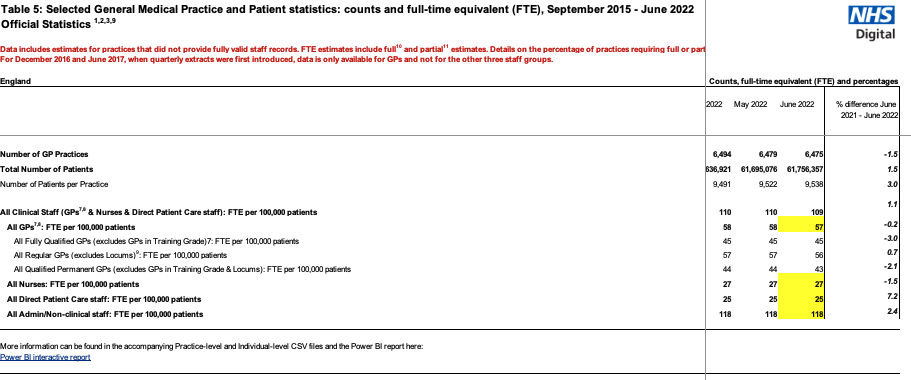

1 Full-Time Equivalent (FTE) refers to the proportion of full time contracted hours that the post holder is contracted to work. 1 would indicate they work a full set of hours (37.5), 0.5 that they worked half time.  In GPs in Training Grade contracts 1 FTE = 40 hours and in this table these FTEs have been converted to the standard wMDS measure of 1 FTE = 37.5 hours for consistency.

The results of this analysis apopear to be consistent with that of the GPW data.

In [167]:
# To add another layer to analysis and take into account deprivation levels.
# Merging with imd_score.csv.

icb_capacity_imd_merged = pd.merge(icb_capacity_merged, imd_score, \
                     how='left', \
                     on='icb_ons_code')

icb_capacity_imd_merged

,icb_ons_code,total_appointments_june22,icb_name_x,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22,june22_appointments_100K,gps_june22_100K,nurses_june22_100K,direct_patient_care_june22_100K,admin_june22_100K,icb_name_y,icb_mean_imd,icb_std_dev_imd
0,E54000008,1128437,Cheshire and Merseyside ICB,2721709,1827,770,506,3567,41460,67,28,18,131,Cheshire and Merseyside ICB,28.24,20.67
1,E54000010,448258,Staffordshire and Stoke-On-Trent ICB,1172941,669,335,291,1454,38216,57,28,24,123,Staffordshire and Stoke-On-Trent ICB,20.70,14.28
2,E54000011,221454,"Shropshire, Telford and Wrekin ICB",520624,307,160,151,637,42536,58,30,29,122,"Shropshire, Telford and Wrekin ICB",20.25,12.48
3,E54000013,377275,Lincolnshire ICB,807427,431,332,441,1151,46725,53,41,54,142,Lincolnshire ICB,20.43,13.77
4,E54000015,547140,"Leicester, Leicestershire and Rutland ICB",1191030,682,280,321,1381,45938,57,23,26,115,"Leicester, Leicestershire and Rutland ICB",18.14,13.81
5,E54000018,430449,Coventry and Warwickshire ICB,1055677,641,233,155,1077,40774,60,22,14,102,Coventry and Warwickshire ICB,19.15,13.25
6,E54000019,409165,Herefordshire and Worcestershire ICB,817738,521,277,292,1105,50036,63,33,35,135,Herefordshire and Worcestershire ICB,18.31,11.68
7,E54000022,536530,Norfolk and Waveney ICB,1082501,631,439,565,1681,49563,58,40,52,155,Norfolk and Waveney ICB,21.70,13.33
8,E54000023,458402,Suffolk and North East Essex ICB,1050121,553,340,419,1326,43652,52,32,39,126,Suffolk and North East Essex ICB,19.24,12.62
9,E54000024,425927,"Bedfordshire, Luton and Milton Keynes ICB",1083260,501,266,258,1141,39319,46,24,23,105,"Bedfordshire, Luton and Milton Keynes ICB",17.95,11.75


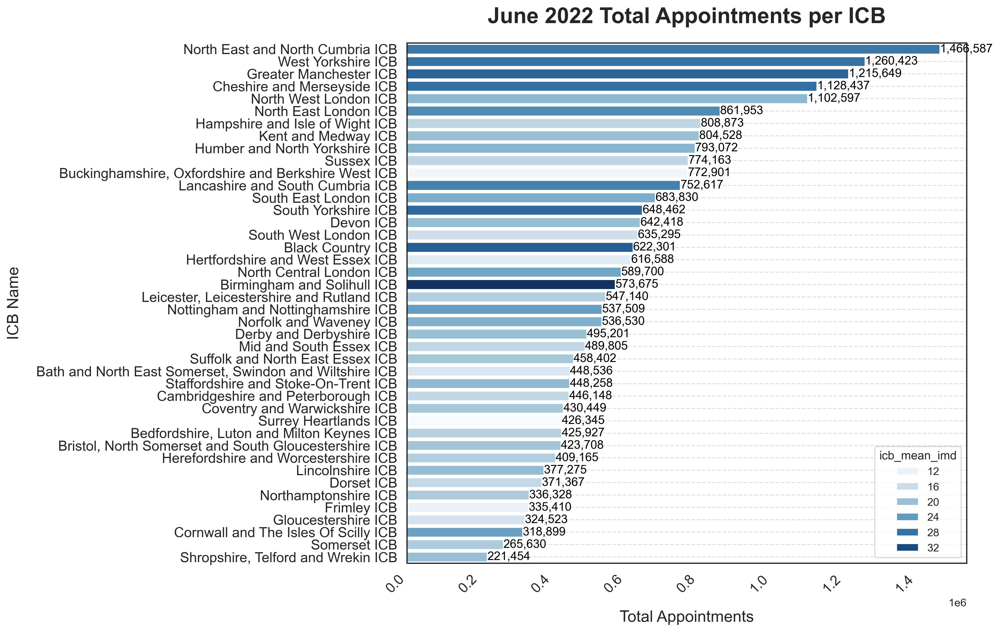

In [168]:
# Sort the DataFrame by 'total_appointments_june22'
icb_appts_sorted = icb_capacity_imd_merged.sort_values('total_appointments_june22', ascending=False)

plt.figure(figsize=(14, 9), dpi=300)

sns.barplot(x='total_appointments_june22', y='icb_name_x', data=icb_appts_sorted, 
            palette='Blues', errorbar=None, hue='icb_mean_imd', dodge=False)

plt.title('June 2022 Total Appointments per ICB', fontsize=22, fontweight='bold', pad=20)
plt.xlabel('Total Appointments', fontsize=16, labelpad=15)
plt.ylabel('ICB Name', fontsize=16, labelpad=15)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Value annotations on top of the bars.
for index, value in enumerate(icb_appts_sorted['total_appointments_june22']):
    plt.text(value, index, f'{value:,.0f}', va='center', ha='left', fontsize=12, color='black')

plt.tight_layout()

#plt.savefig('June 2022 Total Appointments per ICB', dpi=300, bbox_inches='tight')

plt.show()

Key explanatory visualisation.

At first glance it appears that ICBs with higher IMD score (and therefore with the most need), are being allocated more appointments in June 2022.

With a few exceptions (Birmingham and Solihull ICB being the most striking one).

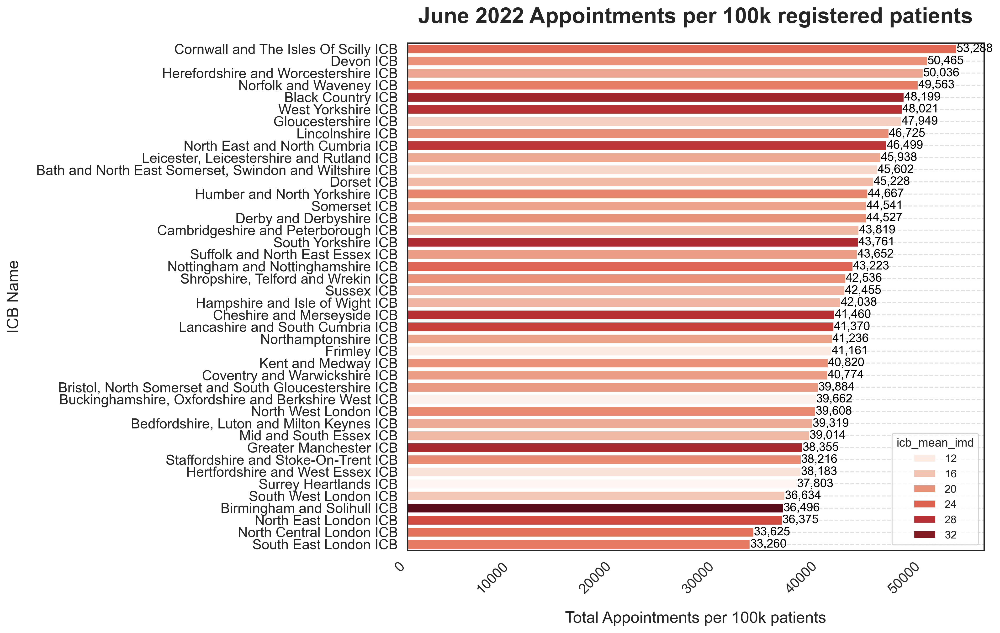

In [169]:
icb_appts_100k = icb_capacity_imd_merged.sort_values('june22_appointments_100K', ascending=False)


plt.figure(figsize=(14, 9), dpi=300)

sns.barplot(x='june22_appointments_100K', y='icb_name_x', data=icb_appts_100k, 
            palette='Reds', errorbar=None, hue='icb_mean_imd', dodge=False)

plt.title('June 2022 Appointments per 100k registered patients', fontsize=22, fontweight='bold', pad=20)
plt.xlabel('Total Appointments per 100k patients', fontsize=16, labelpad=15)
plt.ylabel('ICB Name', fontsize=16, labelpad=15)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Value annotations on top of the bars.
for index, value in enumerate(icb_appts_100k['june22_appointments_100K']):
    plt.text(value, index, f'{value:,.0f}', va='center', ha='left', fontsize=12, color='black')

plt.tight_layout()

#plt.savefig('June 2022 Appointments per 100k registered patients', dpi=300, bbox_inches='tight')

plt.show()

Key explanatory visualisation.

When examined per 100k population, i,e. the number of general practice appointments in June 2022 per 100,000 patients, the inefficient and ineffective allocation of resources is evident. 

The NHS needs to look at this disparity in healthcare provision.

### 9.8.2 Staffing Capacity and Composition of Top 5 ICBs with Highest and Top 5 ICBs with Lowest IMD Mean Scores June 2022

This section looks at staffing along the lines of deprivation level (i.e. need and in turn optimsation of resources - capacity and utilisation).

Please note that this looks at Full-Time Equivalent (FTE) staff resource per 100k patients. 

This was deemed a more accurate measure of true staffing capacity.

1 FTE = 37.5 hours.

E.g. 2 FTE Clinical Pharmacists represent 75 hours per week of capacity. 3 Clinical Pharmacists working a combined 1.35 FTE represent 50.625 hours per week of capacity, even though there may be 3 of them.

In [170]:
staff_100k_imd = icb_capacity_imd_merged.sort_values(by='icb_mean_imd', ascending=False)

staff_100k_imd.reset_index(drop=True, inplace=True)

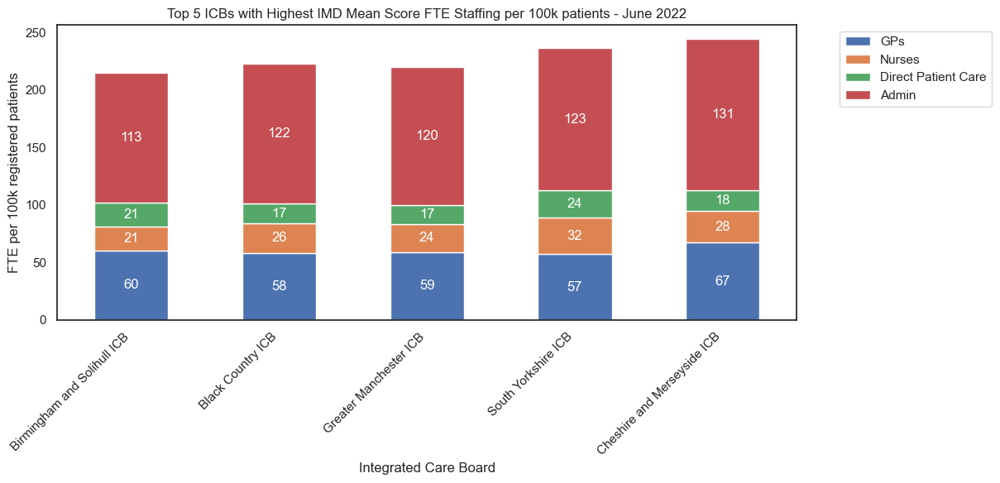

In [171]:
staffing_imd_top5 = {
    'gps_june22_100K': [60, 58, 59, 57, 67],
    'nurses_june22_100k': [21, 26, 24, 32, 28],
    'direct_patient_care_june22_100K': [21, 17, 17, 24, 18],
    'admin_june22_100K': [113, 122, 120, 123, 131],
}

# Create DataFrame.
staffing_imd_top_5 = pd.DataFrame(staffing_imd_top5, index=['Birmingham and Solihull ICB', 'Black Country ICB', 
                                                            'Greater Manchester ICB', 'South Yorkshire ICB', 
                                                            'Cheshire and Merseyside ICB'])

# Plot stacked bar chart.
ax = staffing_imd_top_5.plot(kind='bar', stacked=True, figsize=(10, 6))

# Value annotations.
for i in range(staffing_imd_top_5.shape[0]):
    total = 0
    for j, col in enumerate(staffing_imd_top_5.columns):
        height = staffing_imd_top_5.iloc[i, j]
        ax.text(i, total + height / 2, f'{height}', ha='center', va='center', color='white')
        total += height  # Updates the total to the top of the stacked segment.

plt.title('Top 5 ICBs with Highest IMD Mean Score FTE Staffing per 100k patients - June 2022')
plt.xlabel('Integrated Care Board')
plt.ylabel('FTE per 100k registered patients')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Rename the legend labels.
legend_labels = ['GPs', 'Nurses', 'Direct Patient Care', 'Admin']
plt.legend(labels=legend_labels, bbox_to_anchor=(1.05, 1), loc='upper left')

#plt.savefig('Top 5 ICBs with Highest IMD Mean Score Staffing per 100k patients - June 2022', dpi=300)

plt.show()

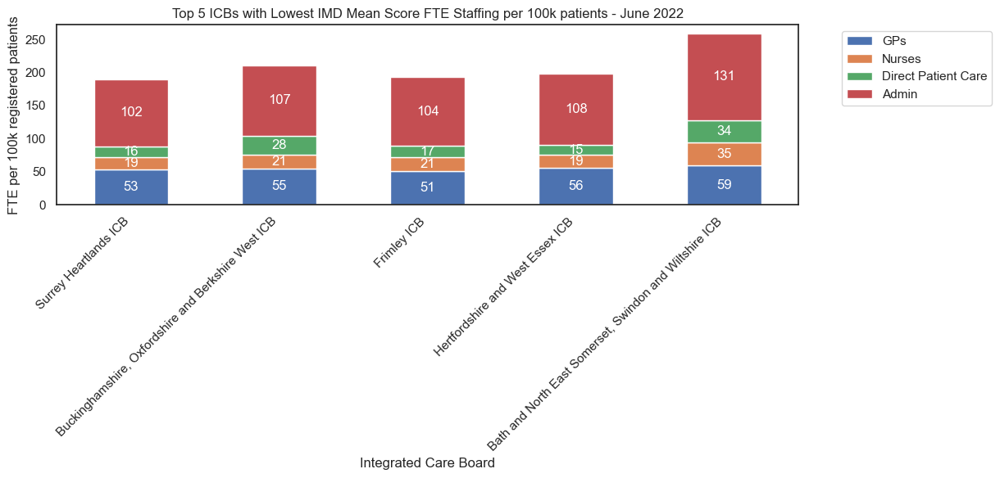

In [172]:
staffing_imd_bottom5 = {
    'gps_june22_100K': [53, 55, 51, 56, 59],
    'nurses_june22_100k': [19, 21, 21, 19, 35],
    'direct_patient_care_june22_100K': [16, 28, 17, 15, 34],
    'admin_june22_100K': [102, 107, 104, 108, 131],
}

# Create DataFrame.
staffing_imd_bottom_5 = pd.DataFrame(staffing_imd_bottom5, index=['Surrey Heartlands ICB', \
                                                                  'Buckinghamshire, Oxfordshire and Berkshire West ICB', 
                                                            'Frimley ICB', 'Hertfordshire and West Essex ICB', 
                                                            'Bath and North East Somerset, Swindon and Wiltshire ICB'])

# Plot stacked bar chart.
ax = staffing_imd_bottom_5.plot(kind='bar', stacked=True, figsize=(10, 6))

# Add value annotations.
for i in range(staffing_imd_bottom_5.shape[0]):
    total = 0
    for j, col in enumerate(staffing_imd_bottom_5.columns):
        height = staffing_imd_bottom_5.iloc[i, j]
        ax.text(i, total + height / 2, f'{height}', ha='center', va='center', color='white')
        total += height  # Updated the total to the top of the stacked segment.

plt.title('Top 5 ICBs with Lowest IMD Mean Score FTE Staffing per 100k patients - June 2022')
plt.xlabel('Integrated Care Board')
plt.ylabel('FTE per 100k registered patients')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Rename the legend labels.
legend_labels = ['GPs', 'Nurses', 'Direct Patient Care', 'Admin']
plt.legend(labels=legend_labels, bbox_to_anchor=(1.05, 1), loc='upper left')

#plt.savefig('Top 5 ICBs with Lowest IMD Mean Score Staffing per 100k patients - June 2022', dpi=300)

plt.show()

In [173]:
staffing_imd_top_5.describe()

,gps_june22_100K,nurses_june22_100k,direct_patient_care_june22_100K,admin_june22_100K
count,5.000000,5.000000,5.00000,5.000000
mean,60.200000,26.200000,19.40000,121.800000
std,3.962323,4.147288,3.04959,6.457554
min,57.000000,21.000000,17.00000,113.000000
25%,58.000000,24.000000,17.00000,120.000000
50%,59.000000,26.000000,18.00000,122.000000
75%,60.000000,28.000000,21.00000,123.000000
max,67.000000,32.000000,24.00000,131.000000


In [174]:
staffing_imd_bottom_5.describe()

,gps_june22_100K,nurses_june22_100k,direct_patient_care_june22_100K,admin_june22_100K
count,5.00000,5.00000,5.000000,5.000000
mean,54.80000,23.00000,22.000000,110.400000
std,3.03315,6.78233,8.514693,11.760102
min,51.00000,19.00000,15.000000,102.000000
25%,53.00000,19.00000,16.000000,104.000000
50%,55.00000,21.00000,17.000000,107.000000
75%,56.00000,21.00000,28.000000,108.000000
max,59.00000,35.00000,34.000000,131.000000


The 5 ICBs with the highest IMD mean score tend to be comparably staffed in terms of numbers when compared to the ICBs with lowest mean IMD score (see below).

However, given the deprivation level, more 'Direct Patient Care' may be needed in the most deprived ICBs. Their healthcare needs are complex and multi-faceted in nature and require multi-disciplinary teams working together (such as in the Whole Systems Integrated Care Pathway inititive). 

Find below the composition of the different staffing elements and in particular All Direct Patient Care.

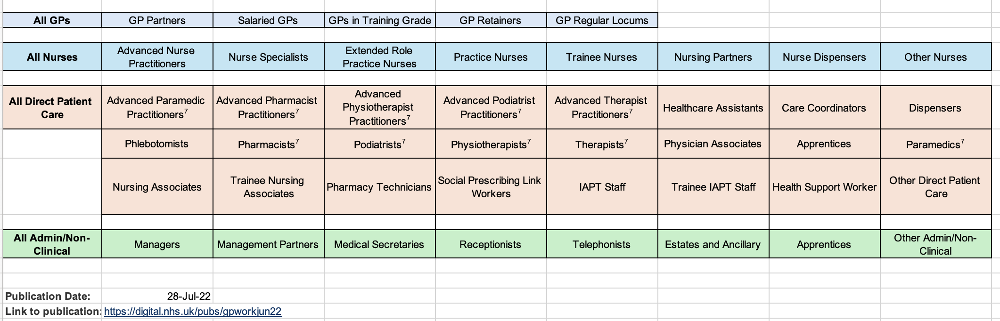

### 9.8.3 A look at Extended Access Provision per ICB in June 2022

In [175]:
icb_ea_merged

,icb_ons_code,total_ea_appointments_june22,icb_name,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22
0,E54000008,7473,Cheshire and Merseyside ICB,2721709,1827,770,506,3567
1,E54000010,3053,Staffordshire and Stoke-On-Trent ICB,1172941,669,335,291,1454
2,E54000011,1739,"Shropshire, Telford and Wrekin ICB",520624,307,160,151,637
3,E54000013,4598,Lincolnshire ICB,807427,431,332,441,1151
4,E54000015,3988,"Leicester, Leicestershire and Rutland ICB",1191030,682,280,321,1381
5,E54000018,2054,Coventry and Warwickshire ICB,1055677,641,233,155,1077
6,E54000019,3952,Herefordshire and Worcestershire ICB,817738,521,277,292,1105
7,E54000022,5180,Norfolk and Waveney ICB,1082501,631,439,565,1681
8,E54000023,1864,Suffolk and North East Essex ICB,1050121,553,340,419,1326
9,E54000024,3000,"Bedfordshire, Luton and Milton Keynes ICB",1083260,501,266,258,1141


In [176]:
# To add another layer to analysis and take into account deprivation levels.
# Merging with imd_score.csv.

icb_ea_imd_merged = pd.merge(icb_ea_merged, imd_score, \
                     how='left', \
                     on='icb_ons_code')

icb_ea_imd_merged

,icb_ons_code,total_ea_appointments_june22,icb_name_x,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22,icb_name_y,icb_mean_imd,icb_std_dev_imd
0,E54000008,7473,Cheshire and Merseyside ICB,2721709,1827,770,506,3567,Cheshire and Merseyside ICB,28.24,20.67
1,E54000010,3053,Staffordshire and Stoke-On-Trent ICB,1172941,669,335,291,1454,Staffordshire and Stoke-On-Trent ICB,20.70,14.28
2,E54000011,1739,"Shropshire, Telford and Wrekin ICB",520624,307,160,151,637,"Shropshire, Telford and Wrekin ICB",20.25,12.48
3,E54000013,4598,Lincolnshire ICB,807427,431,332,441,1151,Lincolnshire ICB,20.43,13.77
4,E54000015,3988,"Leicester, Leicestershire and Rutland ICB",1191030,682,280,321,1381,"Leicester, Leicestershire and Rutland ICB",18.14,13.81
5,E54000018,2054,Coventry and Warwickshire ICB,1055677,641,233,155,1077,Coventry and Warwickshire ICB,19.15,13.25
6,E54000019,3952,Herefordshire and Worcestershire ICB,817738,521,277,292,1105,Herefordshire and Worcestershire ICB,18.31,11.68
7,E54000022,5180,Norfolk and Waveney ICB,1082501,631,439,565,1681,Norfolk and Waveney ICB,21.70,13.33
8,E54000023,1864,Suffolk and North East Essex ICB,1050121,553,340,419,1326,Suffolk and North East Essex ICB,19.24,12.62
9,E54000024,3000,"Bedfordshire, Luton and Milton Keynes ICB",1083260,501,266,258,1141,"Bedfordshire, Luton and Milton Keynes ICB",17.95,11.75


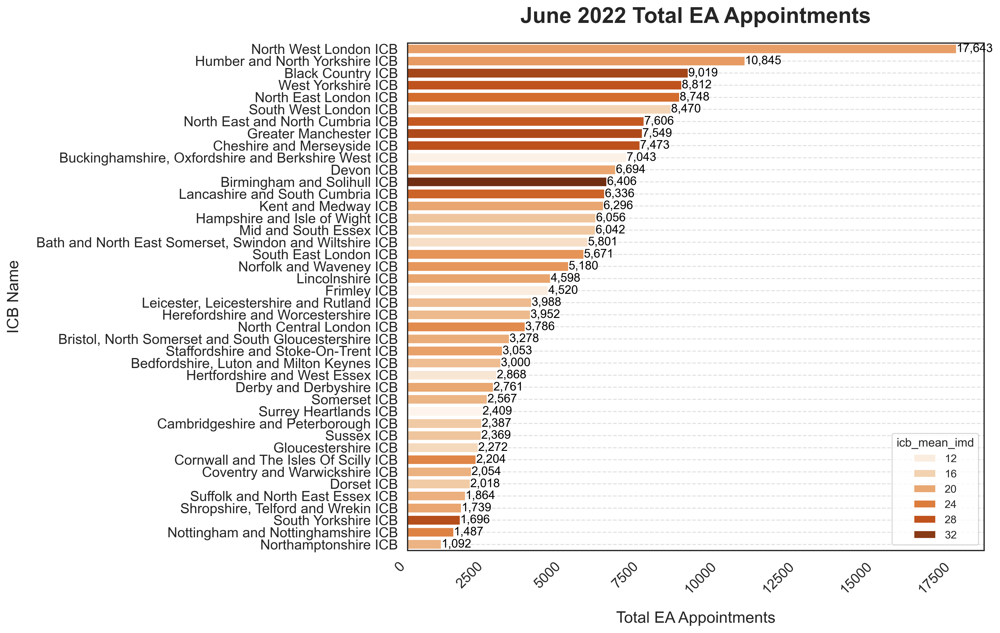

In [177]:
# Sort by 'total_ea_appointments_june22'
ea_june22_appt_sorted = icb_ea_imd_merged.sort_values('total_ea_appointments_june22', ascending=False)


plt.figure(figsize=(14, 9), dpi=300)

sns.barplot(x='total_ea_appointments_june22', y='icb_name_x', data=ea_june22_appt_sorted, \
            palette='Oranges', errorbar=None, hue='icb_mean_imd', dodge=False)

plt.title('June 2022 Total EA Appointments', fontsize=22, fontweight='bold', pad=20)
plt.xlabel('Total EA Appointments', fontsize=16, labelpad=15)
plt.ylabel('ICB Name', fontsize=16, labelpad=15)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Value annotations on top of the barrs.
for index, value in enumerate(ea_june22_appt_sorted['total_ea_appointments_june22']):
    plt.text(value, index, f'{value:,.0f}', va='center', ha='left', fontsize=12, color='black')

plt.tight_layout()

#plt.savefig('June 2022 Total EA Appointments', dpi=300, bbox_inches='tight')

plt.show()

Key explanatory visualisation - linked to the one below.

Similar to overall appointments, total EA appointments appear to be structured towards the ICBs requiring better access given deprivation levels (with a few exceptions).

In [178]:
# To work out June 2022 EA ICB appointments by capita.

ea_june22_appt_sorted['june22_ea_appointments_100K'] = (ea_june22_appt_sorted['total_ea_appointments_june22'] / \
                                                    ea_june22_appt_sorted['icb_registered_patients_01jul22'] \
                                                    * 100000).astype(int)

ea_june22_appt_sorted

,icb_ons_code,total_ea_appointments_june22,icb_name_x,icb_registered_patients_01jul22,gps_fte_jun22,nurses_fte_jun22,direct_patient_care_fte_jun22,admin_fte_jun22,icb_name_y,icb_mean_imd,icb_std_dev_imd,june22_ea_appointments_100K
12,E54000027,17643,North West London ICB,2783747,1271,381,438,2336,North West London ICB,20.92,10.14,633
30,E54000051,10845,Humber and North Yorkshire ICB,1775517,1034,632,793,2429,Humber and North Yorkshire ICB,21.24,17.94,610
41,E54000062,9019,Black Country ICB,1291082,761,346,230,1587,Black Country ICB,29.88,15.27,698
33,E54000054,8812,West Yorkshire ICB,2624690,1524,808,648,3153,West Yorkshire ICB,27.93,17.84,335
14,E54000029,8748,North East London ICB,2369624,1128,351,335,2217,North East London ICB,25.56,10.31,369
16,E54000031,8470,South West London ICB,1734157,945,290,271,1619,South West London ICB,15.65,9.79,488
29,E54000050,7606,North East and North Cumbria ICB,3153971,1910,1155,868,4264,North East and North Cumbria ICB,27.45,17.69,241
36,E54000057,7549,Greater Manchester ICB,3169421,1887,777,569,3805,Greater Manchester ICB,29.30,18.25,238
0,E54000008,7473,Cheshire and Merseyside ICB,2721709,1827,770,506,3567,Cheshire and Merseyside ICB,28.24,20.67,274
27,E54000044,7043,"Buckinghamshire, Oxfordshire and Berkshire West ICB",1948711,1087,427,552,2100,"Buckinghamshire, Oxfordshire and Berkshire West ICB",11.16,8.53,361


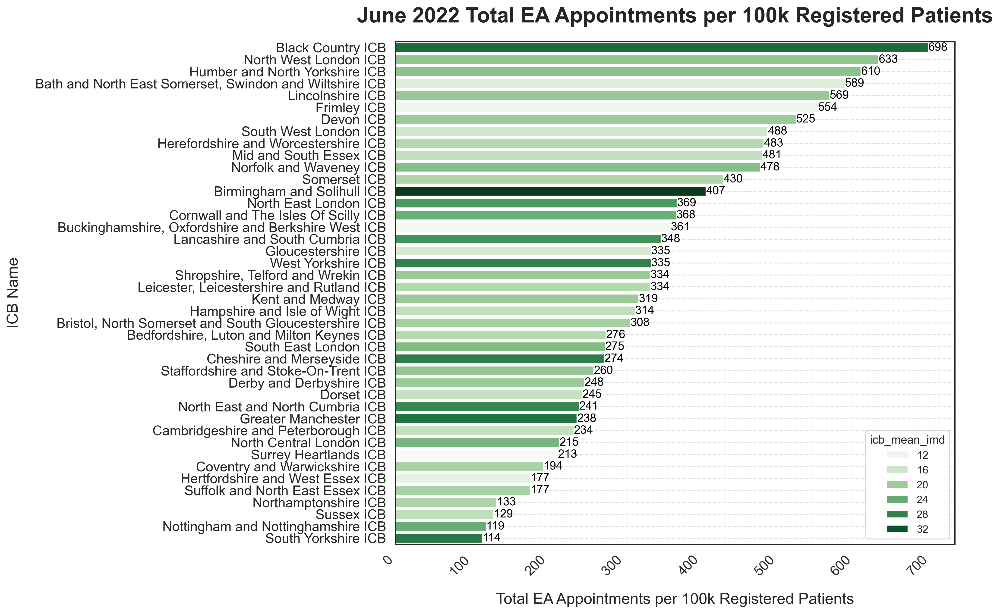

In [179]:
# Sort the DataFrame by 'total_appointments_june22'
ea_june22_appt_sorted = ea_june22_appt_sorted.sort_values('june22_ea_appointments_100K', ascending=False)


plt.figure(figsize=(14, 9), dpi=300)

sns.barplot(x='june22_ea_appointments_100K', y='icb_name_x', data=ea_june22_appt_sorted, \
            palette='Greens', errorbar=None, hue='icb_mean_imd', dodge=False)

plt.title('June 2022 Total EA Appointments per 100k Registered Patients', fontsize=22, fontweight='bold', pad=20)
plt.xlabel('Total EA Appointments per 100k Registered Patients', fontsize=16, labelpad=15)
plt.ylabel('ICB Name', fontsize=16, labelpad=15)
plt.xticks(rotation=45, ha='right', fontsize=14)
plt.yticks(fontsize=14)
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Value annotations on top of the bars.
for index, value in enumerate(ea_june22_appt_sorted['june22_ea_appointments_100K']):
    plt.text(value, index, f'{value:,.0f}', va='center', ha='left', fontsize=12, color='black')

plt.tight_layout()

#plt.savefig('June 2022 Total EA Appointments per 100k Registered Patients', dpi=300, bbox_inches='tight')

plt.show()

Key explanatory visualisation. 

The outlook is different when looking at per 100k registered patients.

Other than Black Country ICB, better access provisions are directed towards relatively more affluent areas.

This misallocation costs the NHS money in the long run and spills over into secondary care.

# ***End of notebook***